Day6　まとめ

＜　通し課題　＞
+ 日本の気象データを用いて、異常を検知せよ
+ どんな異常を検知したいかは各自定義すること
+ 日本の気象データ以外のデータも利用してよい
+ その異常を検知できることは、社会にとって有益であること
+ 外れ値検出、変化点検知、異常部位検出のいずれでもよい
+ 構築した異常検知モデルの性能評価方法も各自で決めること
+ 課題の成果は、なるべくウェブで公開し、各自のポートフォリオにすること
+ 公開先は、GithubやGistなど
+ 非公開にしたい場合は、Slackの所属チャンネルにipynbファイルを直接貼ってもよい

v1.0 作成  
v2.0 
+ 従来の時間別データに、日別データを追加または差替　　  
+ 各手法の簡単なまとめ  
+ その他主な変更／追加  
      * 年度　（2016-2018：３年間　→ 2008-2018：１１年間）  
      * 拠点　（東京、大坂、名古屋：３地点　→　東京、大坂、名古屋、北海道、甲府、福岡、那覇：７地点）  
      * ラベル相当（搬送者＋内訳：高齢者など）  
      * 各気象データと拠点の傾向（ヒストグラム）、WBGTと搬送者との関係（散布図）  
      * 一次元正規分布ホテリングT2性能評価  
      * グラフィカルラッソの関連性の有無について追加確認  
      * ガウス過程の予測を１月から５年間に  

# 背景

地球温暖化による気候変動は止まることがなく、その影響は日本を含む世界中の様々な分野で顕在化している。その影響は地域によって違いがあるものの、自然環境や生態系だけでなく社会や経済の分野においても様々な影響が既に	生じており、将来、悪影響がさらに拡大することが懸念されている。	
（「気候変動の観測・予測及び影響評価総合レポート２０１８」気象庁HP）

表１　地球規模の気候変動をもたらす主な要因
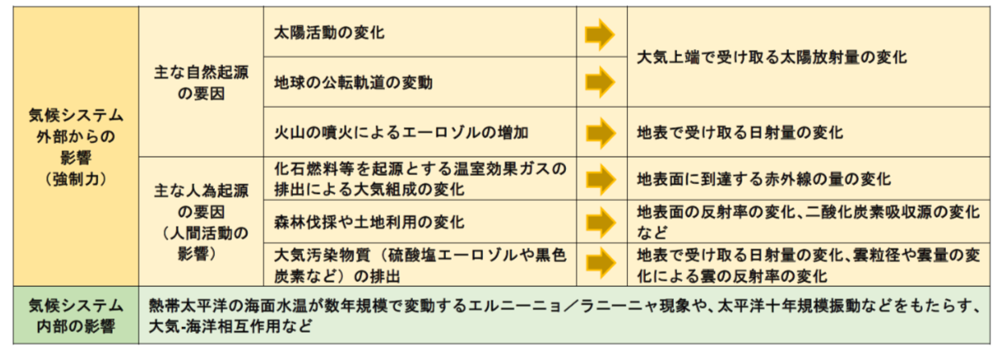

図１　  気候変動の主な要因
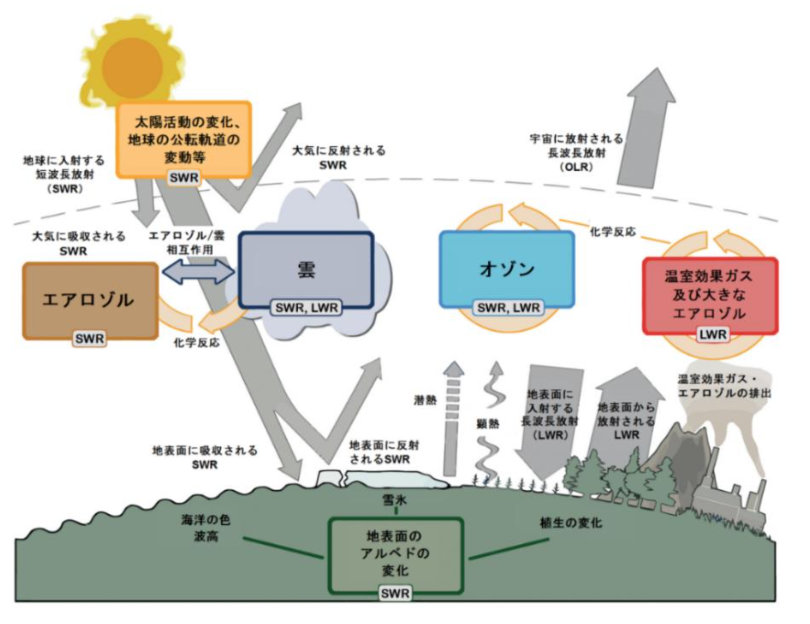

図２　世界平均のエネルギー収支
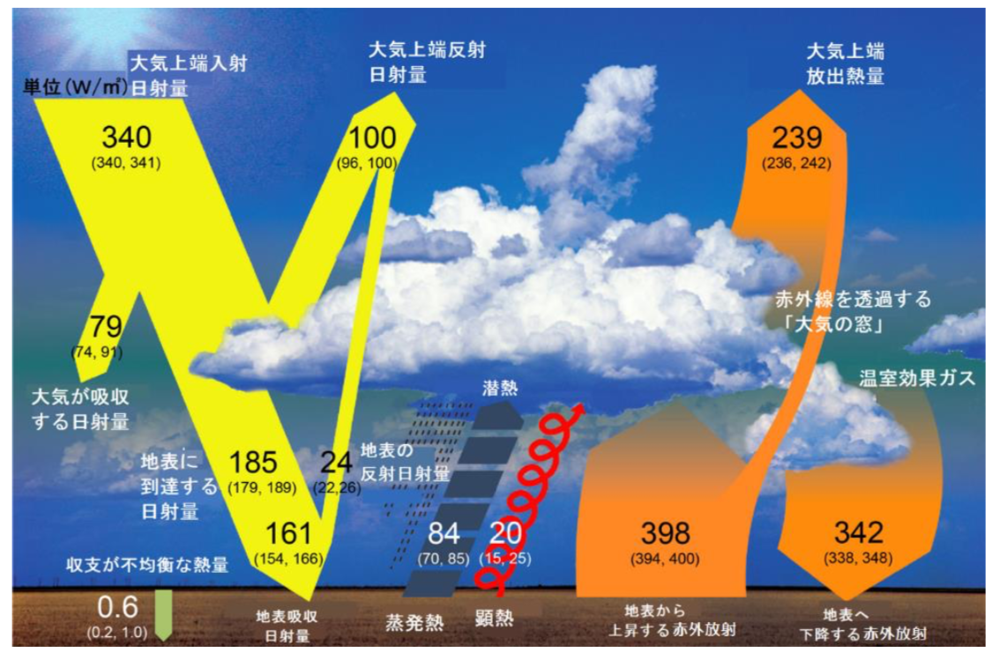

放射強制力の合計は正で あり、気候システムによるエネルギー の吸収をもたらしている。<u>1750 年を基準とした 2011 年の人為起源の放射強制力は、総計すると 2.29(1.13~3.33)W/m2 であり(図 3)、1970 年以降は急速に増加</u>している。


図３　放射強制力の推定値
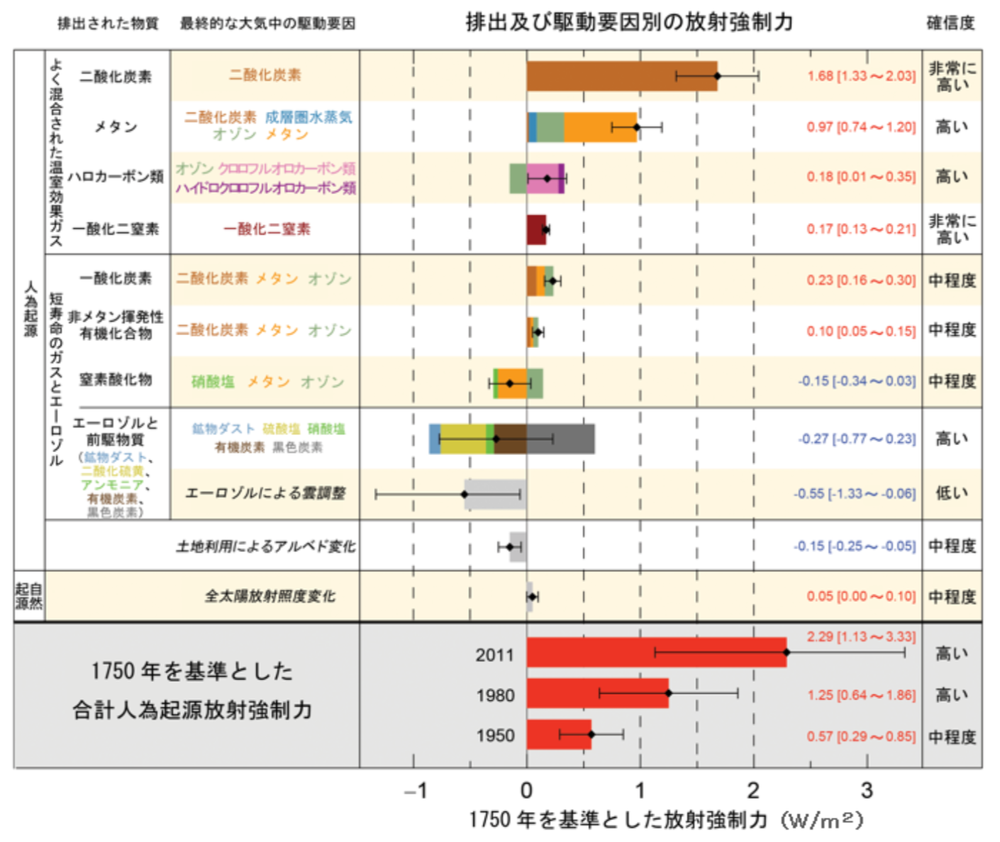

2016 年の二酸化 炭素、メタン、一酸化二窒素の地上での世界平均濃度は、それぞれ 403.3ppm、1,853ppb、 328.9ppb となり、<u>最高値を更新</u>している (表 2、図４)


表２　主な温室効果ガスの世界平均濃度
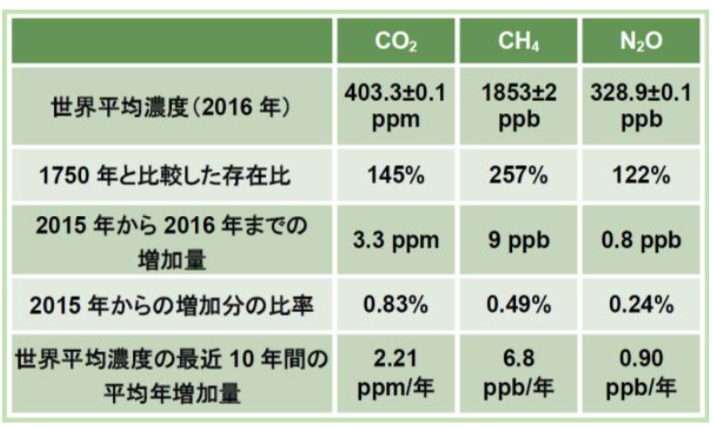

季節変動は主として植物の活動によって生じてお り、夏季に植物の光合成が活発化することで濃度が減少し、冬季には植物の呼吸や土壌有機物の分解活動が優勢となって濃度が上昇する。

図４　大気中の二酸化炭素(CO2)の 世界平均濃度の変化
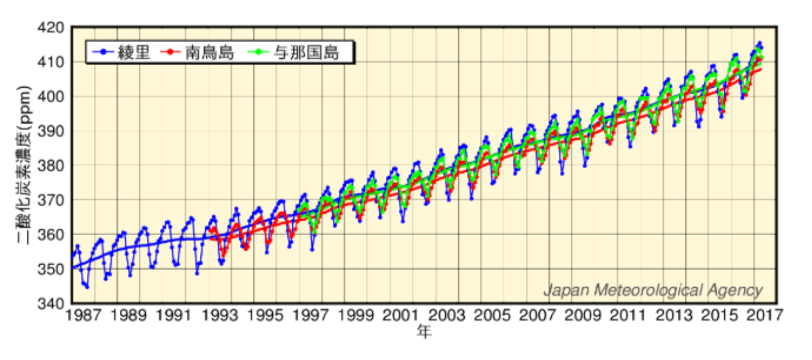
図 ５ 日本における大気中の二酸化炭素平均濃度の経年変化
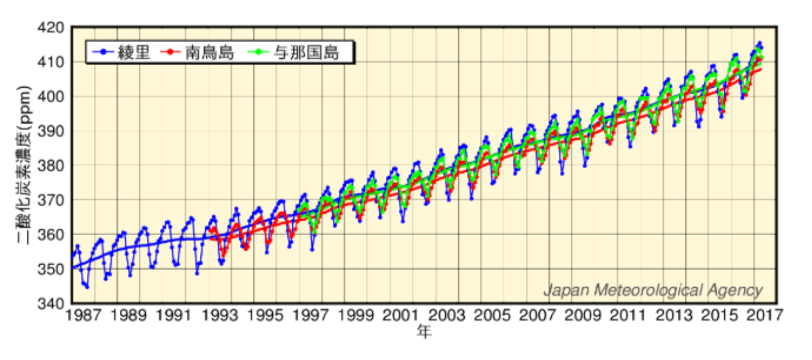

緯度帯による濃度差は、人間活動による二酸化炭素の放出源が北半球に多く存在することにより主に生じており、相対的に北半球の中・高緯度帯で濃度が高く、南半球で濃度が低い。季節変動の振幅は北半球の中・高緯度ほど大きく、陸域の面積の少ない南半球では小さい。

図６　二酸化炭素濃度の分布（２０１２年）
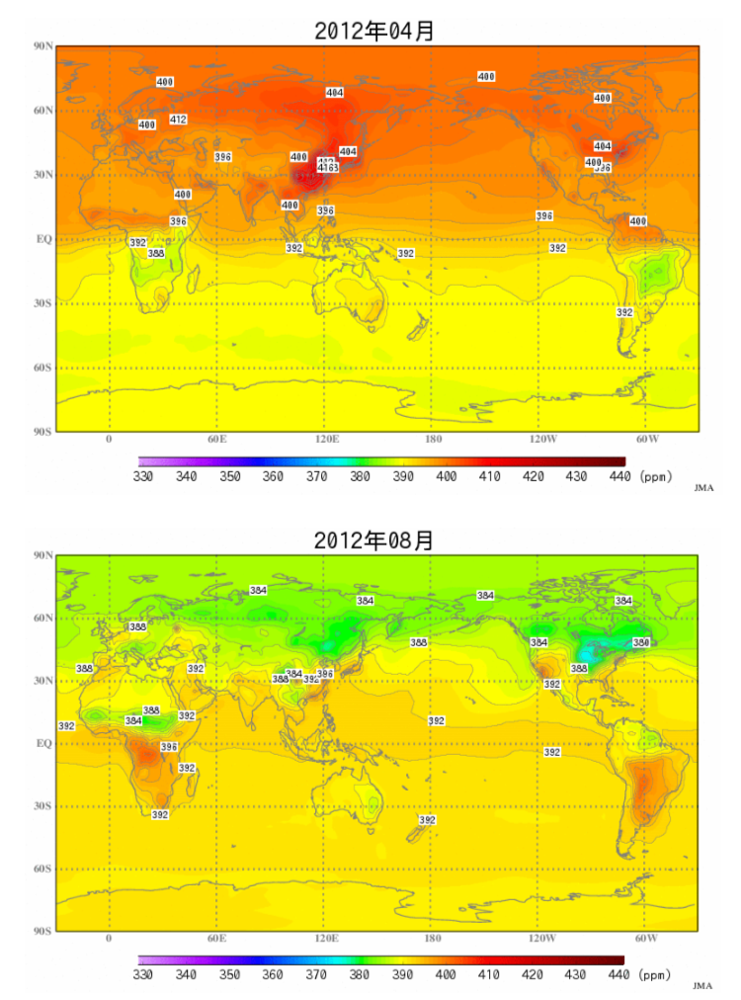

気候変動予測では、気候モデルに与える人為起源による放射強制力の変化の仮定(シナリオ)が 必要になる。放射強制力として影響の最も大きい温室効果ガス濃度を知るためには、その排出量の予測値が必要であるが、これは今後の経済成長や人口増加、エネルギー需給、科学技術の発展・普及等により異なるため、これら社会的・経済的な 将来像を検討しなければならない。

IPCC（気候変動に関する政府間パネル: Intergovernmental Panel on Climate Change）では政策的な緩和策を前提として、 将来、温室効果ガスをどのような濃度に安定化させるかという考え方から、その「代表的濃度経路 (Representative Concentration Pathways　：RCP40、以下「RCP」という)」を示している。

RCPシナリオは、2100年における単位面積あたりの放射強制力の増加量(W/m2)をもとに4つのシナリオが存在する。4つのシナリオには、 放射強制力の大きさの違いに応じて、2100 年以降も放射強制力の上昇が続く「高位参照シナリオ」 (RCP8.5。8.5W/m2 の増加)、2100 年までにピークを迎えその後減少する「低位安定化シナリオ」(RCP2.6)、 これらの間に位置して2100年以降に安定化する 「高位安定化シナリオ」(RCP6.0)及び 「中位安定化シナリオ」(RCP4.5)が選択されている。

図７　RCPシナリオと化石燃料起源二酸化炭素排出量
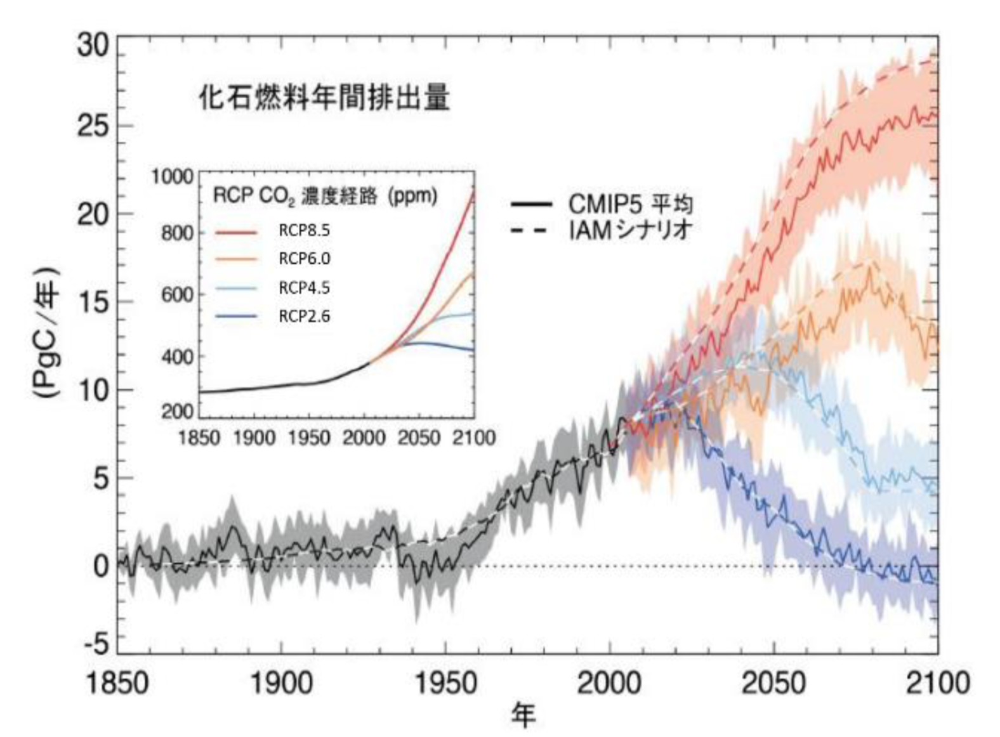

図８　RCPシナリオとCO２累積排出量、世界平均地上気温上昇量
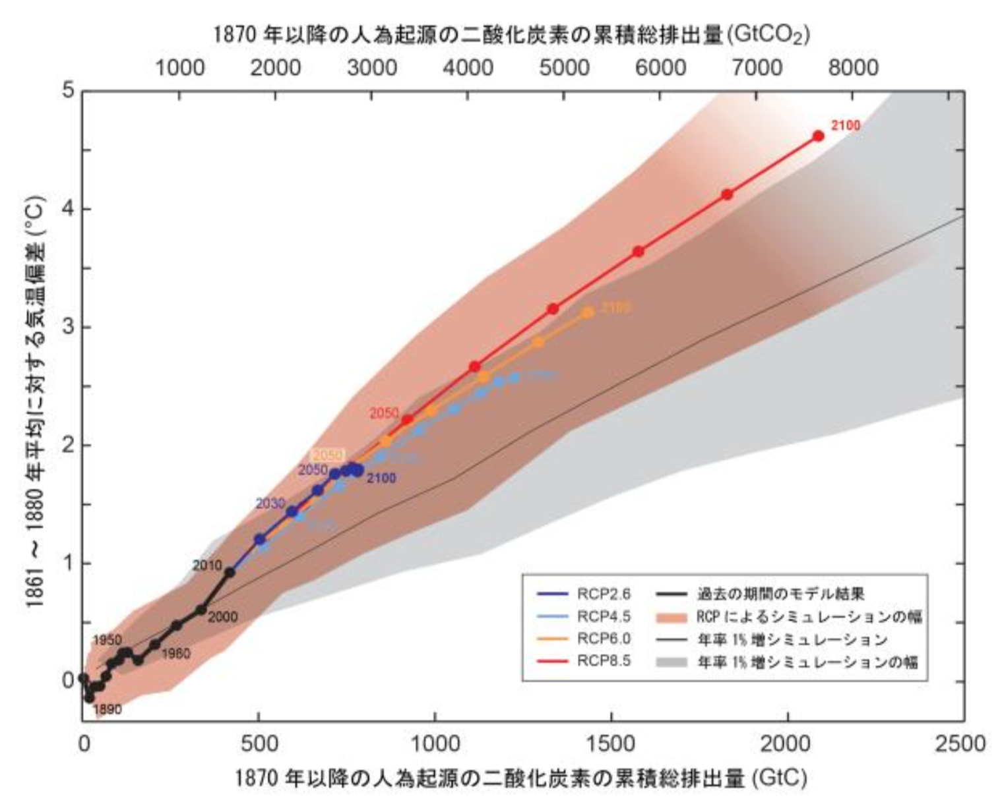

IPCC第6次評価報告書では、土地利用変化等 の社会経済的要素の違いを放射強制力等の計算条件に取り入れて、気候影響や緩和策と整合的な影響評価を行うことを目的に、RCP と「共有社会経済経路(SSP42、以下「SSP」という)」を組み合わせたシナリオに基づく気候予測が行われる見込み。

SSPシナリオは、人口、ガバナ ンス、公平性、社会経済開発、技術、環境等の共通に社会像の諸条件を示す定量・定性的な要素からなり、気候変動影響評価と緩和・適応政策分析の前提条件として利用できる。緩和の困難度と適応の困難度の大きさにより5種類が想定されている。

図９　SSPシナリオのコンセプト
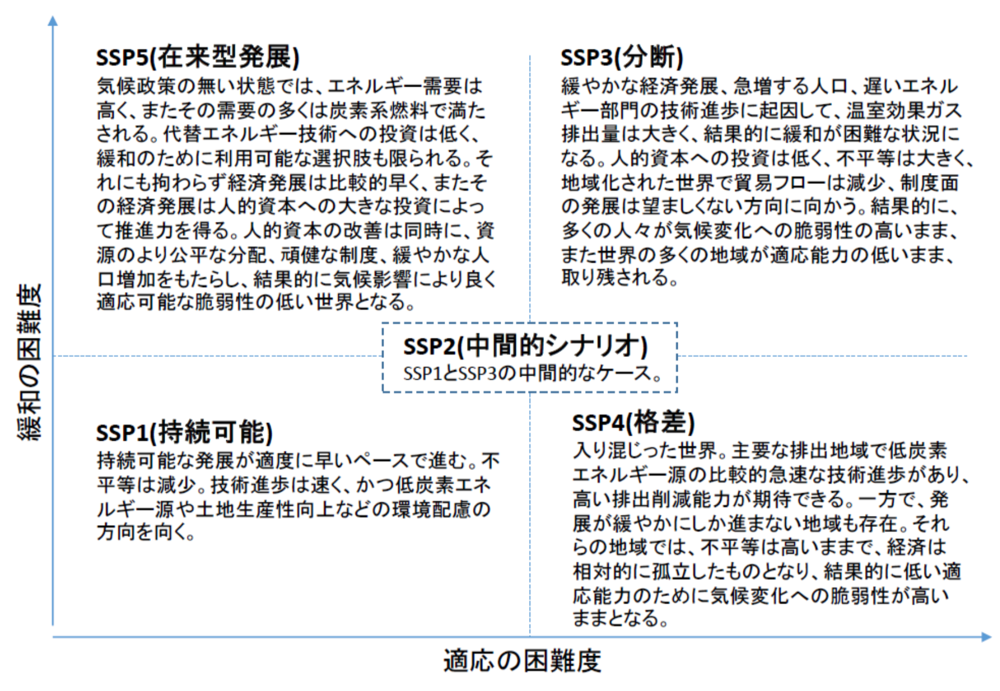

世界の年平均気温は19 世紀後半以降100 年あたり 0.72°Cの割合で上昇している。21世紀末には、 RCP2.6 シナリオで 0.3~1.7°C、RCP8.5 シナリオで 2.6~4.8°C上昇すると予測されている。

<u>日本の気温上昇は世界の平均より早い速度で上昇</u>しており、100 年あたり 1.19°Cの割合で上昇している。<u>21世紀末には、RCP2.6 シナリオで 0.5~1.7°C、RCP8.5 シナリオで 3.4~5.4°C上昇すると予測</u>され、低緯度より高緯度の方が、気温上昇が大きい傾向が見られる。

# 検知すべき異常について

1 目的  

日本の気温上昇は世界の平均より早い速度で上昇しており、100 年あたり 1.19°Cの割合で上昇している。21世紀末には、RCP2.6 シナリオで 0.5~1.7°C、RCP8.5 シナリオ（※１）で 3.4~5.4°C上昇すると予測されている。
今後とも気温上昇が見込まれる中で暑さ指数（※２）に相当する計測可能なデータと基本的な手法を用いて日射病予防となるような異常気象を検出する。　　


2 異常検知を行う意義  

熱中症搬送者数は年によって差異あるものの気温上昇とともに増加するリスクが高まっている。熱中症のリスクを示す指標として「WGBT」が、「日最高気温」よりも熱中症発生と強い関連性を示すとの報告（2007）もあり、産業界では広く活用されている。ただし、WGBTは「通常の気象要素」として観測されていない黒球温度を含むため、簡易的な指標として自然通風湿球温度の代替として強制通風湿球温度を用いて試算され公開されている（※３）。

この「通常の気象要素」の中には環境省から「生活の場における暑さ指数」が参考まで提示されているものの「暑さ指数 WGBT」の実況値と予測値に、独自の観測で得られた差を加えて補正した数値であり、これらはあくまで生活の場の暑熱環境の目安に過ぎないことに注意が必要である。特に、それぞれの生活の場では、同じような環境であっても周囲の建物の配置や日射や風の状況により、さらに厳しい条件となることも予想される。
また、実際の生活の場では、可能な限り暑さ指数（WBGT）を測定し、熱中症に備えること、また暑さ指数を測定できない場合でも、気温などを測定し、暑さに対し常に注意を払う必要がある。

そこで、

①<font color="RED">強制通風湿球温度を用いたWBGT簡易試算（※３、推定式根拠データ：2008年）から10年経過</font>したことから、現在の環境下における適切な異常検知方法を模索するとともに、  
②官公庁の暑さ指数などの公表情報を受動的に利用するだけでなく、<font color="RED">WBGTに相当する暑さの異常を自主的な検知によって、前広に必要な資材（※４）を計画的に手配するなどより柔軟な熱中症対策を行うことが可能</font>

と思われる。


※１）IPCC（気候変動に関する政府間パネル: Intergovernmental Panel on Climate Change）では政策的な緩和策を前提として、 将来、温室効果ガスをどのような濃度に安定化させるかという考え方から、その「代表的濃度経路 (Representative Concentration Pathways　：RCP40、以下「RCP」という)」を示している。

※２）熱中症に関連する、気温、湿度、日射・輻射 、風の要素を積極的に取り入れた指標として、暑さ指数(WBGT:Wet Bulb Globe Temperature:湿球黒球温度)があり、特に 高温環境の指標として労働や運動時の予防措置に用いられている。（ISO7243/JISZ8504)

※３）  小野雅司ら(2014)：通常観測気象要素を用いたWBGTの推定．日生気誌，50(4)，147-157. doi:10.11227/seikisho.50.147  

WBGT＝0.735×Ta＋0.0374×RH＋0.00292×Ta×RH＋7.619×SR－4.557×SR2－0.0572×WS－4.064  
（Ta：気温（℃）、RH：相対湿度（％）、SR：全天日射量（kW/m2)、WS：平均風速(m/s)）  

※４）　人工日除け、微細ミスト、送風ファン、自動販売機の設置など  

# module

In [855]:
# import
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

import seaborn as sns
import pandas as pd
from pandas.plotting import scatter_matrix
from datetime import datetime as dt

from mpl_toolkits.mplot3d import axes3d
from pylab import *  #コンタ描画用


import scipy.stats as stats #統計に関するライブラリ
from matplotlib.lines import Line2D  

import statsmodels.api as sm
from scipy.ndimage.interpolation import shift
import scipy
from sklearn.svm import SVR

from sklearn.linear_model import LinearRegression,RANSACRegressor
from sklearn.linear_model import LinearRegression
from sklearn import cluster, covariance, manifold

from sklearn.covariance import GraphLasso
import sklearn
from sklearn.preprocessing import StandardScaler
from IPython.display import Image, display

from sklearn.metrics.pairwise import rbf_kernel
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.gaussian_process import kernels as sk_kern

from sklearn.neighbors import LocalOutlierFactor

import scipy.stats as stats
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score, roc_curve

import pydot # for node plot with graphviz

import matplotlib.font_manager
from sklearn import svm

from sklearn.ensemble import IsolationForest

import warnings
import math
import random


#from pandas.plotting import scatter_matrix

%matplotlib inline

warnings.filterwarnings('ignore')

# data

使用したデータ  
・2008-2018（7-9月）の主要都市の日最大気温、日平均湿度、全天日射量日合計、平均風速（＠気象庁）  
・2008-2018（7-9月）の日射病患者搬送車数（＠消防庁）   

In [856]:
# excel data loading
df_data = pd.read_excel(
    'data/hot/data0818h.xlsx', index_col='date', parse_dates=['date'])

# wbgt
ta = df_data["temp_max"]
ws = df_data["wind_speed_ave"]
sr = df_data["sr_sum"]
rh = df_data["relative_humidity_ave"]
wbgt = []
wbgt = 0.735 * ta + 0.0374 * rh + 0.00292 * ta * rh + 7.619 * sr / 24 - 4.557 * (
    sr / 24)**2 - 0.0572 * ws - 4.064
wbgt = pd.DataFrame(wbgt, columns=["wbgt"])

# dataframe (4 data +  wbgt )
dfw = pd.concat([df_data, wbgt], axis=1)

# drop
dfw.dropna(inplace=True)

# wbgt value
wbgt = dfw["wbgt"].values

dfw = dfw.sort_values('total_hansou', ascending=False).reset_index()

## data plot

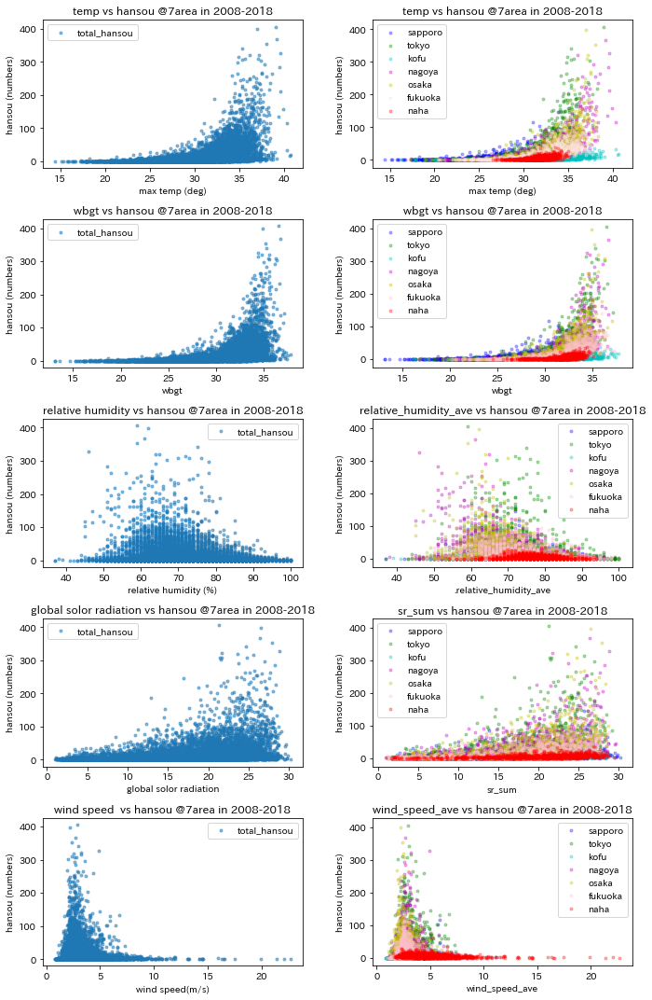

In [319]:
# data plot

fig,ax = plt.subplots(5,2,figsize=(10,15))

# temp vs hansou @7area in 2008-2018
ax[0,0].scatter(x=dfw["temp_max"],y=dfw["total_hansou"],marker=".",alpha=0.5)
ax[0,0].set_xlabel("max temp (deg)")
ax[0,0].set_ylabel("hansou (numbers)")
ax[0,0].set_title("temp vs hansou @7area in 2008-2018")
ax[0,0].legend()

# temp each pref 
ax[0,1].scatter(dfw[dfw["pref"] == 'sapporo'].temp_max,
            dfw[dfw["pref"] == 'sapporo'].total_hansou,c='b',label='sapporo',marker=".",alpha=0.3)
ax[0,1].scatter(dfw[dfw["pref"] == 'tokyo'].temp_max,
            dfw[dfw["pref"] == 'tokyo'].total_hansou,c='g',label='tokyo',marker=".",alpha=0.3)
ax[0,1].scatter(dfw[dfw["pref"] == 'kofu'].temp_max,
            dfw[dfw["pref"] == 'kofu'].total_hansou,c='c',label='kofu',marker=".",alpha=0.3)
ax[0,1].scatter(dfw[dfw["pref"] == 'nagoya'].temp_max,
            dfw[dfw["pref"] == 'nagoya'].total_hansou,c='m',label='nagoya',marker=".",alpha=0.3)
ax[0,1].scatter(dfw[dfw["pref"] == 'osaka'].temp_max,
            dfw[dfw["pref"] == 'osaka'].total_hansou,c='y',label='osaka',marker=".",alpha=0.3)
ax[0,1].scatter(dfw[dfw["pref"] == 'fukuoka'].temp_max,
            dfw[dfw["pref"] == 'fukuoka'].total_hansou,c='mistyrose',label='fukuoka',marker=".",alpha=0.3)
ax[0,1].scatter(dfw[dfw["pref"] == 'naha'].temp_max,
            dfw[dfw["pref"] == 'naha'].total_hansou,c='r',label='naha',marker=".",alpha=0.3)
ax[0,1].set_xlabel("max temp (deg)")
ax[0,1].set_ylabel("hansou (numbers)")
ax[0,1].set_title("temp vs hansou @7area in 2008-2018")
ax[0,1].legend()

# wbgt
ax[1,0].scatter(x=dfw["wbgt"],y=dfw["total_hansou"],marker=".",alpha=0.5)
ax[1,0].set_xlabel("wbgt")
ax[1,0].set_ylabel("hansou (numbers)")
ax[1,0].set_title("wbgt vs hansou @7area in 2008-2018")
ax[1,0].legend()

# wbgt each pref
ax[1,1].scatter(dfw[dfw["pref"] == 'sapporo'].wbgt,
            dfw[dfw["pref"] == 'sapporo'].total_hansou,c='b',label='sapporo',marker=".",alpha=0.3)
ax[1,1].scatter(dfw[dfw["pref"] == 'tokyo'].wbgt,
            dfw[dfw["pref"] == 'tokyo'].total_hansou,c='g',label='tokyo',marker=".",alpha=0.3)
ax[1,1].scatter(dfw[dfw["pref"] == 'kofu'].wbgt,
            dfw[dfw["pref"] == 'kofu'].total_hansou,c='c',label='kofu',marker=".",alpha=0.3)
ax[1,1].scatter(dfw[dfw["pref"] == 'nagoya'].wbgt,
            dfw[dfw["pref"] == 'nagoya'].total_hansou,c='m',label='nagoya',marker=".",alpha=0.3)
ax[1,1].scatter(dfw[dfw["pref"] == 'osaka'].wbgt,
            dfw[dfw["pref"] == 'osaka'].total_hansou,c='y',label='osaka',marker=".",alpha=0.3)
ax[1,1].scatter(dfw[dfw["pref"] == 'fukuoka'].wbgt,
            dfw[dfw["pref"] == 'fukuoka'].total_hansou,c='pink',label='fukuoka',marker=".",alpha=0.3)
ax[1,1].scatter(dfw[dfw["pref"] == 'naha'].wbgt,
            dfw[dfw["pref"] == 'naha'].total_hansou,c='r',label='naha',marker=".",alpha=0.3)
ax[1,1].set_xlabel("wbgt")
ax[1,1].set_ylabel("hansou (numbers)")
ax[1,1].set_title("wbgt vs hansou @7area in 2008-2018")
ax[1,1].legend()

# relative humidity
ax[2,0].scatter(x=dfw["relative_humidity_ave"],y=dfw["total_hansou"],marker=".",alpha=0.5)
ax[2,0].set_xlabel("relative humidity (%)")
ax[2,0].set_ylabel("hansou (numbers)")
ax[2,0].set_title("relative humidity vs hansou @7area in 2008-2018")
ax[2,0].legend()

# relative humidity each pref
ax[2,1].scatter(dfw[dfw["pref"] == 'sapporo'].relative_humidity_ave,
            dfw[dfw["pref"] == 'sapporo'].total_hansou,c='b',label='sapporo',marker=".",alpha=0.3)
ax[2,1].scatter(dfw[dfw["pref"] == 'tokyo'].relative_humidity_ave,
            dfw[dfw["pref"] == 'tokyo'].total_hansou,c='g',label='tokyo',marker=".",alpha=0.3)
ax[2,1].scatter(dfw[dfw["pref"] == 'kofu'].relative_humidity_ave,
            dfw[dfw["pref"] == 'kofu'].total_hansou,c='c',label='kofu',marker=".",alpha=0.3)
ax[2,1].scatter(dfw[dfw["pref"] == 'nagoya'].relative_humidity_ave,
            dfw[dfw["pref"] == 'nagoya'].total_hansou,c='m',label='nagoya',marker=".",alpha=0.3)
ax[2,1].scatter(dfw[dfw["pref"] == 'osaka'].relative_humidity_ave,
            dfw[dfw["pref"] == 'osaka'].total_hansou,c='y',label='osaka',marker=".",alpha=0.3)
ax[2,1].scatter(dfw[dfw["pref"] == 'fukuoka'].relative_humidity_ave,
            dfw[dfw["pref"] == 'fukuoka'].total_hansou,c='pink',label='fukuoka',marker=".",alpha=0.3)
ax[2,1].scatter(dfw[dfw["pref"] == 'naha'].relative_humidity_ave,
            dfw[dfw["pref"] == 'naha'].total_hansou,c='r',label='naha',marker=".",alpha=0.3)
ax[2,1].set_xlabel(".relative_humidity_ave")
ax[2,1].set_ylabel("hansou (numbers)")
ax[2,1].set_title("relative_humidity_ave vs hansou @7area in 2008-2018")
ax[2,1].legend()

# solor radiation
ax[3,0].scatter(x=dfw["sr_sum"],y=dfw["total_hansou"],marker=".",alpha=0.5)
ax[3,0].set_xlabel("global solor radiation")
ax[3,0].set_ylabel("hansou (numbers)")
ax[3,0].set_title("global solor radiation vs hansou @7area in 2008-2018")
ax[3,0].legend()

# solor radiation each pref
ax[3,1].scatter(dfw[dfw["pref"] == 'sapporo'].sr_sum,
            dfw[dfw["pref"] == 'sapporo'].total_hansou,c='b',label='sapporo',marker=".",alpha=0.3)
ax[3,1].scatter(dfw[dfw["pref"] == 'tokyo'].sr_sum,
            dfw[dfw["pref"] == 'tokyo'].total_hansou,c='g',label='tokyo',marker=".",alpha=0.3)
ax[3,1].scatter(dfw[dfw["pref"] == 'kofu'].sr_sum,
            dfw[dfw["pref"] == 'kofu'].total_hansou,c='c',label='kofu',marker=".",alpha=0.3)
ax[3,1].scatter(dfw[dfw["pref"] == 'nagoya'].sr_sum,
            dfw[dfw["pref"] == 'nagoya'].total_hansou,c='m',label='nagoya',marker=".",alpha=0.3)
ax[3,1].scatter(dfw[dfw["pref"] == 'osaka'].sr_sum,
            dfw[dfw["pref"] == 'osaka'].total_hansou,c='y',label='osaka',marker=".",alpha=0.3)
ax[3,1].scatter(dfw[dfw["pref"] == 'fukuoka'].sr_sum,
            dfw[dfw["pref"] == 'fukuoka'].total_hansou,c='pink',label='fukuoka',marker=".",alpha=0.3)
ax[3,1].scatter(dfw[dfw["pref"] == 'naha'].sr_sum,
            dfw[dfw["pref"] == 'naha'].total_hansou,c='r',label='naha',marker=".",alpha=0.3)
ax[3,1].set_xlabel("sr_sum")
ax[3,1].set_ylabel("hansou (numbers)")
ax[3,1].set_title("sr_sum vs hansou @7area in 2008-2018")
ax[3,1].legend()

# wind speed
ax[4,0].scatter(x=dfw["wind_speed_ave"],y=dfw["total_hansou"],marker=".",alpha=0.5)
ax[4,0].set_xlabel("wind speed(m/s)")
ax[4,0].set_ylabel("hansou (numbers)")
ax[4,0].set_title("wind speed  vs hansou @7area in 2008-2018")
ax[4,0].legend()

# wind speed each pref
ax[4,1].scatter(dfw[dfw["pref"] == 'sapporo'].wind_speed_ave,
            dfw[dfw["pref"] == 'sapporo'].total_hansou,c='b',label='sapporo',marker=".",alpha=0.3)
ax[4,1].scatter(dfw[dfw["pref"] == 'tokyo'].wind_speed_ave,
            dfw[dfw["pref"] == 'tokyo'].total_hansou,c='g',label='tokyo',marker=".",alpha=0.3)
ax[4,1].scatter(dfw[dfw["pref"] == 'kofu'].wind_speed_ave,
            dfw[dfw["pref"] == 'kofu'].total_hansou,c='c',label='kofu',marker=".",alpha=0.3)
ax[4,1].scatter(dfw[dfw["pref"] == 'nagoya'].wind_speed_ave,
            dfw[dfw["pref"] == 'nagoya'].total_hansou,c='m',label='nagoya',marker=".",alpha=0.3)
ax[4,1].scatter(dfw[dfw["pref"] == 'osaka'].wind_speed_ave,
            dfw[dfw["pref"] == 'osaka'].total_hansou,c='y',label='osaka',marker=".",alpha=0.3)
ax[4,1].scatter(dfw[dfw["pref"] == 'fukuoka'].wind_speed_ave,
            dfw[dfw["pref"] == 'fukuoka'].total_hansou,c='pink',label='fukuoka',marker=".",alpha=0.3)
ax[4,1].scatter(dfw[dfw["pref"] == 'naha'].wind_speed_ave,
            dfw[dfw["pref"] == 'naha'].total_hansou,c='r',label='naha',marker=".",alpha=0.3)
ax[4,1].set_xlabel("wind_speed_ave")
ax[4,1].set_ylabel("hansou (numbers)")
ax[4,1].set_title("wind_speed_ave vs hansou @7area in 2008-2018")
ax[4,1].legend()

plt.tight_layout()

# 正規分布

## 一次元正規分布

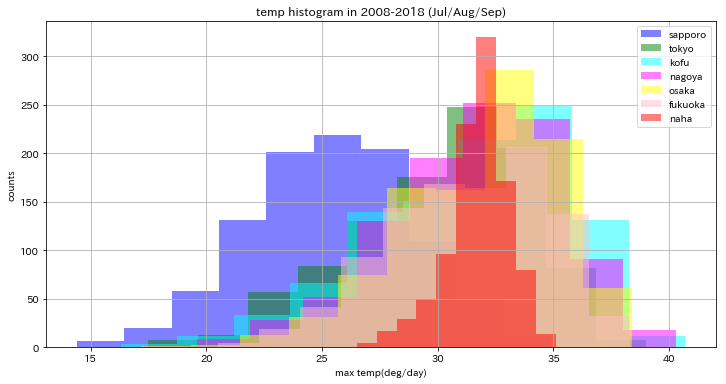

In [320]:
# temp histogram

lst_pref = ["sapporo", "tokyo", "kofu", "nagoya", "osaka", "fukuoka", "naha"]
color2 = ["blue", "green", "cyan", "magenta", "yellow", "pink", "red"]

plt.figure(figsize=(12,6))
for pref, color in zip(lst_pref, color2):
    plt.hist(
        dfw.loc[dfw.pref == pref].temp_max,
        color=color,
        label=pref,
        alpha=0.5)
plt.xlabel("max temp(deg/day)")
plt.ylabel("counts")
plt.title("temp histogram in 2008-2018 (Jul/Aug/Sep)")
plt.grid()
plt.legend()

In [321]:
# (1)時系列の推移を追加。。。
dfw.head()

,date,pref,temp_max,sr_sum,wind_speed_ave,relative_humidity_ave,total_hansou,sinseiji,nyuyouji,shonen,seijin,kourei,fumei,dead,jyusho,chusho,keisho,etc,wbgt
0,2018-07-23,tokyo,39.0,21.30,2.9,59,406,0,2,28,140,236,0,0,34,161,211,0,36.533153
1,2018-07-18,osaka,37.0,26.48,2.2,62,398,0,5,50,175,168,0,1,6,102,288,1,34.881298
2,2018-07-18,nagoya,39.2,26.35,2.7,61,367,0,9,38,162,158,0,1,13,100,253,0,36.729188
3,2018-07-19,osaka,38.0,27.86,2.4,59,353,0,3,48,126,176,0,0,3,99,251,0,35.185637
4,2018-07-18,tokyo,35.3,24.65,3.0,75,341,0,5,10,142,184,0,0,15,146,180,0,35.263768


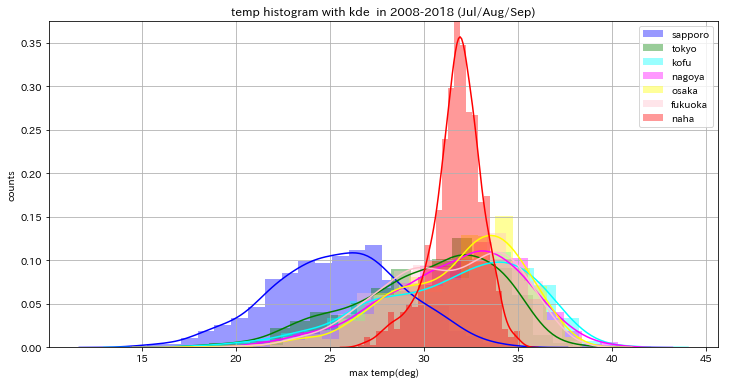

In [322]:
# temp histogram with kernel density

lst_pref = ["sapporo", "tokyo", "kofu", "nagoya", "osaka", "fukuoka", "naha"]
color2 = ["blue", "green", "cyan", "magenta", "yellow", "pink", "red"]

plt.figure(figsize=(12,6))
for pref, color in zip(lst_pref, color2):
    sns.distplot(
        dfw.loc[dfw.pref == pref].temp_max,
        color=color,
        kde = True,
        label=pref
    )
plt.xlabel("max temp(deg)")
plt.ylabel("counts")
plt.title("temp histogram with kde  in 2008-2018 (Jul/Aug/Sep)")
plt.grid()
plt.legend()

北海道と沖縄は本州＋九州とは密度分布が異なる

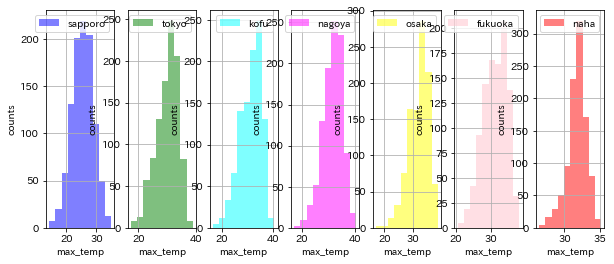

In [323]:
# temp each
fig, ax = plt.subplots(1, 7, figsize=(10, 4))
lst_pref = ["sapporo", "tokyo", "kofu", "nagoya", "osaka", "fukuoka", "naha"]
color2 = ["blue", "green", "cyan", "magenta", "yellow", "pink", "red"]

for i in range(7):
    ax[i].hist(
        dfw.loc[dfw.pref == lst_pref[i], "temp_max"],
        color=color2[i],
        label=lst_pref[i],
        alpha=0.5)
    ax[i].legend()
    ax[i].grid()
    ax[i].set_xlabel("max_temp")
    ax[i].set_ylabel("counts")

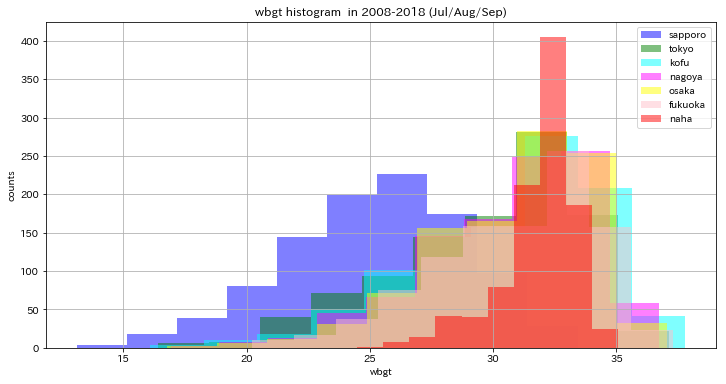

In [324]:
# wbgt histogram

lst_pref = ["sapporo", "tokyo", "kofu", "nagoya", "osaka", "fukuoka", "naha"]
color2 = ["blue", "green", "cyan", "magenta", "yellow", "pink", "red"]

plt.figure(figsize=(12,6))
for pref, color in zip(lst_pref, color2):
    plt.hist(
        dfw.loc[dfw.pref == pref].wbgt,
        color=color,
        label=pref,
        alpha=0.5)
plt.xlabel("wbgt")
plt.ylabel("counts")
plt.title("wbgt histogram  in 2008-2018 (Jul/Aug/Sep)")
plt.grid()
plt.legend()

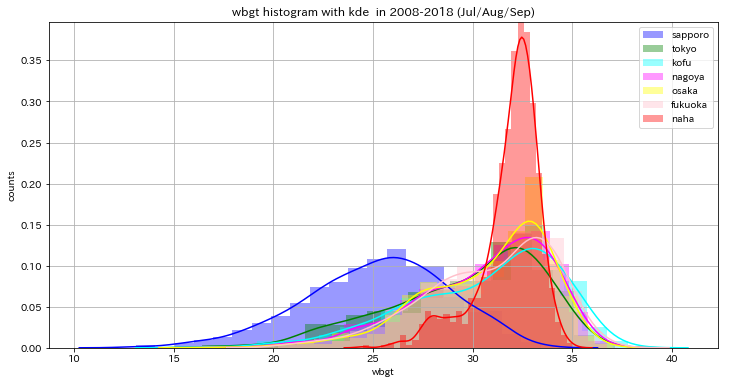

In [325]:
# wbgt histogram with kernel density

lst_pref = ["sapporo", "tokyo", "kofu", "nagoya", "osaka", "fukuoka", "naha"]
color2 = ["blue", "green", "cyan", "magenta", "yellow", "pink", "red"]

plt.figure(figsize=(12,6))
for pref, color in zip(lst_pref, color2):
    sns.distplot(
        dfw.loc[dfw.pref == pref].wbgt,
        color=color,
        kde = True,
        label=pref
    )
plt.xlabel("wbgt")
plt.ylabel("counts")
plt.title("wbgt histogram with kde  in 2008-2018 (Jul/Aug/Sep)")
plt.grid()
plt.legend()

In [326]:
# wbgt mean and sigma

lst_pref = ["sapporo", "tokyo", "kofu", "nagoya", "osaka", "fukuoka", "naha"]
muhat = []
sigmahat = []

for pref in lst_pref:
    muhat.append(dfw[dfw['pref'] == pref].wbgt.mean())
    sigmahat.append(dfw[dfw['pref'] == pref].wbgt.std(ddof=0))
print('muhat : ',muhat)
print(sigmahat)

muhat :  [25.210431039920913, 29.723631241129343, 30.61928695042152, 30.607135147970723, 30.747826489889555, 30.839313316061418, 31.851714756992152]
[3.5848103354107836, 3.7623609109799636, 3.7960246332130656, 3.3221014848649237, 3.160059315983889, 3.2286033774767446, 1.5570049262799288]


Text(0,0.5,'wbgt mean and 1sigma')

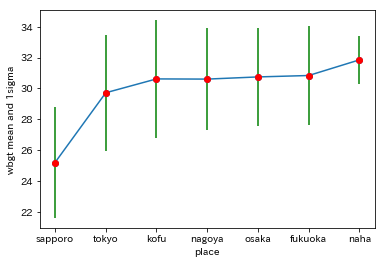

In [327]:
# plot
plt.plot(lst_pref,muhat,marker='o')
plt.errorbar(lst_pref,muhat,yerr=sigmahat,fmt='ro',ecolor='g')
plt.xlabel('place')
plt.ylabel('wbgt mean and 1sigma')

WBGTのヒストグラム／密度分布では北海道のみが分布／傾向が異なる

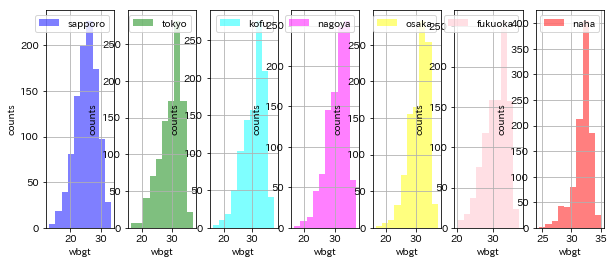

In [328]:
# wbgt each
fig, ax = plt.subplots(1, 7, figsize=(10, 4))
lst_pref = ["sapporo", "tokyo", "kofu", "nagoya", "osaka", "fukuoka", "naha"]
color2 = ["blue", "green", "cyan", "magenta", "yellow", "pink", "red"]

for i in range(7):
    ax[i].hist(
        dfw.loc[dfw.pref == lst_pref[i], "wbgt"],
        color=color2[i],
        label=lst_pref[i],
        alpha=0.5)
    ax[i].legend()
    ax[i].grid()
    ax[i].set_xlabel("wbgt")
    ax[i].set_ylabel("counts")

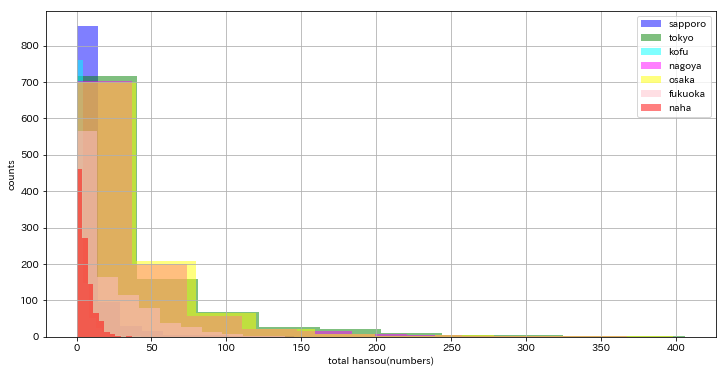

In [329]:
# hansou each
lst_pref = ["sapporo", "tokyo", "kofu", "nagoya", "osaka", "fukuoka", "naha"]
color2 = ["blue", "green", "cyan", "magenta", "yellow", "pink", "red"]

plt.figure(figsize=(12,6))
for pref, color in zip(lst_pref, color2):
    plt.hist(
        dfw.loc[dfw.pref == pref].total_hansou,
        color=color,
        label=pref,
        alpha=0.5)
plt.xlabel("total hansou(numbers)")
plt.ylabel("counts")
plt.grid()
plt.legend()

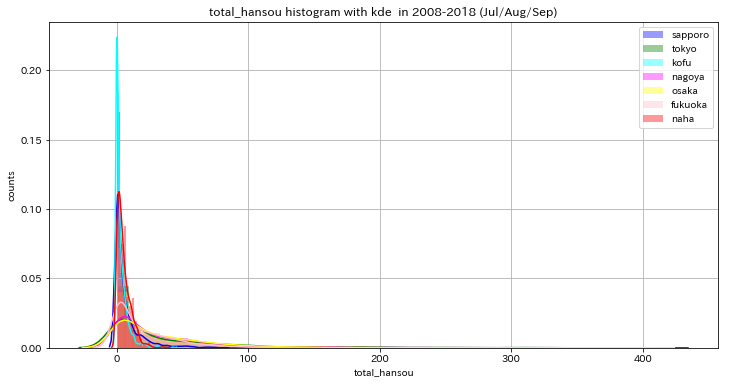

In [330]:
# hansou histogram with kernel density
lst_pref = ["sapporo", "tokyo", "kofu", "nagoya", "osaka", "fukuoka", "naha"]
color2 = ["blue", "green", "cyan", "magenta", "yellow", "pink", "red"]

plt.figure(figsize=(12,6))
for pref, color in zip(lst_pref, color2):
    sns.distplot(
        dfw.loc[dfw.pref == pref].total_hansou,
        color=color,
        kde = True,
        label=pref
    )
plt.xlabel("total_hansou")
plt.ylabel("counts")
plt.title("total_hansou histogram with kde  in 2008-2018 (Jul/Aug/Sep)")
plt.grid()
plt.legend()

### WBGTで判断する場合

'mu:'

31.851714756992152

'sigma:'

1.5570049262799288

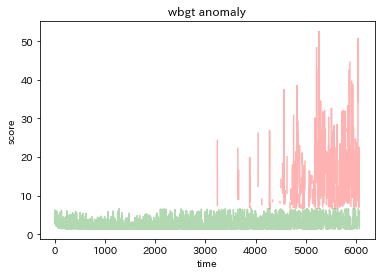

In [331]:
# 情報量を異常度に用いる場合 + 前提条件 １次元データ：x〜N（μ、σ２）、N>>1

# xi square distribution
a_th = stats.chi2.ppf(0.99, df=1)
a_th

# 札幌を除いた分布
# change to gauss distribution (delete sapporo)
muhat_all = dfw.wbgt.mean()
muhat_all
sigmahat_all=dfw.wbgt.std(ddof=0)
sigmahat_all
lst_pref = ["tokyo", "kofu", "nagoya", "osaka", "fukuoka", "naha"]
muhat_1 = []
sigmahat_1 = []
dfw1=dfw[dfw.pref!='sapporo']
x=np.arange(len(dfw1))

for pref in lst_pref:
    muhat_1=dfw[dfw['pref'] == pref].wbgt.mean()
    sigmahat_1=dfw[dfw['pref'] == pref].wbgt.std(ddof=0)
    
display('mu:',muhat_1)
display('sigma:',sigmahat_1)   

score_1 = stats.norm.pdf(
    dfw1.wbgt,
    loc=muhat_1,
    scale=sigmahat_1)
ascore_1 = -np.log(score_1)

supper_1 = np.ma.masked_where(ascore_1 < a_th, ascore_1)
slower_1 = np.ma.masked_where(ascore_1 >= a_th, ascore_1)
plt.plot(x,supper_1,c='r',alpha=0.3)
plt.plot(x,slower_1,c='g',alpha=0.3)

plt.title("wbgt anomaly")
plt.xlabel("time")
plt.ylabel("score")
plt.show()

In [332]:
print(ascore_1.max())
print(ascore_1.min())

52.59668607606263
1.3617030605481635


In [333]:
dfw1.iloc[np.argsort(ascore_1)].head(5)

,date,pref,temp_max,sr_sum,wind_speed_ave,relative_humidity_ave,total_hansou,sinseiji,nyuyouji,shonen,seijin,kourei,fumei,dead,jyusho,chusho,keisho,etc,wbgt
774,2018-07-12,nagoya,34.0,18.63,3.0,58,53,0,0,1,23,29,0,0,1,17,35,0,31.850204
1272,2009-08-18,osaka,34.3,24.82,2.5,57,35,0,0,0,26,9,0,0,0,7,28,0,31.849793
2887,2013-07-29,fukuoka,34.2,8.92,3.6,64,10,0,0,2,2,6,0,0,0,7,3,0,31.854218
388,2015-07-12,tokyo,32.0,26.35,2.7,74,78,0,0,13,33,32,0,0,1,25,52,0,31.855644
1706,2010-07-04,nagoya,31.7,19.64,3.3,74,24,0,0,10,7,7,0,0,0,7,17,0,31.847274


### 性能評価　
+ 予測(predict)：wbgt  
+ 評価(test)：total_hansou 搬送者の上位を異常ラベルに割り振り  

In [334]:
# anomaly ratio
ratio=0.01 
N=len(dfw)
M=int(N*ratio)

# label
label = dfw['total_hansou'].sort_values(ascending=False)[:M]
label.index.values

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 26, 25, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69])

In [335]:
display(N)
display(M)

7084

70

In [336]:
predict = dfw['wbgt'].sort_values(ascending=False)[:M]
predict.index.sort_values(ascending=True)

Int64Index([   0,    2,   10,   12,   14,   33,   41,   74,   87,   92,  121,
             126,  128,  176,  238,  279,  302,  306,  328,  349,  361,  368,
             408,  418,  440,  514,  519,  548,  570,  621,  625,  628,  942,
            1021, 1096, 1200, 1299, 1327, 1387, 1541, 1550, 1590, 1618, 1860,
            1879, 1943, 1962, 2043, 2163, 2323, 2427, 2460, 2491, 2615, 2835,
            2974, 3017, 3146, 3153, 3323, 3384, 3434, 3449, 3499, 3736, 3823,
            3837, 3883, 4773, 5427],
           dtype='int64')

In [337]:
a = set(predict.index.values)
b = set(label.index.values)
c = len(a & b) # True Positive
d = len(b) - c # False Negative
e = N- len(a) - c # False Positive
acc = (c+e)/N
pre = c/len(a)
rec = c/(c+d)

In [338]:
print('accuracy = {0:1.3f}'.format(acc))
print('precision = {0:1.3f}'.format(pre))
print('recall = {0:1.3f}'.format(rec))
print('F value = {0:1.3f}'.format(2*acc*pre/(acc+pre)))

accuracy = 0.990
precision = 0.100
recall = 0.100
F value = 0.182


In [339]:
ascore = ascore_1[:M]
nscore = ascore_1[M:]

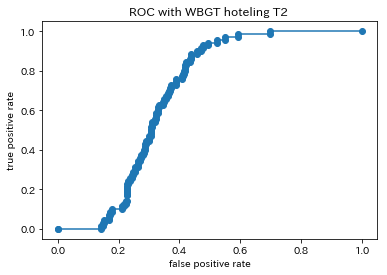

In [340]:
# ROC sklearn  WBGT normal distribution & hoteling T2

df_normal = pd.DataFrame(nscore, columns=["anomaly score"])
df_normal["label"] = 0
df_abnormal = pd.DataFrame(ascore, columns=["anomaly score"])
df_abnormal["label"] = 1
df_score = pd.concat([df_normal, df_abnormal])

roc_auc_score(df_score["label"], df_score["anomaly score"])
fpr, tpr, thresholds = roc_curve(df_score["label"], df_score["anomaly score"])
plt.plot(fpr, tpr, marker="o")
plt.title("ROC with WBGT hoteling T2 ")
plt.xlabel("false positive rate")
plt.ylabel("true positive rate")
plt.show()

In [341]:
roc_auc_score(df_score["label"], df_score["anomaly score"])

0.6773718284381397

WBGTを正規分布の入力とし、搬送者数を出力とすると性能は良くない結果となった  
→ 最高気温のみの場合と確認してみる

### 最高気温で判断する場合

mu temp  all : 30.46  (deg)
mu temp  sapporo cut : 31.71  (deg)

sigma temp  all : 3.849  (deg)
sigma temp  sapporo cut : 1.36  (deg)


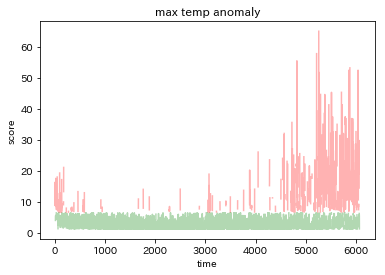

In [342]:
# 最高気温で異常度を確認、札幌は同様に除外しておく

muhat_all2 = dfw.temp_max.mean()
sigmahat_all2=dfw.wbgt.std(ddof=0)
lst_pref = ["tokyo", "kofu", "nagoya", "osaka", "fukuoka", "naha"]
muhat_2 = []
sigmahat_2 = []
dfw1=dfw[dfw.pref!='sapporo']
x=np.arange(len(dfw1))

for pref in lst_pref:
    muhat_2=dfw[dfw['pref'] == pref].temp_max.mean()
    sigmahat_2=dfw[dfw['pref'] == pref].temp_max.std(ddof=0)
    
print('mu temp  all : {0:2.2f}  (deg)'.format(muhat_all2))
print('mu temp  sapporo cut : {0:2.2f}  (deg)'.format(muhat_2))
print()
print('sigma temp  all : {0:1.3f}  (deg)'.format(sigmahat_all2))
print('sigma temp  sapporo cut : {0:1.2f}  (deg)'.format(sigmahat_2))  

score_2 = stats.norm.pdf(
    dfw1.temp_max,
    loc=muhat_2,
    scale=sigmahat_2)
ascore_2 = -np.log(score_2)

supper_2 = np.ma.masked_where(ascore_2 < a_th, ascore_2)
slower_2 = np.ma.masked_where(ascore_2 >= a_th, ascore_2)
plt.plot(x,supper_2,c='r',alpha=0.3)
plt.plot(x,slower_2,c='g',alpha=0.3)

plt.title("max temp anomaly")
plt.xlabel("time")
plt.ylabel("score")
plt.show()

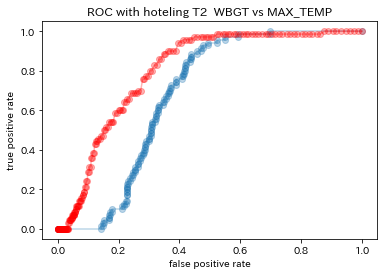

AUC score

wbgt         :  0.677
max temp :  0.803


In [343]:
# ROC sklearn  MAX TEMP normal distribution & hoteling T2

ascore2 = ascore_2[:M]
nscore2 = ascore_2[M:]

df_normal2 = pd.DataFrame(nscore2, columns=["anomaly score"])
df_normal2["label"] = 0
df_abnormal2 = pd.DataFrame(ascore2, columns=["anomaly score"])
df_abnormal2["label"] = 1
df_score2 = pd.concat([df_normal2, df_abnormal2])

fpr, tpr, thresholds = roc_curve(df_score["label"], df_score["anomaly score"])
plt.plot(fpr, tpr, marker="o",label='wbgt',alpha=0.3)

fpr2, tpr2, thresholds2 = roc_curve(df_score2["label"], df_score2["anomaly score"])
plt.plot(fpr2, tpr2, marker="o",c="r",label='max temp',alpha=0.3)

plt.title("ROC with hoteling T2  WBGT vs MAX_TEMP")
plt.xlabel("false positive rate")
plt.ylabel("true positive rate")
plt.show()

print('AUC score')
print()
print('wbgt         :  {0:1.3f}'.format(roc_auc_score(df_score["label"], df_score["anomaly score"])))
print('max temp :  {0:1.3f}'.format(roc_auc_score(df_score2["label"], df_score2["anomaly score"])))



→　WBGTの方が最高気温のみの場合と比較して指標が劣っており、  
   　　敢えてWBGTを使わなくても良いという結果  

→　要因としては以下を想定  
+ ７地点＋１１年間のデータのみ＜データ量が少ない＞、  
+ 搬送者１％（≠人口比）＜異常基準の妥当性＞、  
+ その他、高齢化や環境変化などの要素＜実情との不一致：何かしらの異常の発生＞  


## 二次元正規分布

Text(0,0.5,'temperature')

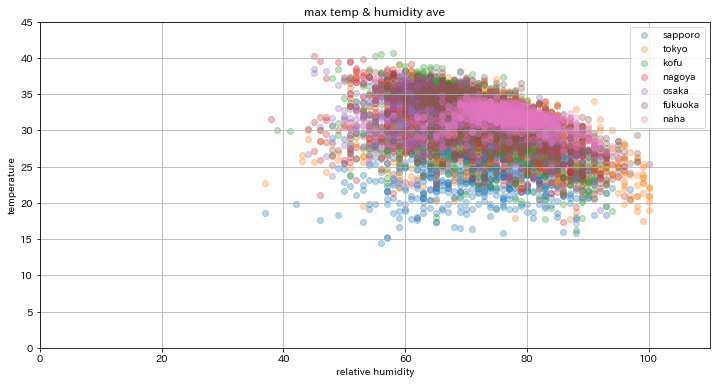

In [344]:
# plot temp and humidity
lst_pref = ["sapporo", "tokyo", "kofu", "nagoya", "osaka", "fukuoka", "naha"]
color2 = ["blue", "green", "cyan", "magenta", "yellow", "pink", "red"]

plt.figure(figsize=(12, 6))
for pref, color in zip(lst_pref, color2):
    plt.scatter(
        dfw.loc[dfw.pref == pref].relative_humidity_ave,
        dfw.loc[dfw.pref == pref].temp_max,
        label=pref,
        alpha=0.3)

plt.title("max temp & humidity ave")

plt.grid()
plt.xlim([0, 110])
plt.ylim([0, 45])
plt.legend()
plt.xlabel("relative humidity")
plt.ylabel("temperature")

In [346]:
dfw.describe()

,temp_max,sr_sum,wind_speed_ave,relative_humidity_ave,total_hansou,sinseiji,nyuyouji,shonen,seijin,kourei,fumei,dead,jyusho,chusho,keisho,etc,wbgt
count,7084.000000,7084.00000,7084.000000,7084.000000,7084.000000,7084.000000,7084.000000,7084.000000,7084.000000,7084.000000,7084.0,7084.000000,7084.000000,7084.000000,7084.000000,7084.000000,7084.000000
mean,30.464272,17.01879,3.087818,72.003388,19.819029,0.002823,0.173207,2.430830,8.252117,8.960051,0.0,0.020751,0.420384,6.373518,12.846273,0.158103,29.942763
std,4.039381,6.88765,1.590395,9.609339,35.330924,0.058141,0.538832,4.781475,15.334437,16.609328,0.0,0.160275,1.428917,11.979768,23.389240,0.652640,3.849661
min,14.400000,0.99000,0.800000,37.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,13.098951
25%,27.900000,12.06500,2.200000,65.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,27.580019
50%,31.200000,18.30000,2.600000,72.000000,6.000000,0.000000,0.000000,1.000000,2.000000,2.000000,0.0,0.000000,0.000000,2.000000,4.000000,0.000000,30.957520
75%,33.400000,22.50000,3.500000,78.000000,22.000000,0.000000,0.000000,3.000000,9.000000,10.000000,0.0,0.000000,0.000000,7.000000,14.000000,0.000000,32.847828
max,40.700000,30.20000,22.700000,100.000000,406.000000,2.000000,9.000000,62.000000,180.000000,236.000000,0.0,3.000000,34.000000,161.000000,288.000000,16.000000,37.797643


In [347]:
dfw.head()

,date,pref,temp_max,sr_sum,wind_speed_ave,relative_humidity_ave,total_hansou,sinseiji,nyuyouji,shonen,seijin,kourei,fumei,dead,jyusho,chusho,keisho,etc,wbgt
0,2018-07-23,tokyo,39.0,21.30,2.9,59,406,0,2,28,140,236,0,0,34,161,211,0,36.533153
1,2018-07-18,osaka,37.0,26.48,2.2,62,398,0,5,50,175,168,0,1,6,102,288,1,34.881298
2,2018-07-18,nagoya,39.2,26.35,2.7,61,367,0,9,38,162,158,0,1,13,100,253,0,36.729188
3,2018-07-19,osaka,38.0,27.86,2.4,59,353,0,3,48,126,176,0,0,3,99,251,0,35.185637
4,2018-07-18,tokyo,35.3,24.65,3.0,75,341,0,5,10,142,184,0,0,15,146,180,0,35.263768


In [348]:
dfw_ = dfw.drop(columns=['fumei','etc','sinseiji','shonen','nyuyouji','seijin','fumei','dead','jyusho','chusho','keisho'])

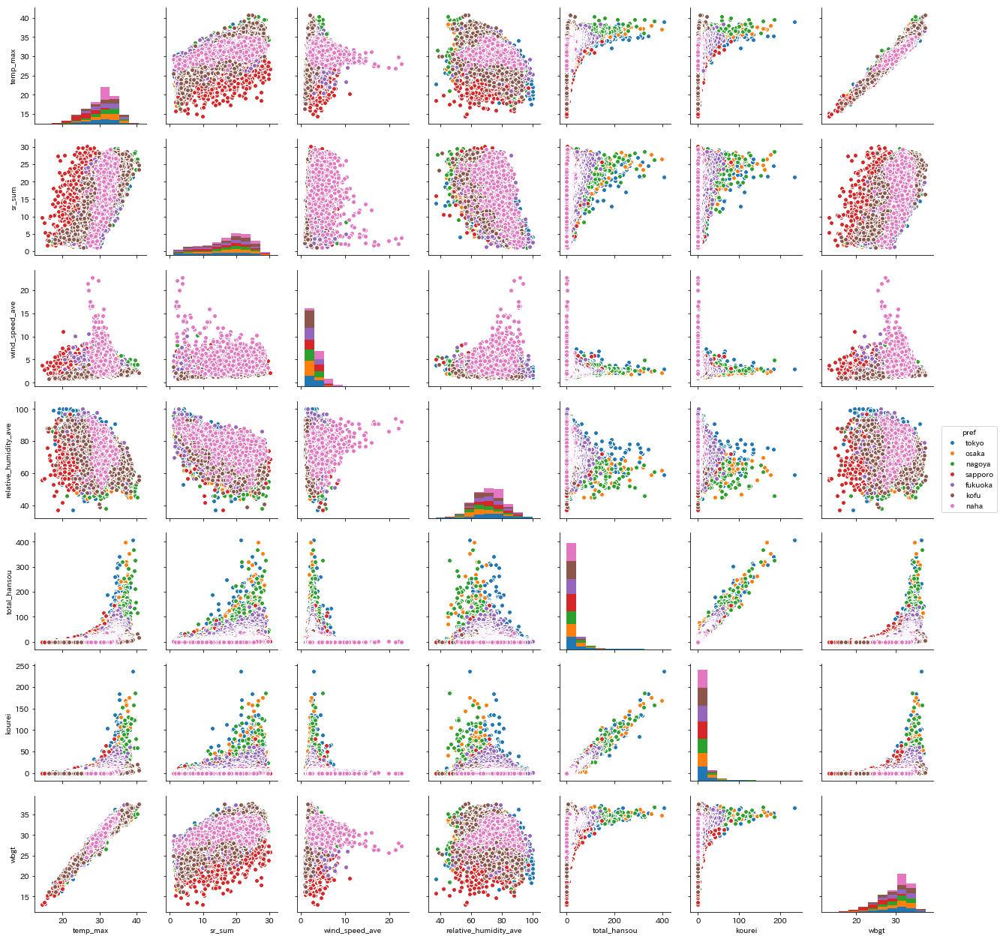

In [349]:
sns.pairplot(dfw_,hue='pref')

In [350]:
muhat = dfw[["relative_humidity_ave", "temp_max"]].mean().values
X = dfw[["relative_humidity_ave", "temp_max"]].values

li = 0
for i in range(len(dfw)):
    li += np.dot((X[i, :] - muhat).reshape(2, 1), (X[i, :] - muhat).reshape(
        1, 2))
sigmahat = li / len(dfw)

print(muhat)
print()
print(sigmahat)

[72.   30.46]

[[ 92.33 -14.35]
 [-14.35  16.31]]


In [355]:
# anomaly ratio
ratio=0.01  # 1%
N=len(dfw)
M=int(N*ratio)

# label
label = dfw['total_hansou'].sort_values(ascending=False)[:M]
label.index.values

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 26, 25, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69])

In [356]:
label.head(5)

0    406
1    398
2    367
3    353
4    341
Name: total_hansou, dtype: int64

## contour plot

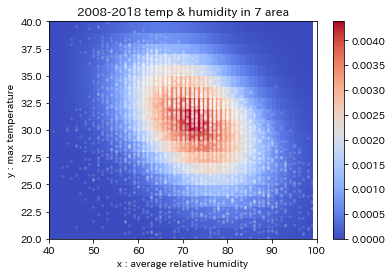

In [385]:
# contour plot 7 area

def f(x, y):
    det = np.linalg.det(sigma)
    if det < 0:
        sys.exit()
    inv_sigma = np.linalg.inv(sigma)
    x_c = np.array([x, y]) - mu

    return 1 / (2 * np.pi * np.sqrt(det)) * np.exp(
        -x_c.dot(inv_sigma).dot(x_c.T) / 2.0)

x = y = np.arange(0, 100, 1)
X, Y = np.meshgrid(x, y)

mu = muhat
sigma = sigmahat
Z = np.vectorize(f)(X, Y)

#目的関数
plt.pcolor(X, Y, Z, cmap=cm.coolwarm)
plt.colorbar()

#表示範囲
plt.xlim([40, 100])
plt.ylim([20, 40])

plt.xlabel("x : average relative humidity")
plt.ylabel("y : max temperature")

plt.plot(
    dfw["relative_humidity_ave"],
    dfw["temp_max"],
    ls="",
    marker="o",
    color="white",
    alpha=0.1,
    markersize=2)
plt.title("2008-2018 temp & humidity in 7 area")


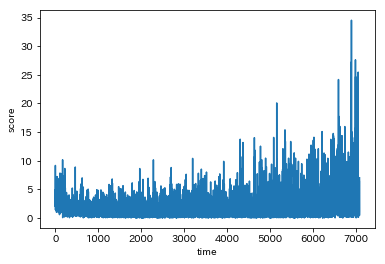

In [358]:
# hotelling T2
def calc_score(df, mu, sigma):
    inv_sigma = np.linalg.inv(sigma)
    li = []
    for ind, rows in df.iterrows():
        X = rows[[0, 1]].values
        score = (X - muhat).reshape(1, 2).dot(inv_sigma).dot(
            (X - muhat).reshape(2, 1))
        li.append(score[0])
    return li

ascore = calc_score(dfw[["relative_humidity_ave", "temp_max"]], muhat, sigmahat)
plt.plot(ascore)
plt.xlabel("time")
plt.ylabel("score")
plt.show()

### 性能評価

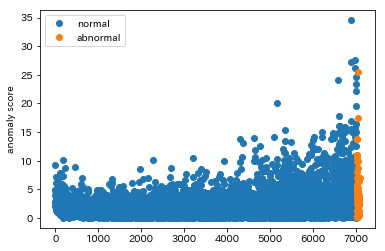

In [359]:
# anomaly
ascore_normal = ascore[0:N - M]
ascore_abnormal = ascore[N - M:N]

df_normal = pd.DataFrame(ascore_normal, columns=["anomaly score"])
df_normal["label"] = 0
df_abnormal = pd.DataFrame(ascore_abnormal, columns=["anomaly score"])
df_abnormal["label"] = 1
df_score3 = pd.concat([df_normal, df_abnormal])

x0 = range(0, N - M)
x1 = range(N - M, N)

#ascore.sort(reverse=True)
plt.plot(x0, ascore_normal, marker="o", ls="")
plt.plot(x1, ascore_abnormal, marker="o", ls="")
plt.legend(["normal", "abnormal"])
plt.ylabel("anomaly score")
plt.show()

In [360]:
# 閾値
a_th = ascore[M][0]# 上位1%
df_score3["label_pred"] = 0
df_score3.loc[df_score3["anomaly score"] > a_th, "label_pred"] = 1

# Accuracy/Recall/Precision/F1-score
print("accuracy=", accuracy_score(df_score3["label"], df_score3["label_pred"]))
print("recall=", recall_score(df_score3["label"], df_score3["label_pred"]))
print("precision=",precision_score(df_score3["label"], df_score3["label_pred"]))
print("f1=", f1_score(df_score3["label"], df_score3["label_pred"]))

accuracy= 0.8129587803500847
recall= 0.5571428571428572
precision= 0.029257314328582147
f1= 0.055595153243050616


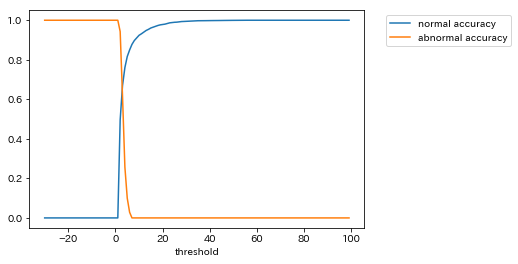

In [361]:
# accuracy
li_ath = []
li_abnormal_accuracy = []
li_normal_accuracy = []
for a_th in range(-30, 100):
    df_score["label_pred"] = 0
    df_score.loc[df_score["anomaly score"]>a_th, "label_pred"] = 1
    abnormal_accuracy = recall_score(df_score["label"], df_score["label_pred"], pos_label=1)# 異常標本精度
    normal_accuracy = recall_score(df_score["label"], df_score["label_pred"], pos_label=0)# 正常標本精度
    li_ath.append(a_th)
    li_abnormal_accuracy.append(abnormal_accuracy)
    li_normal_accuracy.append(normal_accuracy)    
    
    
# グラフを描画
plt.plot(li_ath, li_normal_accuracy)
plt.plot(li_ath, li_abnormal_accuracy)
plt.xlabel("threshold")
plt.legend(["normal accuracy", "abnormal accuracy"],bbox_to_anchor=(1.05,1))
plt.show()

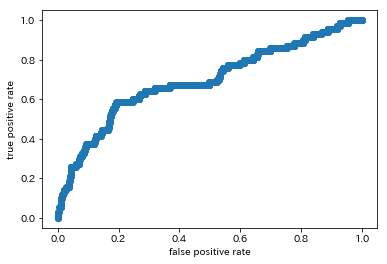

In [362]:
# roc
roc_auc_score(df_score3["label"], df_score3["anomaly score"])
fpr, tpr, thresholds = roc_curve(df_score3["label"], df_score3["anomaly score"])
plt.plot(fpr, tpr, marker="o")
plt.xlabel("false positive rate")
plt.ylabel("true positive rate")
plt.show()

In [363]:
roc_auc_score(df_score3["label"], df_score3["anomaly score"])

0.6950670088394639

主成分分析（後述）によると、WBGTへの影響は「気温」が「湿度」より大きい結果  
気温と湿度の二次元正規分布のホテリングT2（ROC＝0.695)では、湿度と気温の異常度を同様に評価したため、  
気温のみの場合（ROC=0.803）と比較して性能が低下（ROC=0.803→0.695）したと推定

AUC score

wbgt  :  0.677  
max temp  :  0.803  
max temp & humidity : 0.695  

# 混合正規分布

* 確率密度関数  
$\displaystyle f({\boldsymbol \mu},{\Sigma}  )=\frac{1}{(\sqrt{2 \pi })^p \sqrt{\left| \Sigma \right| }}exp\left(-\frac{1}{2}\left({\boldsymbol x}  -{\boldsymbol \mu} \right)^T\Sigma^{-1}\left({\boldsymbol x} - {\boldsymbol \mu} \right) \right)$  
$\Sigma$:共分散行列  
$\left| \Sigma \right| $:共分散行列の行列式  
$p$:次元数
  
  
* 多変量正規分布のパラメータ${\boldsymbol \mu}, \Sigma$を最尤推定によって求める方法  
$\displaystyle \hat{\boldsymbol  \mu}=\frac{1}{N}\sum_{n=1}^{N} x^{(n)}$  
$\displaystyle \hat{\Sigma}=\frac{1}{N}\sum_{n=1}^{N} ({\boldsymbol x}^{(n)}-\hat{\boldsymbol \mu})({\boldsymbol x}^{(n)}-\hat{\boldsymbol  \mu})^T$  
$\hat {\boldsymbol \mu}$ : 平均の最尤解  
$\hat \Sigma$ : 標準偏差の最尤解   

## EM method

In [368]:
# EM法（Expectation Maximization)

#平均m, 分散vのガウス分布
def gaussian(x, m, v):
    p = math.exp(-pow(x - m, 2) / (2 * v)) / math.sqrt(2 * math.pi * v)
    return p

#Eステップ
def e_step(xs, ms, vs, p):
    burden_rates = []
    for x in xs:
        d = (1 - p) * gaussian(x, ms[0], vs[0]) + p * gaussian(x, ms[1], vs[1])
        n = p * gaussian(x, ms[1], vs[1])
        burden_rate = n / d
        burden_rates.append(burden_rate)
    return burden_rates

#Mステップ
def m_step(xs, burden_rates):
    d = sum([1 - r for r in burden_rates])
    n = sum([(1 - r) * x for x, r in zip(xs, burden_rates)])
    mu1 = n / d

    n = sum([(1 - r) * pow(x - mu1, 2) for x, r in zip(xs, burden_rates)])
    var1 = n / d

    d = sum(burden_rates)
    n = sum([r * x for x, r in zip(xs, burden_rates)])
    mu2 = n / d

    n = sum(r * pow(x - mu2, 2) for x, r in zip(xs, burden_rates))
    var2 = n / d

    N = len(xs)
    p = sum(burden_rates) / N

    return [mu1, mu2], [var1, var2], p


#対数尤度関数
def calc_log_likelihood(xs, ms, vs, p):
    s = 0
    for x in xs:
        g1 = gaussian(x, ms[0], vs[0])
        g2 = gaussian(x, ms[1], vs[1])
        s += math.log((1 - p) * g1 + p * g2)
    return s

## plot all wbgt

In [369]:
wbgt=dfw.wbgt.values
wbgt

array([36.53, 34.88, 36.73, ..., 27.04, 32.59, 21.1 ])

mu1 :  32.70747133422935
v1 :  27.719046649943074
v2 :  1.9522472159479236
p :  14.07300516362157


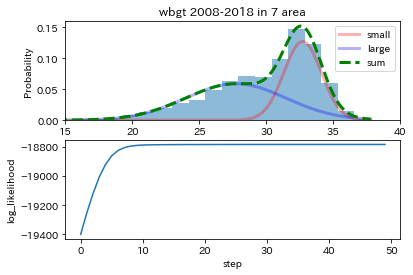

In [370]:
# 7 pref wbgt plot
# mu, vs, pの初期値を設定する
p = 0.5
ms = [random.choice(wbgt), random.choice(wbgt)]
vs = [np.var(wbgt), np.var(wbgt)]
T = 50  #反復回数
ls = []  #対数尤度関数の計算結果を保存

#EMアルゴリズム
for t in range(T):
    burden_rates = e_step(wbgt, ms, vs, p)
    ms, vs, p = m_step(wbgt, burden_rates)
    ls.append(calc_log_likelihood(wbgt, ms, vs, p))

print("mu1 : ", ms[0])
print("v1 : ", ms[1])
print("v2 : ", vs[0])
print("p : ", vs[1])

plt.subplot(211)
plt.title("wbgt 2008-2018 in 7 area")
xs = np.linspace(min(wbgt), max(wbgt), 200)
norm1 = scipy.stats.norm.pdf(xs, ms[0], math.sqrt(vs[0]))
norm2 = scipy.stats.norm.pdf(xs, ms[1], math.sqrt(vs[1]))
plt.hist(wbgt, bins=20, density=True, alpha=0.5) # density or normed

plt.plot(xs, (1 - p) * norm1, color="red", lw=3, alpha=0.3)
plt.plot(xs, p * norm2, color="blue", lw=3, alpha=0.3)
plt.plot(
    xs, (1 - p) * norm1 + p * norm2, color="green", lw=3, linestyle='dashed')

plt.xlim(15, 40)
plt.xlabel("x")
plt.ylabel("Probability")
plt.legend(["small", "large", "sum"])

plt.subplot(212)
plt.plot(np.arange(len(ls)), ls)
plt.xlabel("step")
plt.ylabel("log_likelihood")

plt.show()

北海道（札幌）が他と異なる気温分布を示していることから、札幌のデータを分離

## plot wbgt without sapporo

mu1 :  28.607079937891683
v1 :  32.77489237306995
v2 :  11.192850196391113
p :  1.8880189811251993


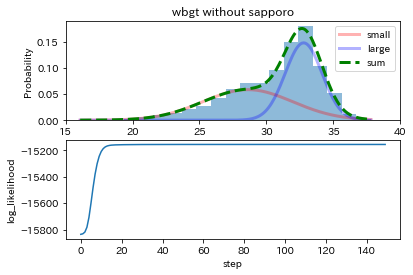

In [371]:
# 6 pref wbgt(without sapporo)
wbgt_ = dfw[dfw['pref'] != 'sapporo'].wbgt.values

p = 0.5
ms = [random.choice(wbgt_), random.choice(wbgt_)]
vs = [np.var(wbgt_), np.var(wbgt_)]
T = 150  #反復回数
ls = []  #対数尤度関数の計算結果を保存

#EMアルゴリズム
for t in range(T):
    burden_rates = e_step(wbgt_, ms, vs, p)
    ms, vs, p = m_step(wbgt_, burden_rates)
    ls.append(calc_log_likelihood(wbgt_, ms, vs, p))

print("mu1 : ", ms[0])
print("v1 : ", ms[1])
print("v2 : ", vs[0])
print("p : ", vs[1])

plt.subplot(211)
plt.title("wbgt without sapporo")
xs = np.linspace(min(wbgt_), max(wbgt_), 200)
norm1 = scipy.stats.norm.pdf(xs, ms[0], math.sqrt(vs[0]))
norm2 = scipy.stats.norm.pdf(xs, ms[1], math.sqrt(vs[1]))
plt.hist(wbgt_, bins=20, density=True, alpha=0.5)  # density or normed

plt.plot(xs, (1 - p) * norm1, color="red", lw=3, alpha=0.3)
plt.plot(xs, p * norm2, color="blue", lw=3, alpha=0.3)
plt.plot(
    xs, (1 - p) * norm1 + p * norm2, color="green", lw=3, linestyle='dashed')

plt.xlim(15, 40)
plt.xlabel("x")
plt.ylabel("Probability")
plt.legend(["small", "large", "sum"])

plt.subplot(212)
plt.plot(np.arange(len(ls)), ls)
plt.xlabel("step")
plt.ylabel("log_likelihood")

plt.show()

large,smallが入れ替わったが、裾野の低いピークの分離が十分でないといえる。   


## separate small and large

In [372]:
# large = normal 
# wbgt30以下をカット

dfw_cut = dfw[dfw.wbgt > 30] 
N_cut = len(dfw_cut) 

## plot normal data (relative_humidity & temp)

WBGT３０以下は分布の上から異常（ノイズ）と考え、WBGT３０以上を正常値とし２次元（気温、湿度）でプロット

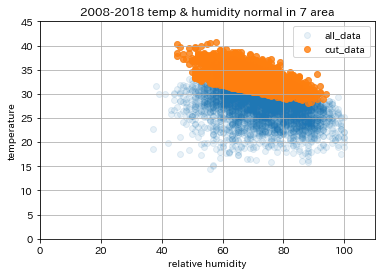

In [374]:
# normal label
y = np.array([0] * N_cut)

# cut data = normal data
plt.scatter(
    dfw["relative_humidity_ave"], 
    dfw["temp_max"], alpha=0.1)  # all

plt.scatter(
    dfw_cut["relative_humidity_ave"], 
    dfw_cut["temp_max"], alpha=0.8)  # normal

plt.title("2008-2018 temp & humidity normal in 7 area")
plt.grid()
plt.xlim([0, 110])
plt.ylim([0, 45])
plt.legend(['all_data', 'cut_data'])
plt.xlabel("relative humidity")
plt.ylabel("temperature")

plt.show()

## plot contour

Text(0.5,1,'temp & humidity separated')

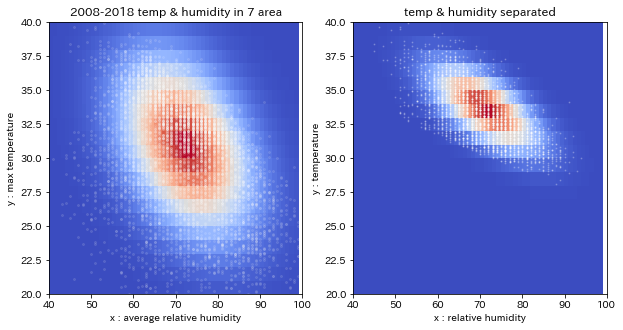

In [401]:
# contour plot 7 area

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

def f(x, y):
    det = np.linalg.det(sigma)
    if det < 0:
        sys.exit()
    inv_sigma = np.linalg.inv(sigma)
    x_c = np.array([x, y]) - mu

    return 1 / (2 * np.pi * np.sqrt(det)) * np.exp(
        -x_c.dot(inv_sigma).dot(x_c.T) / 2.0)

x = y = np.arange(0, 100, 1)
X, Y = np.meshgrid(x, y)

mu = muhat
sigma = sigmahat
Z = np.vectorize(f)(X, Y)

ax[0].pcolor(X, Y, Z, cmap=cm.coolwarm)

ax[0].set_xlim([40, 100])
ax[0].set_ylim([20, 40])

ax[0].set_xlabel("x : average relative humidity")
ax[0].set_ylabel("y : max temperature")

ax[0].plot(
    dfw["relative_humidity_ave"],
    dfw["temp_max"],
    ls="",
    marker="o",
    color="white",
    alpha=0.1,
    markersize=2)
ax[0].set_title("2008-2018 temp & humidity in 7 area")


# contour  6 area

muhat_ = dfw_cut[["relative_humidity_ave", "temp_max"]].mean().values
X_= dfw_cut[["relative_humidity_ave", "temp_max"]].values

x = y = np.arange(0, 100, 1)
X, Y = np.meshgrid(x, y)

mu = muhat_
sigma = sigmahat_
Z = np.vectorize(f)(X, Y)

ax[1].pcolor(X, Y, Z, cmap=cm.coolwarm)
ax[1].set_xlim([40, 100])
ax[1].set_ylim([20, 40])
ax[1].set_xlabel("x : relative humidity")
ax[1].set_ylabel("y : temperature")
plt.plot(
    dfw_cut["relative_humidity_ave"],
    dfw_cut["temp_max"],
    ls="",
    marker="o",
    color="white",
    alpha=0.2,
    markersize=1)
ax[1].set_title("temp & humidity separated")

# 近傍法

## k基準

* 𝑘基準
    * なんらかの方法で適切な$𝜀$を決める
    * 近傍数の閾値$𝑘_{𝑡ℎ}$を決める
    * 新たな観測値$𝑥′$に対して、半径𝜀の範囲に入る標本を$𝐷$から選ぶ
    * その標本の数𝑘が閾値$𝑘_{𝑡ℎ}$を下回ったら$𝑥′$は異常であると判定する

In [402]:
dfw_cut.index = pd.to_datetime(dfw_cut['date'])

In [403]:
dfw_cut.index

DatetimeIndex(['2018-07-23', '2018-07-18', '2018-07-18', '2018-07-19',
               '2018-07-18', '2018-07-23', '2018-07-19', '2018-07-23',
               '2018-07-21', '2018-07-22',
               ...
               '2011-07-31', '2011-08-05', '2014-07-02', '2008-09-12',
               '2014-08-25', '2013-07-17', '2012-09-20', '2013-07-27',
               '2013-09-06', '2013-09-05'],
              dtype='datetime64[ns]', name='date', length=4108, freq=None)

In [409]:
# normal 2008 to 2017  for learning
X= dfw_cut['2008':'2017'][["relative_humidity_ave","temp_max"]].values
y=[0]*len(X)
print("2008-2017 : ",X.shape)

# 2018 for test
X_new=dfw_cut['2018'][["relative_humidity_ave","temp_max"]].values
print("2018 : ",X_new.shape)

2008-2017 :  (3714, 2)
2018 :  (394, 2)


## 近傍数 kth=3

In [429]:
from sklearn.neighbors import RadiusNeighborsClassifier

epsilon = 2 #　半径
k_th = 3  # 閾値(近傍点の個数)

rneigh = RadiusNeighborsClassifier(radius=epsilon)
rneigh.fit(X , y)

RadiusNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
             metric_params=None, outlier_label=None, p=2, radius=2,
             weights='uniform')

In [430]:
#判定
j = 0
anomaly_idx_k1 = []
dist, ind = rneigh.radius_neighbors(X_new, radius=epsilon)
np.set_printoptions(precision=2)

for d in dist:
    j = j + 1
    if len(d) < k_th:
        anomaly_idx_k1.append(j)
        # print("Anomaly No = ", j, " / Dist to Neigh = ",d)
        if j >= X_new.shape[0]-1:
            break
    else:
        pass

In [431]:
len(anomaly_idx_k1)

3

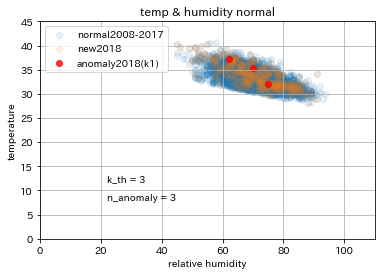

In [432]:
#normal 2008 - 2017
plt.scatter(X[:, 0], X[:, 1], alpha=0.1)

#new 2018
plt.scatter(X_new[:, 0], X_new[:, 1], alpha=0.1)

#anomaly 2018
plt.scatter(X_new[anomaly_idx_k1, 0], X_new[anomaly_idx_k1, 1], alpha=0.8,c='red')
plt.title("temp & humidity normal")

plt.grid()
plt.xlim([0, 110])
plt.ylim([0, 45])
plt.legend(['normal2008-2017','new2018','anomaly2018(k1)'])
plt.xlabel("relative humidity")
plt.ylabel("temperature")
plt.text(22,12,'k_th = %s'%k_th)
plt.text(22,8,'n_anomaly = %s'%len(anomaly_idx_k1))
plt.show()

## 近傍数 kth=10

In [433]:
from sklearn.neighbors import RadiusNeighborsClassifier

epsilon = 2  #　半径
k_th = 10  # 閾値(近傍点の個数)

rneigh = RadiusNeighborsClassifier(radius=epsilon)
rneigh.fit(X , y)

RadiusNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
             metric_params=None, outlier_label=None, p=2, radius=2,
             weights='uniform')

In [434]:
#判定
j = 0
anomaly_idx_k2=[]
dist, ind = rneigh.radius_neighbors(X_new, radius=epsilon)
np.set_printoptions(precision=2)

for d in dist:
    j = j + 1
    if len(d) < k_th:
        anomaly_idx_k2.append(j)
        # print("Anomaly No = ", j, " / Dist to Neigh = ",d)
        if j >= X_new.shape[0]-1:
            break
    else:
        pass

In [435]:
len(anomaly_idx_k2)

9

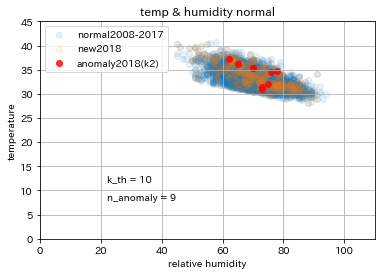

In [436]:
#normal 2008 - 2017
plt.scatter(X[:, 0], X[:, 1], alpha=0.1)

#new 2018
plt.scatter(X_new[:, 0], X_new[:, 1], alpha=0.1)

#anomaly 2018
plt.scatter(X_new[anomaly_idx_k2, 0], X_new[anomaly_idx_k2, 1], alpha=0.8,c='red')
plt.title("temp & humidity normal")

plt.grid()
plt.xlim([0, 110])
plt.ylim([0, 45])
plt.legend(['normal2008-2017','new2018','anomaly2018(k2)'])
plt.xlabel("relative humidity")
plt.ylabel("temperature")
plt.text(22,12,'k_th = %s'%k_th)
plt.text(22,8,'n_anomaly = %s'%len(anomaly_idx_k2))
plt.show()

## e基準

* 𝜀基準
    * なんらかの方法で適切な𝑘を決める
    * 半径の閾値$𝜀_{𝑡ℎ}$を決める
    * 新たな観測値$𝑥′$に対して、𝑘近傍となる標本を$𝐷$から選ぶ
    * それを取り囲む最小の半径$𝜀$を求める
    * それが閾値$𝜀_{𝑡ℎ}$を下回ったら$𝑥′$は異常であると判定する

## 半径 epsilon = 3

In [437]:
# 正常
from sklearn.neighbors import KNeighborsClassifier

k = 10 # 近傍点の個数
epsilon_th = 3 # 閾値(半径)

#normal 2017 nagoya
X= dfw_cut[["relative_humidity_ave","temp_max"]].values
y=[0]*len(X)

kneigh = KNeighborsClassifier(n_neighbors=k)
kneigh.fit(X, y) 

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=10, p=2,
           weights='uniform')

In [438]:
#判定
j = 0
anomaly_idx_e1=[]
dist, ind = kneigh.kneighbors(X_new)

for d in dist:
    j = j + 1
    r = np.max(d)
        
    if r > epsilon_th:
        anomaly_idx_e1.append(j)
        # print("Anomaly No = ", j, " / Dist to Neigh = ",d)
        if j >= X_new.shape[0]-1:
            break
    else:
        pass

In [439]:
len(anomaly_idx_e1)

3

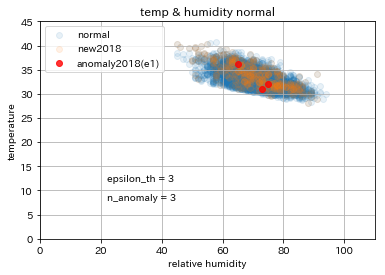

In [440]:
#normal 2008-2017
plt.scatter(X[:, 0], X[:, 1], alpha=0.1)
#new 2018
plt.scatter(X_new[:, 0], X_new[:, 1], alpha=0.1)
#anomaly 2018
plt.scatter(X_new[anomaly_idx_e1, 0], X_new[anomaly_idx_e1, 1], alpha=0.8,c='red')
plt.title("temp & humidity normal")

plt.grid()
plt.xlim([0, 110])
plt.ylim([0, 45])
plt.legend(['normal','new2018','anomaly2018(e1)'])
plt.xlabel("relative humidity")
plt.ylabel("temperature")
plt.text(22,12,'epsilon_th = %s'%epsilon_th)
plt.text(22,8,'n_anomaly = %s'%len(anomaly_idx_e1))
plt.show()

## 半径 epsilon = 2

In [441]:
# 正常
from sklearn.neighbors import KNeighborsClassifier

k = 10 # 近傍点の個数
epsilon_th = 2 # 閾値(半径)

X= dfw_cut[["relative_humidity_ave","temp_max"]].values

kneigh = KNeighborsClassifier(n_neighbors=k)
kneigh.fit(X, y) 

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=10, p=2,
           weights='uniform')

In [442]:
#判定

j = 0
anomaly_idx_e2=[]
dist, ind = kneigh.kneighbors(X_new)

for d in dist:
    j = j + 1
    r = np.max(d)
        
    if r > epsilon_th:
        anomaly_idx_e2.append(j)
        # print("Anomaly No = ", j, " / Dist to Neigh = ",d)
        if j >= X_new.shape[0]-1:
            break
    else:
        pass

In [443]:
len(anomaly_idx_e2)

9

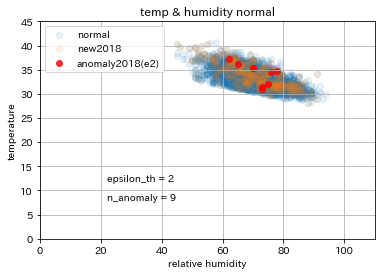

In [444]:
#normal 
plt.scatter(X[:, 0], X[:, 1], alpha=0.1)
#new 2018 
plt.scatter(X_new[:, 0], X_new[:, 1], alpha=0.1)
#anomaly 2018 
plt.scatter(X_new[anomaly_idx_e2, 0], X_new[anomaly_idx_e2, 1], alpha=0.8,c='red')
plt.title("temp & humidity normal")

plt.grid()
plt.xlim([0, 110])
plt.ylim([0, 45])
plt.legend(['normal','new2018','anomaly2018(e2)'])
plt.xlabel("relative humidity")
plt.ylabel("temperature")
plt.text(22,12,'epsilon_th = %s'%epsilon_th)
plt.text(22,8,'n_anomaly = %s'%len(anomaly_idx_e2))
plt.show()

気温と湿度の外れ値と思われるデータをうまく検出できていないように見受けられる。。。

# 局所外れ値度（LOF）

局所外れ値度(local outliers factor, LOF)は、 近傍法の考え方を拡張した指標

LOFが大きいほど異常であると考える

$\displaystyle a_{LOF}(\boldsymbol{x}')=\frac{1}{k}\sum_{\boldsymbol{x}\in N_k(\boldsymbol{x}')} \frac{d_k(\boldsymbol{x}')}{d_k(\boldsymbol{x})}$  
$\boldsymbol{x}'$ : 観測点   
$a_{LOF}(\boldsymbol{x}')$ : 観測点$\boldsymbol{x}'$の異常度  
$d_k(\boldsymbol{x})$ : 近傍有効距離$l_k$を$\boldsymbol{x}$の周りの$k$近傍にわたり平均したもの  
$d_k(\boldsymbol{x}')$ : 近傍有効距離$l_k$を$\boldsymbol{x'}$の周りの$k$近傍にわたり平均したもの  


$d_k(\boldsymbol{x})$および$d_k(\boldsymbol{x}')$は、次のように定義される    
ここでは、$\boldsymbol{x}$または$\boldsymbol{x}'$を$\boldsymbol{u}$という記号で表現する  
$\displaystyle d_k(\boldsymbol{u})=\frac{1}{k}\sum_{\boldsymbol{u}' \in N_k(\boldsymbol{u})}l_k(\boldsymbol{u}\longrightarrow \boldsymbol{u}')$  
  

$ l_k(\boldsymbol{u}\longrightarrow \boldsymbol{u}') \equiv \
  \left\{
    \begin{array}{l}
      \epsilon_k(\boldsymbol{u}') ~~~~~~~(\boldsymbol{u}\in N_k(\boldsymbol{u}')かつ\boldsymbol{u}' \in N_k(\boldsymbol{u}))\\
      d(\boldsymbol{u}, \boldsymbol{u}')~ ~~~ (上記以外)
    \end{array}
  \right.
$

$d(\boldsymbol{u}, \boldsymbol{u}') $: ユークリッド距離など 
      
$ l_k(\boldsymbol{u}\longrightarrow \boldsymbol{u}')$ : $\boldsymbol{u}$から$\boldsymbol{u}'$への近傍有効距離  

In [447]:
def func_lof(X, k):
    clf = LocalOutlierFactor(n_neighbors=k)
    y_pred = clf.fit_predict(X)
    X_scores = clf.negative_outlier_factor_
    lof = -1 * clf.negative_outlier_factor_
    #   print("lof=%s"%lof)
    plt.title("Local Outlier Factor (LOF)")

    plt.scatter(X[:, 0], X[:, 1], color='k', s=3., label='Data points')

    # 0-1に正規化
    radius = (X_scores.max() - X_scores) / (X_scores.max() - X_scores.min())

    plt.scatter(
        X[:, 0],
        X[:, 1],
        s=1000 * radius,
        edgecolors='r',
        alpha=0.3,
        facecolors='none',
        label='Outlier scores')
    plt.axis('tight')
    plt.xlim([0, 110])
    plt.ylim([0, 45])
    legend = plt.legend(loc='upper left')
    legend.legendHandles[0]._sizes = [10]
    legend.legendHandles[1]._sizes = [20]
    plt.show()

    plt.plot(lof, marker="o")
    plt.ylabel("LOF")
    plt.xlabel("data ID")
    plt.show()
    return lof

## k=20

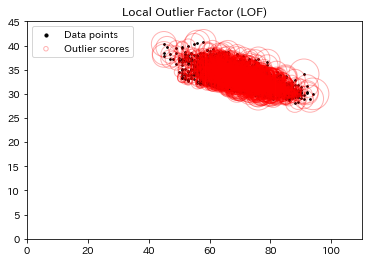

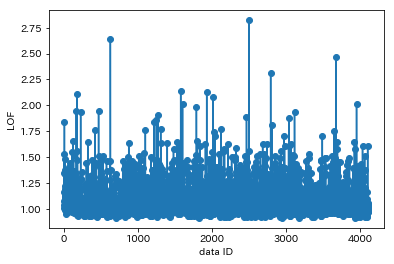

In [448]:
# X_new =  2018 _ all (temp & humidity) 

k = 20
X = np.r_[X]
lof = func_lof(X, k)

(0, 45)

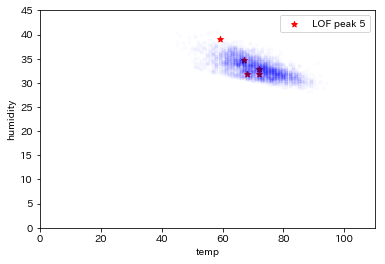

In [485]:
# plot LOF  (1 to 5 th)
plt.scatter(X[lof.argsort()[:5],0], X[lof.argsort()[:5],1],marker='*',c='r',label='LOF peak 5')
plt.scatter(X[lof.argsort()[5:],0], X[lof.argsort()[5:],1],marker='.',c='b',alpha=0.01)
plt.xlabel('temp')
plt.ylabel('humidity')
plt.legend()
plt.xlim([0, 110])
plt.ylim([0, 45])    

LOFピーク値上位５位を描画して見ると外れ値でないものも拾っている様子

## k=1

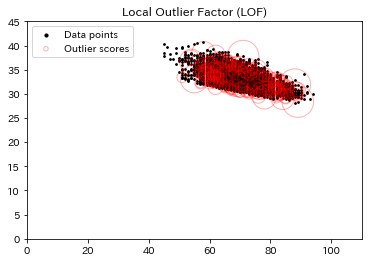

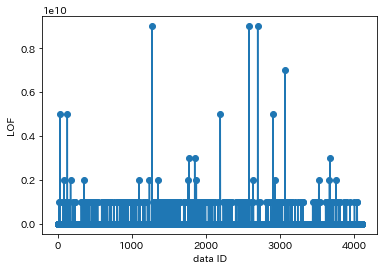

In [455]:
k = 1
X = np.r_[X]
lof = func_lof(X, k)

LOF値が発散

# 1クラスSVM

• 1クラスサポートベクトルマシン ： サポートベクトルの考え方を教師 なし学習に適応

• 異常検知などに利用される

• 1クラスサポートベクトルマシンには、大きくわけて2つの種類

  ①サポートベクトルデータ記述法 (support vector data desctiption, SVDD) 

    正常データを超球で包み、その半径を最適化する方法

  ②1クラスν-SVM

    1クラスν-SVMは、ν-SVMの考え方を教師なし学習に適応したもの

    原点を異常データの代表値とみなし、なるべく原点から離れる識別境界を探す

In [488]:
# X =  2008-2018 _ all (humidity&temp) 

df= []
df = pd.DataFrame({'relative_humidity_ave':X.T[0],'temp_max': X.T[1]})

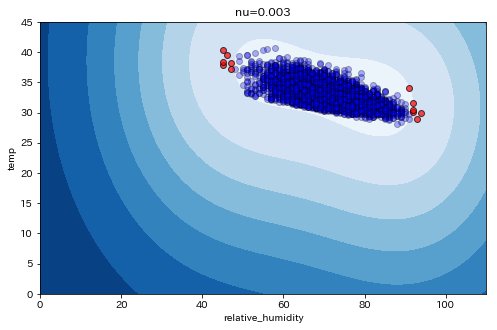

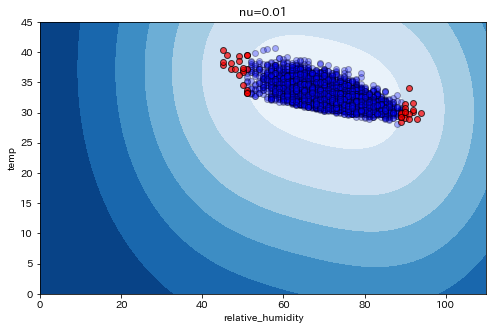

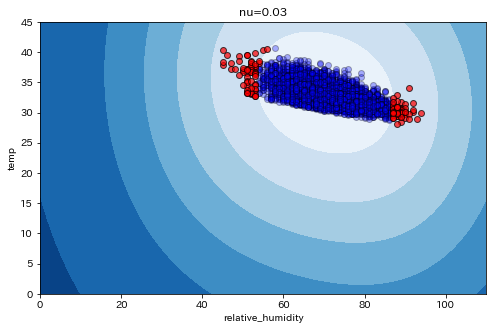

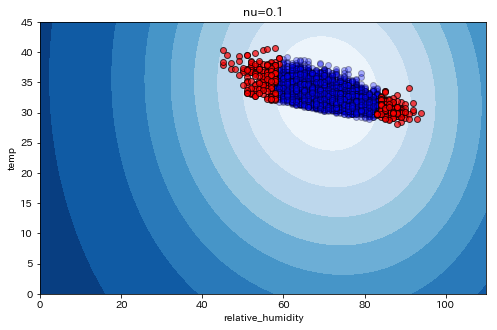

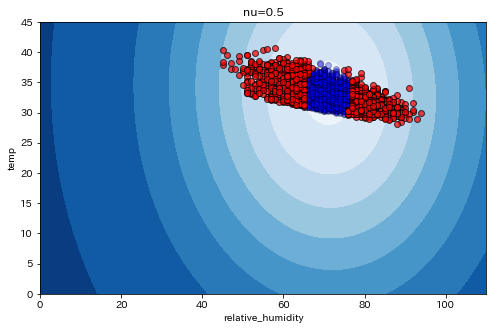

In [489]:
# plot 1class SVM

for nu in [0.003,0.01, 0.03,0.1, 0.5]:
    
    # 1クラスvu-SVMの実行
    clf = svm.OneClassSVM(nu=nu, kernel="rbf", gamma=0.001)
    clf.fit(X)

    plt.figure(figsize=(8,5))
    xx, yy = np.meshgrid(np.linspace(0, 110, 100), np.linspace(0, 45, 100))
    Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, cmap=plt.cm.Blues_r)
    
        # 結果の描画
    df["y_pred"] = clf.predict(X)
    df_ = df[df["y_pred"]==1]
    plt.scatter(df_["relative_humidity_ave"], df_["temp_max"], edgecolor='k',c="b",alpha=0.3)
    
    df_ =df[df["y_pred"]==-1]
    plt.scatter(df_["relative_humidity_ave"], df_["temp_max"], edgecolor='k',c="r",alpha=0.7)
    
    plt.title("nu=%s"%nu)
    plt.xlim([0, 110])
    plt.ylim([0, 45])
    plt.xlabel("relative_humidity")
    plt.ylabel("temp")
    
    plt.show()

発生率（ν）に応じ異常データ（RED）が元データ（BLUE）から検出できている模様

## SVDD

正常データを超球で包み、その半径を最適化する方法

In [490]:
import sys
sys.path.append('/Users/peasucrivafie/Documents/python/libsvm-3.22/python')
sys.path.append('/Users/yk131/iCloudDrive/Documents/python/libsvm-3.22/python')
from svm import *
from svmutil import *

In [491]:
X= dfw[["relative_humidity_ave","temp_max"]].values
y=[-1]*len(dfw)

X_=X.tolist()

In [492]:
# For learning

prob=svm_problem(y,X_)
parameter = svm_parameter('-s 5')  # SVDD ,d=3, rbf
t = svm_train(prob, parameter)

In [493]:
# For predict
Xp = [[50,20],[60,25],[80,35]]
yp = [-1,-1,1]

In [494]:
result = svm_predict(yp, Xp, t)

Accuracy = 33.3333% (1/3) (classification)


# 主成分分析

• 元の変数に重みをかけた新しい合成変数(主成分)に よって、次元軸を減らす手法

• データの次元削減や、データの特性を抽出するのに役立つ

• 多次元データを低次元(2次元のグラフなど)で可視化できる

異常度の定義
$\displaystyle a({\boldsymbol x}')=||{\boldsymbol x}'_{(1)}||^2=||{\boldsymbol x}' - {\boldsymbol x}'_{(2)}||^2$  
${\boldsymbol x}'_{(2)}=U_m{U_m}^{T}{\boldsymbol x}'$  

${\boldsymbol x}'$ : 異常度を算出したい点  
${\boldsymbol x}'_{(1)}$ : 正常部分空間からはみ出る成分  
${\boldsymbol x}'_{(2)}$ : 正常部分空間の成分  
$U_m$ : 主成分ベクトルを列方向に並べた行列  
$m$ : 採用した主成分ベクトルの本数

In [496]:
from sklearn.decomposition import PCA

## data 2008-2017

In [497]:
dfw_4 = dfw[['temp_max','sr_sum','wind_speed_ave','relative_humidity_ave']]

In [498]:
# 散布行列の固有値を計算し、累積寄与度を確認

#place,time 除去
#dfw_ = dfw.drop(["place", "time"], axis=1)

pca = PCA(n_components=4)
pca.fit(dfw_4)

PCA(copy=True, iterated_power='auto', n_components=4, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

## plot principal component

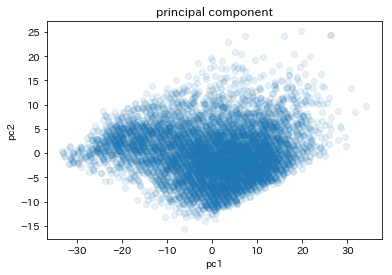

各次元の寄与率: [0.75 0.18 0.05 0.02]
累積寄与率: 1.0000000000000002


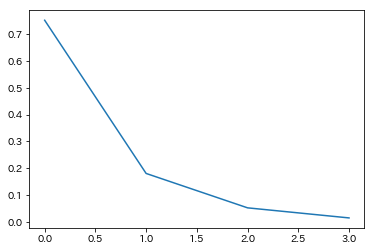

In [499]:
# 分析結果を元にデータセットを主成分に変換する

transformed = pca.fit_transform(dfw_4)

# 主成分をプロットする
plt.scatter(transformed[:, 0], transformed[:, 1], alpha=0.1)

plt.title('principal component')
plt.xlabel('pc1')
plt.ylabel('pc2')

# グラフを表示する
plt.show()

# 主成分の寄与率を出力する
print('各次元の寄与率: {0}'.format(pca.explained_variance_ratio_))
print('累積寄与率: {0}'.format(sum(pca.explained_variance_ratio_)))

plt.plot(pca.explained_variance_ratio_)

# グラフを表示する
plt.show()

## plot temp & humidity

Text(0,0.5,'temp')

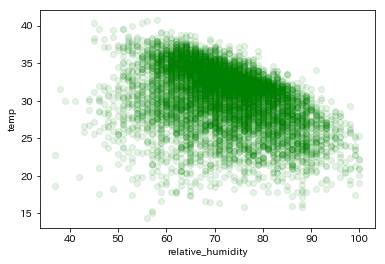

In [500]:
plt.scatter(dfw_4['relative_humidity_ave'],dfw_4['temp_max'],alpha=0.1,color='g')
plt.xlabel('relative_humidity')
plt.ylabel('temp')

## 主成分分析を用いて、新しい第1主成分軸と第2主成分軸に射影

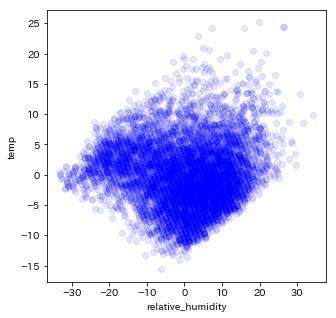

In [501]:
pca = PCA(n_components=2)
pca.fit(dfw_4)

X_dash = pca.transform(dfw_4)

plt.figure(figsize=(5, 5))
plt.scatter(X_dash[:, 0], X_dash[:, 1], marker="o", c="b", alpha=0.1)
plt.xlabel('relative_humidity')
plt.ylabel('temp')
plt.show()

## 正常部分空間の成分である${\boldsymbol x}'_{(2)}$を求める

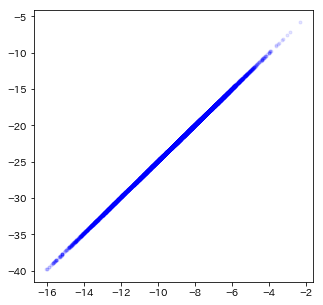

In [502]:
pca = PCA(n_components=1)
pca.fit(dfw_4)

# 主成分ベクトル
U = pca.components_.T

# 正常部分空間の成分
X_2_n = np.dot(U, np.dot(U.T, dfw_4.T)).T

plt.figure(figsize=(5,5))
plt.scatter(X_2_n[:,0], X_2_n[:,1], marker=".", c="b",alpha=0.1)

plt.show()

## 正常部分空間からはみ出る成分である${\boldsymbol x}'_{(1)}$を求める

In [503]:
X_1_n =  dfw_4 - X_2_n

## 異常度

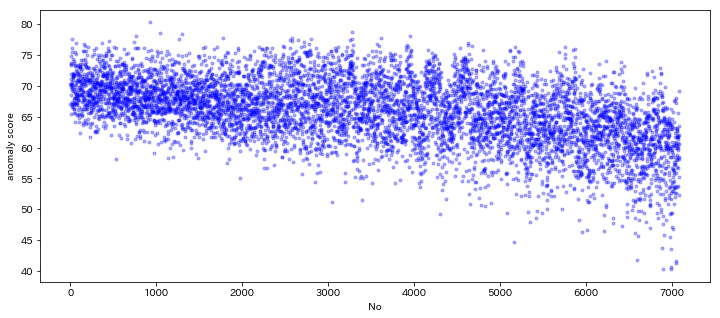

In [504]:
ascore_n = np.linalg.norm(X_1_n, axis=1)

plt.figure(figsize=(12, 5))
plt.plot(ascore_n, marker=".", c="b", ls="", alpha=0.3)

plt.ylabel("anomaly score")
plt.xlabel("No")
plt.show()

In [505]:
dfw_4.iloc[ascore_n.argsort()].head()

,temp_max,sr_sum,wind_speed_ave,relative_humidity_ave
6987,19.9,10.60,4.4,42
6895,18.6,15.93,5.0,37
6988,17.6,10.33,2.9,46
7052,22.8,13.73,3.7,37
7051,19.6,4.06,2.3,53


In [506]:
dfw_4.iloc[ascore_n.argsort()].tail()

,temp_max,sr_sum,wind_speed_ave,relative_humidity_ave
759,31.8,27.07,2.3,82
1295,31.9,22.26,6.6,88
1043,33.7,28.61,3.1,79
3278,31.9,28.48,6.4,81
930,31.3,27.64,2.4,86


# 密度比推定

uLSIF (unconstrained Least-Squares Importance Fitting) 

In [507]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from numpy import random
from numpy import linspace
from scipy.stats import norm
from densratio import densratio
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import display

In [508]:
# new data 2018 -> temp only

dfw_temp = dfw.temp_max

In [509]:
# EM法で分離した nagoya 2017 data を正常データとして扱う -> temp only

X = dfw_cut[["relative_humidity_ave", "temp_max"]].values
df_temp=pd.DataFrame(X.T[1])

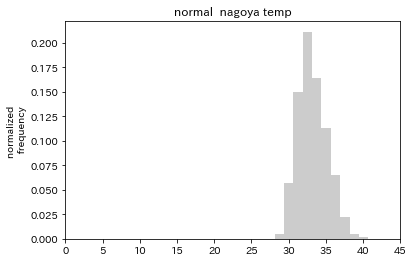

In [510]:
sns.distplot(df_temp, kde=False, norm_hist=True, bins=10, color="gray")
plt.title("normal  nagoya temp")
plt.xlim([0, 45])
#plt.ylim([0, 0.5])
plt.ylabel("normalized \n frequency")
plt.show()

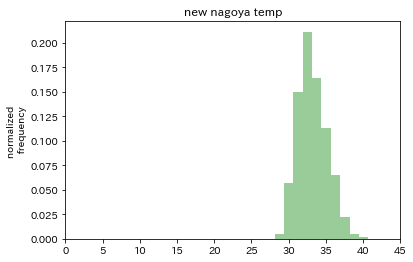

In [511]:
# 異常を含む可能性のある新しく観測されたデータ 100 point

sns.distplot(df_temp, kde=False, norm_hist=True, bins=10,color="green")
plt.title("new nagoya temp")
plt.xlim([0,45])
plt.ylabel("normalized \n frequency")
plt.show()

In [512]:
x1 = np.array((df_temp - df_temp.mean(axis=0)) / df_temp.std(axis=0))
x2 = np.array((dfw_temp -dfw_temp.mean(axis=0)) / dfw_temp.std(axis=0))


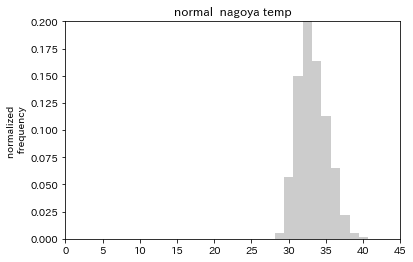

In [513]:
# 正常のみのデータ

sns.distplot(df_temp, kde=False, norm_hist=True, bins=10, color="gray")
plt.title("normal  nagoya temp")
plt.xlim([0, 45])
plt.ylim([0, 0.2])
# plt.xlabel("temp[deg]")
plt.ylabel("normalized \n frequency")
plt.show()

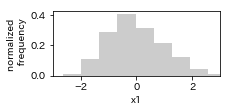

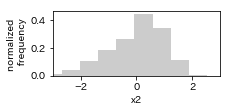

In [514]:
plt.figure(figsize=(3,1.2))
sns.distplot(x1, kde=False, norm_hist=True, bins=10,color="gray")
plt.xlabel("x1")
plt.xlim([-3,3])
plt.ylabel("normalized \n frequency")
plt.show()

plt.figure(figsize=(3,1.2))
sns.distplot(x2, kde=False, norm_hist=True, bins=10,color="gray")
plt.xlabel("x2")
plt.xlim([-3,3])
plt.ylabel("normalized \n frequency")
plt.show()

In [515]:
# 密度比推定を実行
result = densratio(x1,x2)
print(result)

################## Start uLSIF ##################
Searching optimal sigma and lambda...
  sigma = 0.001, lambda = 0.001, score = -25.326
Found optimal sigma = 0.001, lambda = 0.001.
Optimizing alpha...
End.
################## Finished uLSIF ###############
Method: uLSIF

Kernel Information:
  Kernel type: Gaussian RBF
  Number of kernels: 100
  Bandwidth(sigma): 0.001
  Centers: matrix([[ 1.03e-01],..

Kernel Weights(alpha):
  array([16.31, 15.82, 7.06, 12.41, 9.01, 15.82, 12.41, 17.77, 17.77,..

Regularization Parameter(lambda): 0.001

The Function to Estimate Density Ratio:
  compute_density_ratio(x)


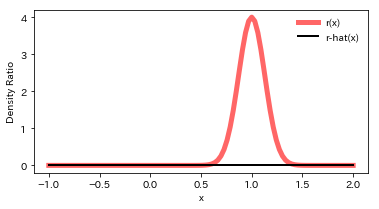

In [516]:
def true_density_ratio(x):
    """
    正解の密度比を算出する
    """
    return norm.pdf(x, 1, 1./8) / norm.pdf(x, 1, 1./2)

def estimated_density_ratio(x):
    """
    推定した密度比を取り出す
    """
    return result.compute_density_ratio(x)

x = linspace(-1, 2, 100)
plt.figure(figsize=(6,3))
plt.plot(x, true_density_ratio(x), "r-", lw=5, alpha=0.6, label="r(x)")
plt.plot(x, estimated_density_ratio(x), "k-", lw=2, label="r-hat(x)")
plt.legend(loc="best", frameon=False)
plt.xlabel("x")
plt.ylabel("Density Ratio")
plt.show()

In [517]:
# 参考

# アイソレーションフォレスト

## データ生成

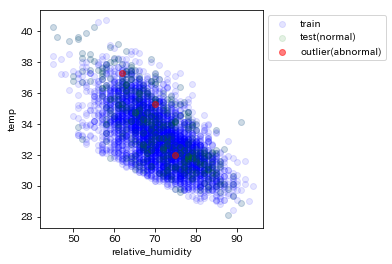

In [519]:
# 学習用データ
X_train = dfw_cut[["relative_humidity_ave","temp_max"]].values

# テスト用データ(正常)
X_test = X_new

# テスト用　データ(異常) 　→　knnの異常値を流用
X_outliers = X_new[anomaly_idx_k1]

plt.figure(figsize=(4,4))
plt.scatter(X_train[:,0],X_train[:,1], c="b",alpha=0.1)
plt.scatter(X_test[:,0],X_test[:,1], c="g",alpha=0.1)
plt.scatter(X_outliers[:,0],X_outliers[:,1], c="r",alpha=0.5)

plt.xlabel("relative_humidity")
plt.ylabel("temp")
plt.legend(["train","test(normal)","outlier(abnormal)"], bbox_to_anchor=[1,1])

## 学習

In [520]:
# fit the model
# rng = np.random.RandomState(42)
clf = IsolationForest(max_samples=100, random_state=None)
clf.fit(X_train)
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)
y_pred_outliers = clf.predict(X_outliers)

## 結果の描画

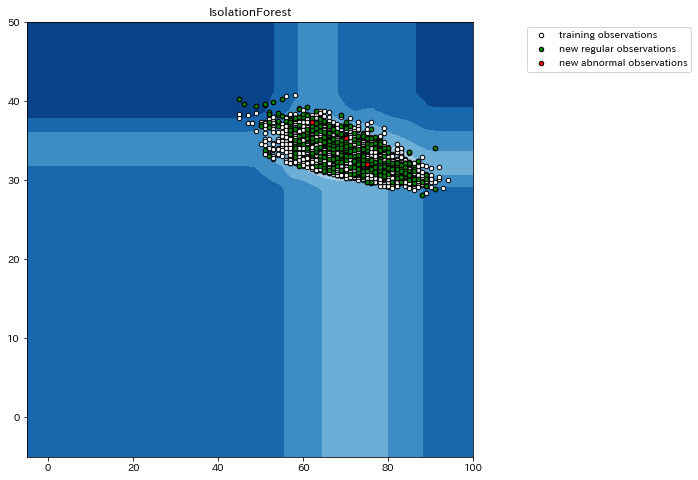

In [521]:
# 決定境界の描画
xx, yy = np.meshgrid(np.linspace(-5, 100, 50), np.linspace(-5, 50, 50))
Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.figure(figsize=(8,8))
plt.title("IsolationForest")
plt.contourf(xx, yy, Z, cmap=plt.cm.Blues_r)

# 観測点の描画
b1 = plt.scatter(X_train[:, 0], X_train[:, 1], c='white',
                 s=20, edgecolor='k')
b2 = plt.scatter(X_test[:, 0], X_test[:, 1], c='green',
                 s=20, edgecolor='k')
c = plt.scatter(X_outliers[:, 0], X_outliers[:, 1], c='red',
                s=20, edgecolor='k')
plt.axis('tight')

plt.legend([b1, b2, c],
           ["training observations",
            "new regular observations", "new abnormal observations"],
          bbox_to_anchor=[1.5,1])
plt.show()

外れ値としてKNNの結果を流用しているため、KNNと同様に検知が適切にできていないと考えられる   
搬送者の上位などを異常データとして与えてみる余地あり

# AutoRegressive model

In [685]:
# load hour data 2016 to 2018

#2016
df2016 = pd.read_excel(
    'data/hot/zenkoku2016.xlsx',
    sheet_name='Sheet1',
    index_col='time',
    parse_dates=['time'])

ta = df2016["temp"]
ws = df2016["wind_speed"]
sr = df2016["solar_radiation"]
rh = df2016["relative_humidity"]

wbgt = []
wbgt = 0.735 * ta + 0.0374 * rh + 0.00292 * ta * rh + 7.619 * sr - 4.557 * sr**2 - 0.0572 * ws - 4.064
wbgt = pd.DataFrame(wbgt, columns=["wbgt"])

df6w = pd.concat([df2016, wbgt], axis=1)  # 4data + wbgt

df6w.dropna(inplace=True)

wbgt6 = df6w["wbgt"].values  # wbgt value

df6wt = df6w[df6w['place'] == 'tokyo']  # tokyo
df6wn = df6w[df6w['place'] == 'nagoya']  # nagoya
df6wo = df6w[df6w['place'] == 'osaka']  # osaka

N6t = len(df6wt)
N6n = len(df6wn)
N6o = len(df6wo)

#2017
df2017 = pd.read_excel(
    'data/hot/zenkoku2017.xlsx',
    sheet_name='Sheet1',
    index_col='time',
    parse_dates=['time'])

ta = df2017["temp"]
ws = df2017["wind_speed"]
sr = df2017["solar_radiation"]
rh = df2017["relative_humidity"]

wbgt = []
wbgt = 0.735 * ta + 0.0374 * rh + 0.00292 * ta * rh + 7.619 * sr - 4.557 * sr**2 - 0.0572 * ws - 4.064
wbgt = pd.DataFrame(wbgt, columns=["wbgt"])

df7w = pd.concat([df2017, wbgt], axis=1)  # 4data + wbgt

df7w.dropna(inplace=True)

wbgt7 = df7w["wbgt"].values  # wbgt value

df7wt = df7w[df7w['place'] == 'tokyo']  # tokyo
df7wn = df7w[df7w['place'] == 'nagoya']  # nagoya
df7wo = df7w[df7w['place'] == 'osaka']  # osaka

N7t = len(df7wt)
N7n = len(df7wn)
N7o = len(df7wo)

#2018
df2018 = pd.read_excel(
    'data/hot/zenkoku2018.xlsx',
    sheet_name='Sheet1',
    index_col='time',
    parse_dates=['time'])

ta = df2018["temp"]
ws = df2018["wind_speed"]
sr = df2018["solar_radiation"]
rh = df2018["relative_humidity"]

wbgt = []
wbgt = 0.735 * ta + 0.0374 * rh + 0.00292 * ta * rh + 7.619 * sr - 4.557 * sr**2 - 0.0572 * ws - 4.064
wbgt = pd.DataFrame(wbgt, columns=["wbgt"])

df8w = pd.concat([df2018, wbgt], axis=1)  # 4data + wbgt

df8w.dropna(inplace=True)

wbgt8 = df8w["wbgt"].values  # wbgt value

df8wt = df8w[df8w['place'] == 'tokyo']  # tokyo
df8wn = df8w[df8w['place'] == 'nagoya']  # nagoya
df8wo = df8w[df8w['place'] == 'osaka']  # osaka

N8t = len(df8wt)
N8n = len(df8wn)
N8o = len(df8wo)

## plot

In [686]:
temp6n=df6wn.temp
humid6n=df6wn.relative_humidity
temp7n=df7wn.temp
humid7n=df7wn.relative_humidity
temp8n=df8wn.temp
humid8n=df8wn.relative_humidity
x=range(2208)

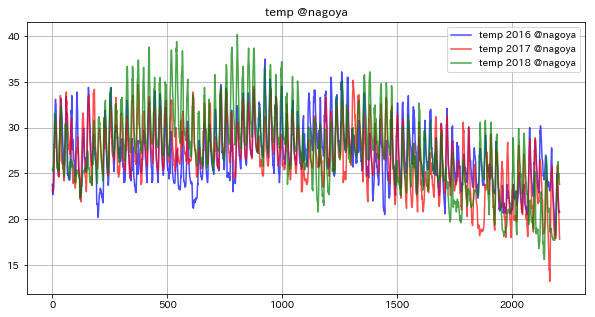

In [687]:
plt.figure(figsize=(10,5))
plt.title('temp @nagoya')
plt.plot(x,temp6n,label='temp 2016 @nagoya',c='b',alpha=0.7)
plt.plot(x,temp7n,label='temp 2017 @nagoya',c='r',alpha=0.7)
plt.plot(x,temp8n,label='temp 2018 @nagoya',c='g',alpha=0.7)
plt.legend(loc='best')
plt.grid()
plt.show()

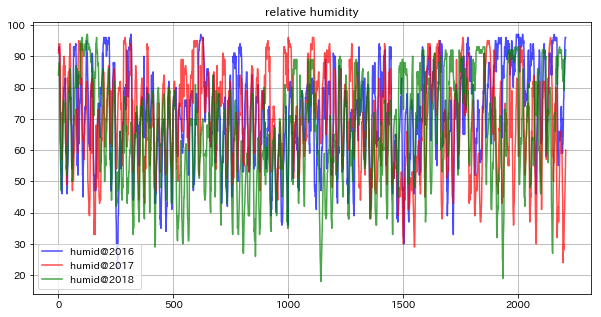

In [688]:
# humid 2016-2018
plt.figure(figsize=(10,5))
plt.title('relative humidity')
plt.plot(x,humid6n,label='humid@2016 ',c='b',alpha=0.7)
plt.plot(x,humid7n,label='humid@2017 ',c='r',alpha=0.7)
plt.plot(x,humid8n,label='humid@2018 ',c='g',alpha=0.7)
plt.legend(loc='best')
plt.grid()

## decompose

In [689]:
df_temp6n=pd.DataFrame(df6wn['temp']) 
df_temp7n=pd.DataFrame(df7wn['temp']) 
df_temp8n=pd.DataFrame(df8wn['temp']) 

In [690]:
res6 = sm.tsa.seasonal_decompose(df_temp6n)
res7 = sm.tsa.seasonal_decompose(df_temp7n)
res8 = sm.tsa.seasonal_decompose(df_temp8n)

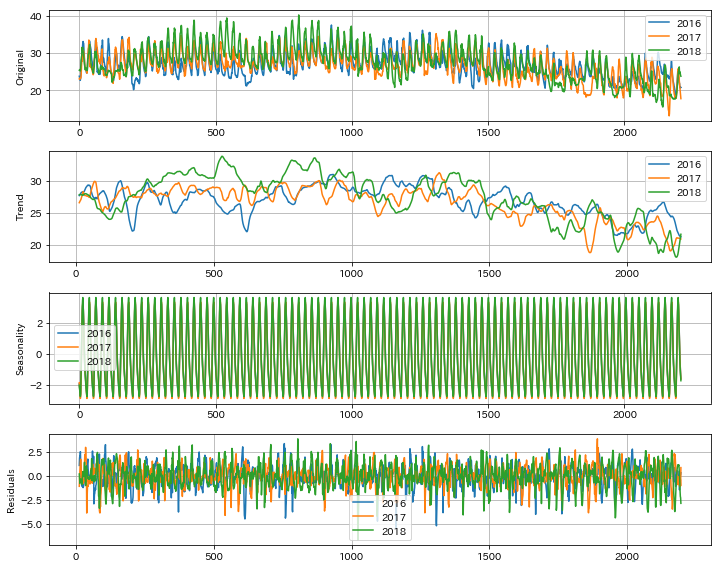

In [691]:
# plot temp about trend,seasonal and residual

plt.figure(figsize=(10, 8))

plt.subplot(411)
plt.plot(x, df_temp6n, label='2016')
plt.plot(x, df_temp7n, label='2017')
plt.plot(x, df_temp8n, label='2018')
plt.grid()
plt.legend()
plt.ylabel('Original')

# trend
plt.subplot(412)
plt.plot(x, res6.trend, label='2016')
plt.plot(x, res7.trend, label='2017')
plt.plot(x, res8.trend, label='2018')
plt.grid()
plt.legend()
plt.ylabel('Trend')

# seasonal
plt.subplot(413)
plt.plot(x, res6.seasonal, label='2016')
plt.plot(x, res7.seasonal, label='2017')
plt.plot(x, res8.seasonal, label='2018')
plt.grid()
plt.legend()
plt.ylabel('Seasonality')

# # residual
plt.subplot(414)
plt.plot(x, res6.resid, label='2016')
plt.plot(x, res7.resid, label='2017')
plt.plot(x, res8.resid, label='2018')
plt.grid()
plt.legend()
plt.ylabel('Residuals')

plt.tight_layout()
plt.show()

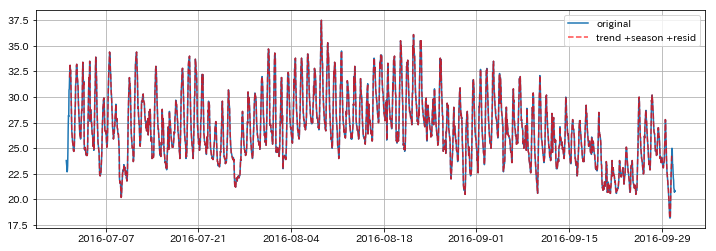

In [692]:
# check
original = df_temp6n
trend = res6.trend
seasonal = res6.seasonal
residual = res6.resid
sum_three_data = trend + seasonal + residual

plt.figure(figsize=(12, 4))
plt.plot(original, label='original')
plt.grid()
plt.plot(
    sum_three_data,
    label='trend +season +resid',
    linestyle='--',
    c='r',
    alpha=0.7)
plt.legend(loc='best')

## １日平均気温

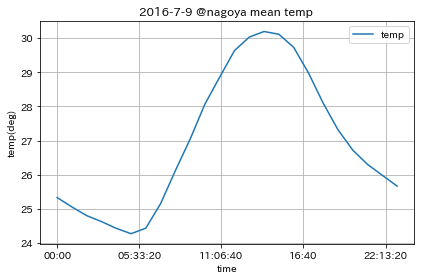

In [693]:
# mean temp

df_temp6n_time_mean = df_temp6n.groupby(df_temp6n.index.time).mean()
df_temp6n_time_mean.plot(kind='line')
plt.title('2016-7-9 @nagoya mean temp ')
plt.grid()
plt.ylabel('temp(deg)')
plt.tight_layout()
plt.show()

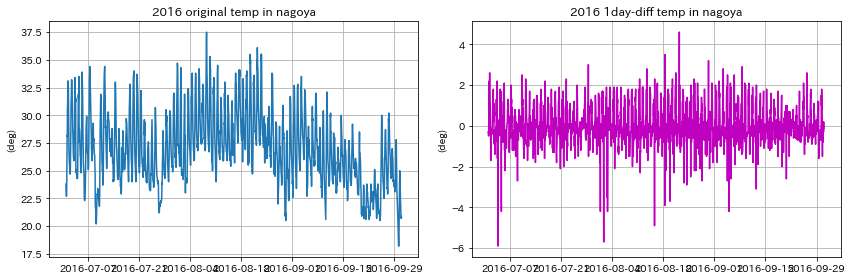

In [694]:
# １day差分

fig = plt.figure(figsize=(12, 4))

# original temp
ax1 = fig.add_subplot(121)
plt.plot(df_temp6n)
plt.title('2016 original temp in nagoya')
plt.ylabel('(deg)')
plt.grid()

df_temp6n_diff = df_temp6n - df_temp6n.shift() # 階差系列データ
df_temp6n_diff = df_temp6n_diff.dropna() 

# diff temp
ax2 = fig.add_subplot(122)
plt.plot(df_temp6n_diff,c='m')
plt.title('2016 1day-diff temp in nagoya')
plt.ylabel('(deg)')
plt.grid()

plt.tight_layout() # グラフ間スキマ調整

## 自己相関、偏自己相関

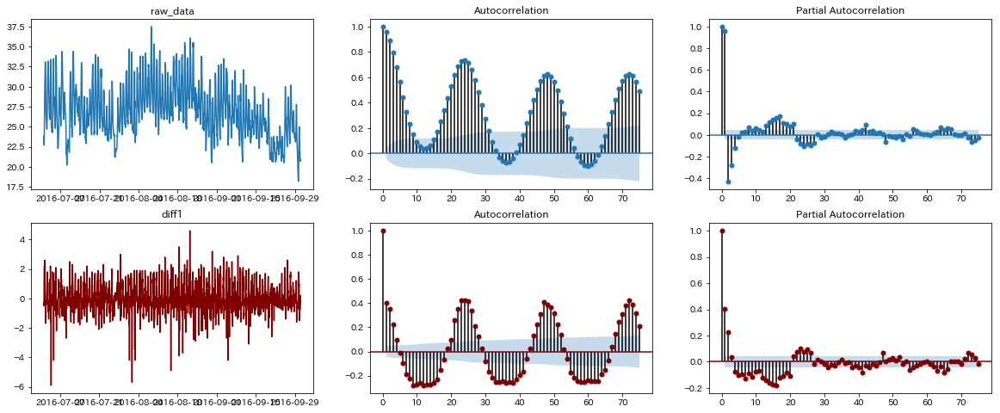

In [695]:
# ACF , PACF 

MAX_LAG = 75 #  >  72 = 24*3

plt.rcParams["font.size"] = 10
fig, ax = plt.subplots(2, 3, figsize=(20, 8))
axes = ax.flatten()
diff_color = "#800000"

axes[0].plot(df_temp6n)
axes[0].set_title("raw_data")
fig = sm.graphics.tsa.plot_acf(df_temp6n, lags=MAX_LAG, ax=axes[1])
fig = sm.graphics.tsa.plot_pacf(df_temp6n, lags=MAX_LAG, ax=axes[2])

axes[3].plot(df_temp6n_diff.dropna(), color=diff_color, alpha=1)
axes[3].set_title("diff1")
fig = sm.graphics.tsa.plot_acf(
    df_temp6n_diff, lags=MAX_LAG, ax=axes[4], color=diff_color)
fig = sm.graphics.tsa.plot_pacf(
    df_temp6n_diff, lags=MAX_LAG, ax=axes[5], color=diff_color)

<font color = 'RED'>偏</font>自己相関係数は、2,3時間の方が、　２４時間、よりも大きい  
LAG=1,2,3,4,8,10,13-21,23-27,42,48,72,73 が有意

## AIC(Akaike's Information Criterion)

In [696]:
# AIC(Akaike's Information Criterion)

import warnings
warnings.filterwarnings('ignore')

# sm.tsa.arma_order_select_ic(y, max_ar=4, max_ma=2, ic='bic', trend='c', model_kw={}, fit_kw={})
# Returns information criteria for many ARMA models

res_selection = sm.tsa.arma_order_select_ic(
    df_temp6n_diff, ic='aic', trend='nc')
res_selection

{'aic':              0            1            2
 0          NaN  5517.080947  5364.670892
 1  5380.392065  5293.908610  5456.707200
 2  5269.630006  5264.584616  4871.697850
 3  5269.158157  5268.843209  4852.731484
 4  5258.936684          NaN  4843.819341, 'aic_min_order': (4, 2)}

$\mathrm {AIC} =-2\ln L+2k$  
$ {\displaystyle L} $:最大尤度、 ${\displaystyle k} $ : パラメータ自由度

## BIC(Bayesian information criterion)

In [697]:
# BIC
res_selection2 = sm.tsa.arma_order_select_ic(
    df_temp6n_diff, ic='bic', trend='nc')
res_selection2

{'bic':              0            1            2
 0          NaN  5528.479725  5381.769061
 1  5391.790844  5311.006778  5479.504758
 2  5286.728174  5287.382173  4900.194797
 3  5291.955715  5297.340156  4886.927820
 4  5287.433631          NaN  4883.715067, 'bic_min_order': (4, 2)}

$\mathrm {BIC}=-2\ln L+k\ln n$  

${\displaystyle L} $ : 尤度関数、 ${\displaystyle n} $ : 標本の大きさあるいは観測の数、 ${\displaystyle k}$ : 母数あるいは独立変数の数

pはAR（自己回帰）、qはMA（移動平均）、dが差分の次数　　　

AIC と　BIC とも p,q=4,2 を示した

In [698]:
# AIC

sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(4, 1, 2),
    seasonal_order=(1, 1, 1, 24),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()

In [699]:
sarimax.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                               temp   No. Observations:                 2208
Model:             SARIMAX(4, 1, 2)x(1, 1, 1, 24)   Log Likelihood               -2263.220
Date:                            Fri, 01 Mar 2019   AIC                           4544.439
Time:                                    18:52:09   BIC                           4595.519
Sample:                                07-01-2016   HQIC                          4563.124
                                     - 10-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2256      0.453      0.498      0.619      -0.663       1.114
ar.L2          0.7669      0.447      1.717      0.086      -0.108       1.642
ar.L3         -0.0615      0.019     -3.184      0.001      -0.099      -0.024
ar.L4         -0.0855      0.039     -2.181      0.029      -0.162      -0.009
ma.L1         -0.2640      0.457     -0.578      0.563      -1.159       0.631
ma.L2         -0.7677      0.463     -1.656      0.098      -1.676       0.141
ar.S.L24       0.0011      0.001      1.627      0.104      -0.000       0.002
ma.S.L24      -1.0266      0.009   -113.748      0.000      -1.044      -1.009
sigma2         0.4256      0.010     43.976      0.000       0.407       0.445
===================================================================================
Ljung-Box (Q):                       69.32   Jarque-Bera (JB):              6329.35
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.83   Skew:                            -1.27
Prob(H) (two-sided):                  0.01   Kurtosis:                        11.00
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## AR次数を変えた場合

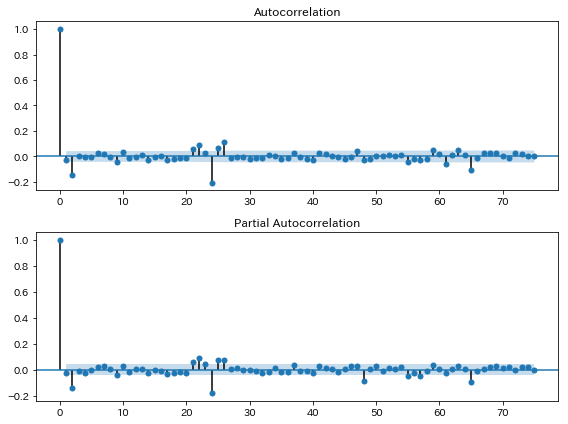

In [700]:
# AIC order=(4, 1, 2)

sarimax_resid = sarimax.resid

fig = plt.figure(figsize=(8, 6))

ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 

ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 

plt.tight_layout()

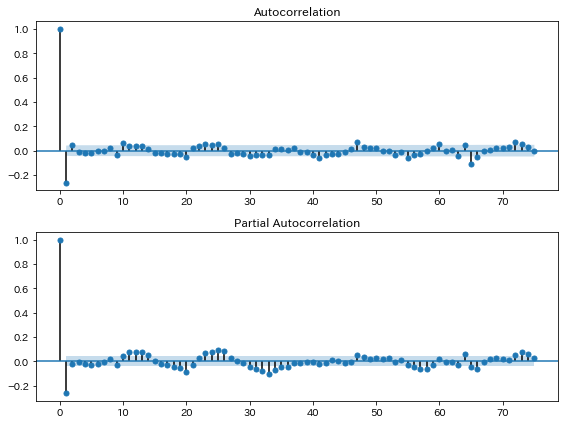

In [701]:
#  no seasonality

sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(4, 1, 2),
    seasonal_order=(0,0, 0, 0),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()
sarimax.summary()
sarimax_resid = sarimax.resid
fig = plt.figure(figsize=(8, 6))
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 
plt.tight_layout()

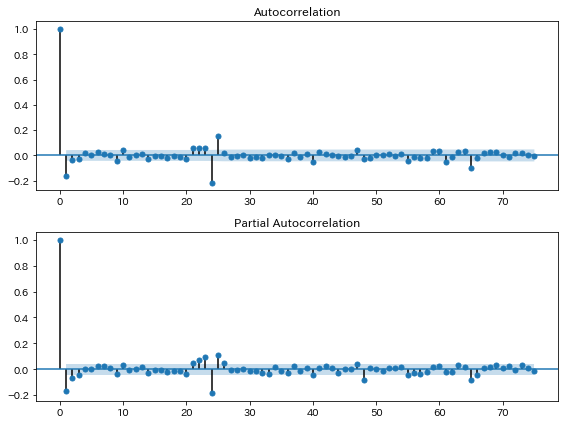

In [702]:
# order=(4, 1, 1)
sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(4, 1, 1),
    seasonal_order=(1, 1, 1, 24),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()
sarimax.summary()
sarimax_resid = sarimax.resid
fig = plt.figure(figsize=(8, 6))
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 
plt.tight_layout()

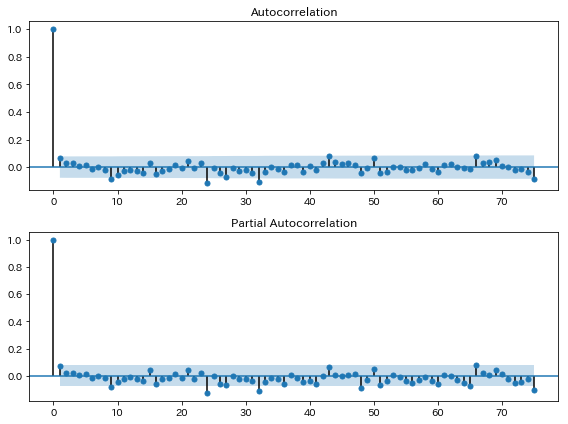

In [637]:
# order=(8, 1, 1)
sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(8, 1, 1),
    seasonal_order=(1, 1, 1, 24),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()
sarimax.summary()
sarimax_resid = sarimax.resid
fig = plt.figure(figsize=(8, 6))
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 
plt.tight_layout()

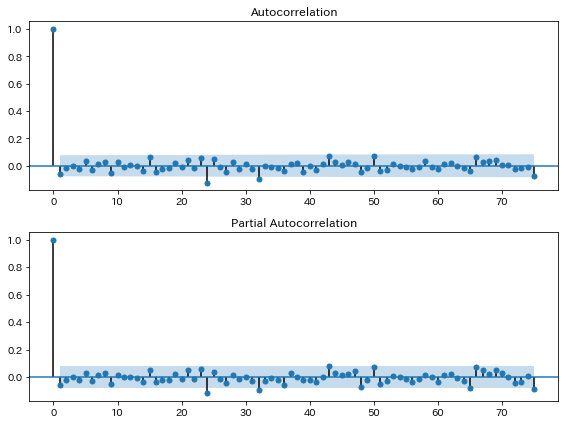

In [638]:
# order=(10, 1, 1)
sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(10, 1, 1),
    seasonal_order=(1, 1, 1, 24),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()
sarimax.summary()
sarimax_resid = sarimax.resid
fig = plt.figure(figsize=(8, 6))
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 
plt.tight_layout()

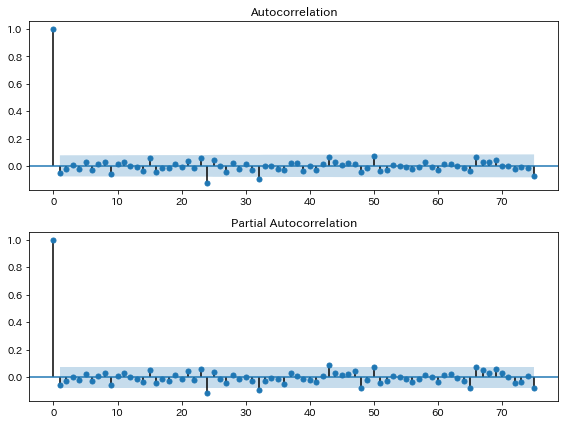

In [639]:
# order=(12, 1, 1)
sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(12, 1, 1),
    seasonal_order=(1, 1, 1, 24),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()
sarimax.summary()
sarimax_resid = sarimax.resid
fig = plt.figure(figsize=(8, 6))
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 
plt.tight_layout()

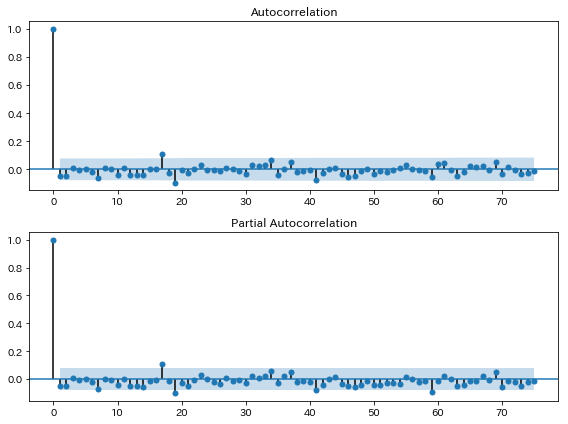

In [277]:
# order=(13, 1, 1)
sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(13, 1, 1),
    seasonal_order=(1, 1, 1, 1),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()
sarimax.summary()
sarimax_resid = sarimax.resid
fig = plt.figure(figsize=(8, 6))
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 
plt.tight_layout()

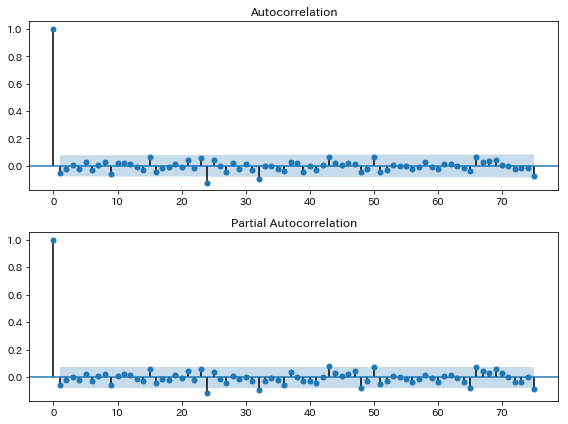

In [640]:
# order=(14, 1, 1)
sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(14, 1, 1),
    seasonal_order=(1, 1, 1, 24),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()
sarimax.summary()
sarimax_resid = sarimax.resid
fig = plt.figure(figsize=(8, 6))
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 
plt.tight_layout()

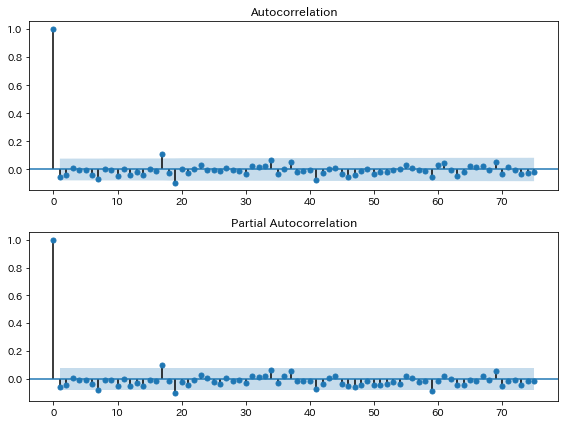

In [279]:
# order=(15, 1, 1)
sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(15, 1, 1),
    seasonal_order=(1, 1, 1, 1),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()
sarimax.summary()
sarimax_resid = sarimax.resid
fig = plt.figure(figsize=(8, 6))
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 
plt.tight_layout()

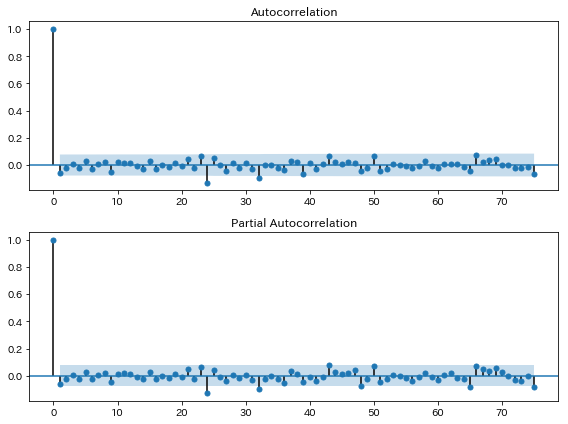

In [641]:
# order=(16, 1, 1)
sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(16, 1, 1),
    seasonal_order=(1, 1, 1, 24),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()
sarimax.summary()
sarimax_resid = sarimax.resid
fig = plt.figure(figsize=(8, 6))
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 
plt.tight_layout()

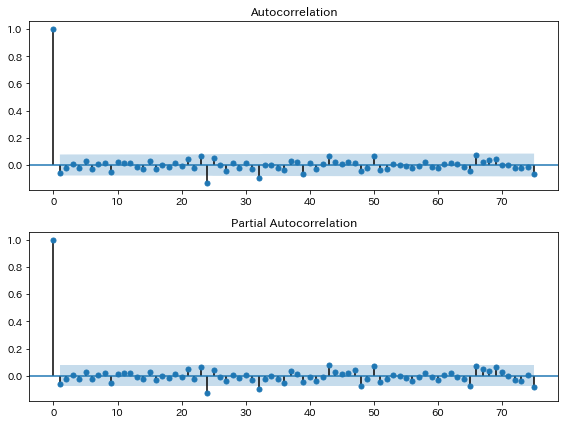

In [642]:
# order=(17, 1, 1)
sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(17, 1, 1),
    seasonal_order=(1, 1, 1, 24),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()
sarimax.summary()
sarimax_resid = sarimax.resid
fig = plt.figure(figsize=(8, 6))
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 
plt.tight_layout()

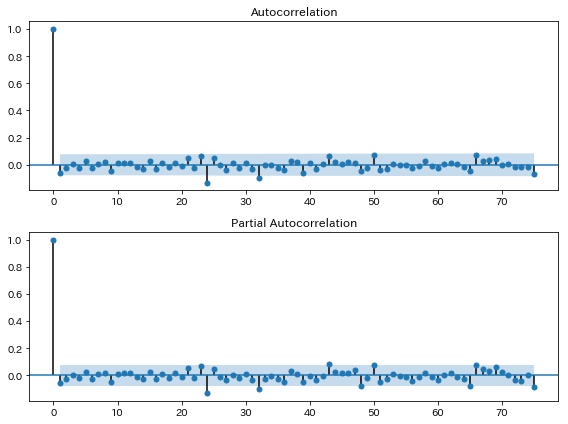

In [643]:
# order=(18, 1, 1)
sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(18, 1, 1),
    seasonal_order=(1, 1, 1, 24),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()
sarimax.summary()
sarimax_resid = sarimax.resid
fig = plt.figure(figsize=(8, 6))
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 
plt.tight_layout()

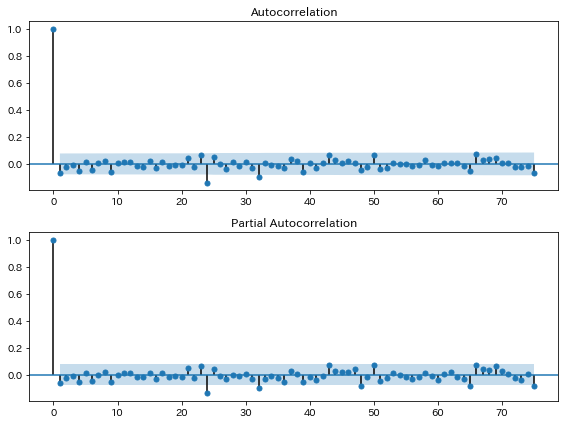

In [644]:
# order=(19, 1, 1)
sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(19, 1, 1),
    seasonal_order=(1, 1, 1, 24),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()
sarimax.summary()
sarimax_resid = sarimax.resid
fig = plt.figure(figsize=(8, 6))
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 
plt.tight_layout()

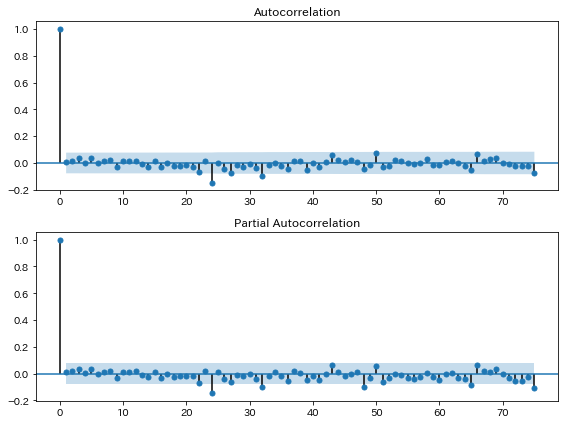

In [645]:
# order=(20, 1, 1)
sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(20, 1, 1),
    seasonal_order=(1, 1, 1, 24),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()
sarimax.summary()
sarimax_resid = sarimax.resid
fig = plt.figure(figsize=(8, 6))
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 
plt.tight_layout()

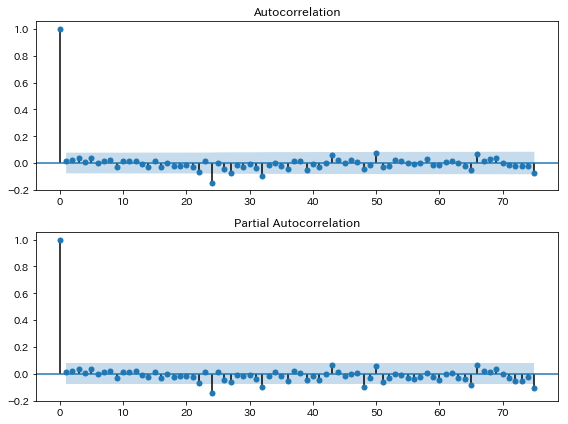

In [646]:
# order=(21, 1, 1)
sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(21, 1, 1),
    seasonal_order=(1, 1, 1, 24),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()
sarimax.summary()
sarimax_resid = sarimax.resid
fig = plt.figure(figsize=(8, 6))
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 
plt.tight_layout()

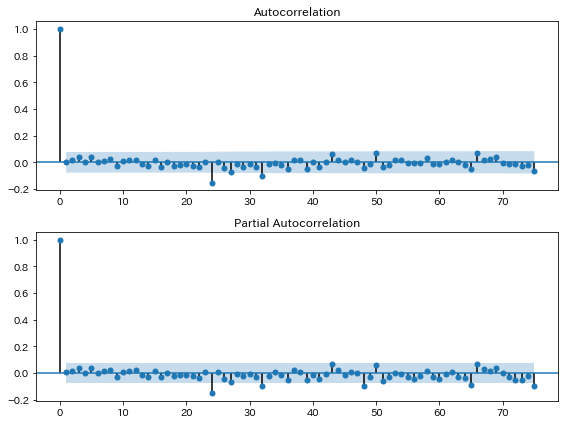

In [647]:
# order=(23, 1, 1)
sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(23, 1, 1),
    seasonal_order=(1, 1, 1, 24),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()
sarimax.summary()
sarimax_resid = sarimax.resid
fig = plt.figure(figsize=(8, 6))
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 
plt.tight_layout()

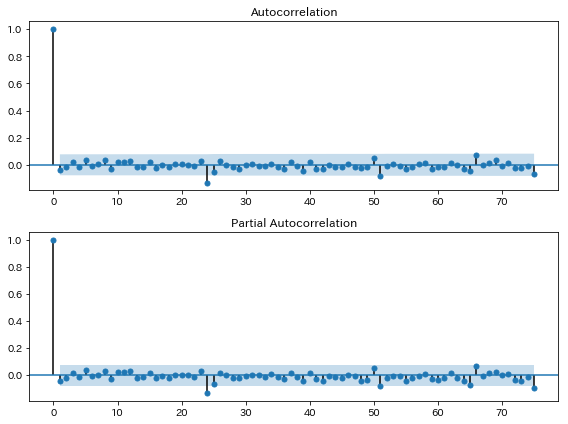

In [648]:
# order=(48, 1, 1)
sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(48, 1, 1),
    seasonal_order=(1, 1, 1, 24),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()
sarimax.summary()
sarimax_resid = sarimax.resid
fig = plt.figure(figsize=(8, 6))
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 
plt.tight_layout()

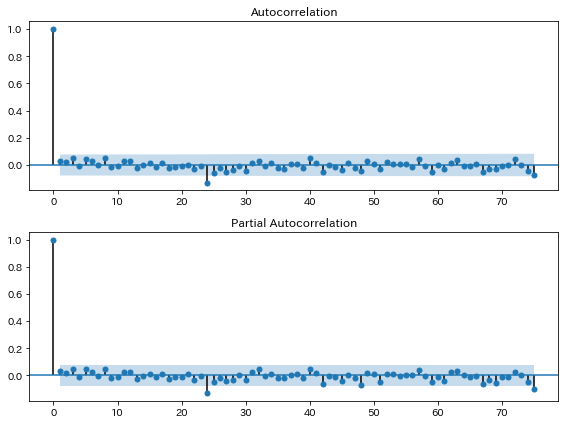

In [649]:
# order=(72, 1, 1)
sarimax = sm.tsa.SARIMAX(
    df_temp6n,
    order=(72, 1, 1),
    seasonal_order=(1, 1, 1, 24),
    enforce_stationarity=False,
    enforce_invertibility=False).fit()
sarimax.summary()
sarimax_resid = sarimax.resid
fig = plt.figure(figsize=(8, 6))
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(sarimax_resid, lags=MAX_LAG, ax=ax1) 
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(sarimax_resid, lags=MAX_LAG, ax=ax2) 
plt.tight_layout()

## SARIMAX

自己相関
（ACF: Autocorrelation Function）  
偏自己相関
（PACF:Pertial Autocorrelation Function）  
SARIMA : Seasonal AutoRegressive Integrated Moving Average    
（季節自己回帰和分移動平均）

ARMA(AR+MA) + I =  ARIMA  
ARIMA + S   =  SARIMA   

https://www.statsmodels.org/dev/generated/statsmodels.tsa.statespace.sarimax.SARIMAX.html

statsmodels.tsa.statespace.sarimax.SARIMAX(  
    endog,  
    exog=None,  
    order=(1, 0, 0),  
    seasonal_order=(0, 0, 0, 0),  
    trend=None,  
    measurement_error=False,  
    time_varying_regression=False,  
    mle_regression=True,  
    simple_differencing=False,  
    enforce_stationarity=True,  
    enforce_invertibility=True,  
    hamilton_representation=False,  
    concentrate_scale=False,  
    **kwargs)

## SARIMAパラメータ最適化

モデルパラメータの設定を総当たり実施

In [653]:
# note that need to execute time below code

import warnings
warnings.filterwarnings('ignore')

# order(p, d, q)
min_p = 1
max_p = 2
min_d = 0
max_d = 2
min_q = 0
max_q = 2

# seasonal_order(sp, sd, sq)
min_sp = 0
max_sp = 1
min_sd = 0
max_sd = 1
min_sq = 0
max_sq = 1

test_pattern = (max_p - min_p + 1) * (max_q - min_q + 1) * (
    max_d - min_d + 1) * (max_sp - min_sp + 1) * (max_sq - min_sq + 1) * (
        max_sd - min_sd + 1)
print("pattern:", test_pattern)

sfq = 24
ts = df_temp6n

test_results = pd.DataFrame(
    index=range(test_pattern), columns=["model_parameters", "aic"])
num = 0
for p in range(min_p, max_p + 1):
    for d in range(min_d, max_d + 1):
        for q in range(min_q, max_q + 1):
            for sp in range(min_sp, max_sp + 1):
                for sd in range(min_sd, max_sd + 1):
                    for sq in range(min_sq, max_sq + 1):
                        sarima = sm.tsa.SARIMAX(
                            ts,
                            order=(p, d, q),
                            seasonal_order=(sp, sd, sq, sfq),
                            enforce_stationarity=False,
                            enforce_invertibility=False).fit()
                        test_results.iloc[num][
                            "model_parameters"] = "order=(" + str(
                                p) + "," + str(d) + "," + str(
                                    q) + "), seasonal_order=(" + str(
                                        sp) + "," + str(sd) + "," + str(
                                            sq) + ")"
                        test_results.iloc[num]["aic"] = sarima.aic
                        print(num, '/', test_pattern - 1,
                              test_results.iloc[num]["model_parameters"],
                              test_results.iloc[num]["aic"])
                        num = num + 1

print(test_results[test_results.aic == min(test_results.aic)])

pattern: 144
0 / 143 order=(1,0,0), seasonal_order=(0,0,0) 5777.146091026672
1 / 143 order=(1,0,0), seasonal_order=(0,0,1) 5413.219228481644
2 / 143 order=(1,0,0), seasonal_order=(0,1,0) 5891.067401657127
3 / 143 order=(1,0,0), seasonal_order=(0,1,1) 4571.433409371393
4 / 143 order=(1,0,0), seasonal_order=(1,0,0) 5253.606837165464
5 / 143 order=(1,0,0), seasonal_order=(1,0,1) 4612.375640313025
6 / 143 order=(1,0,0), seasonal_order=(1,1,0) 5323.517851975407
7 / 143 order=(1,0,0), seasonal_order=(1,1,1) 4576.896879528388
8 / 143 order=(1,0,1), seasonal_order=(0,0,0) 5516.526649701564
9 / 143 order=(1,0,1), seasonal_order=(0,0,1) 5297.257013135227
10 / 143 order=(1,0,1), seasonal_order=(0,1,0) 5891.08375198077
11 / 143 order=(1,0,1), seasonal_order=(0,1,1) 4567.928565397337
12 / 143 order=(1,0,1), seasonal_order=(1,0,0) 5211.46899868714
13 / 143 order=(1,0,1), seasonal_order=(1,0,1) 4609.046203848231
14 / 143 order=(1,0,1), seasonal_order=(1,1,0) 5323.773035350156
15 / 143 order=(1,0,1), 

126 / 143 order=(2,2,0), seasonal_order=(1,1,0) 6010.577756785076
127 / 143 order=(2,2,0), seasonal_order=(1,1,1) 5180.633369033783
128 / 143 order=(2,2,1), seasonal_order=(0,0,0) 5274.729547252569
129 / 143 order=(2,2,1), seasonal_order=(0,0,1) 5157.554002876194
130 / 143 order=(2,2,1), seasonal_order=(0,1,0) 5993.547926531254
131 / 143 order=(2,2,1), seasonal_order=(0,1,1) 4619.63730833372
132 / 143 order=(2,2,1), seasonal_order=(1,0,0) 5132.195804980382
133 / 143 order=(2,2,1), seasonal_order=(1,0,1) 4660.948974096893
134 / 143 order=(2,2,1), seasonal_order=(1,1,0) 5408.322743239387
135 / 143 order=(2,2,1), seasonal_order=(1,1,1) 4621.347585391444
136 / 143 order=(2,2,2), seasonal_order=(0,0,0) 5272.988240654055
137 / 143 order=(2,2,2), seasonal_order=(0,0,1) 5154.887310269193
138 / 143 order=(2,2,2), seasonal_order=(0,1,0) 5951.504745702658
139 / 143 order=(2,2,2), seasonal_order=(0,1,1) 4625.758356629629
140 / 143 order=(2,2,2), seasonal_order=(1,0,0) 5130.614206920873
141 / 143 o

order=(2,1,2), seasonal_order=(0,1,1)  4598.73

In [703]:
ar = sm.tsa.ARIMA(temp6n,order=(2,0,2))
model_ar = ar.fit()

In [705]:
y_pred = sarimax.predict()

In [706]:
df_temp6n["y_pred"] = y_pred

In [707]:
# 学習データを予測させる
df_temp6n["error"] = (df_temp6n["temp"] - df_temp6n["y_pred"])**2  #　誤差の2乗

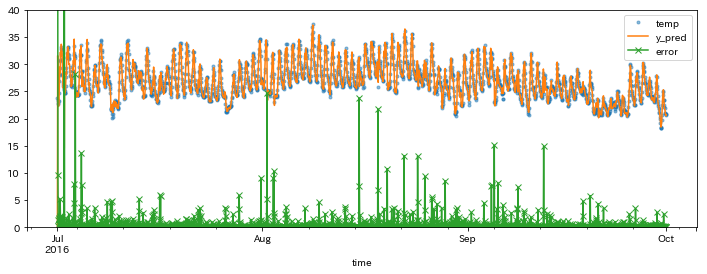

In [708]:
plt.figure(figsize=(12, 4))
df_temp6n["temp"].plot(marker=".", ls="",alpha=0.5)
df_temp6n["y_pred"].plot( ls="-")
df_temp6n["error"].plot(marker="x", ls="-")
plt.ylim([0, 40])
plt.xlabel("time")
plt.legend(["temp", "y_pred", "error"])

誤差大の数値を確認

In [719]:
df_temp6n["error"].sort_values(ascending=False)[:10]

time
2016-07-01 01:00:00    566.440000
2016-07-02 01:00:00    214.143640
2016-07-02 02:00:00    112.894421
2016-07-01 02:00:00     65.528233
2016-07-03 18:00:00     28.154655
2016-08-01 17:00:00     24.717837
2016-08-15 15:00:00     23.830077
2016-08-18 11:00:00     21.810890
2016-09-05 01:00:00     15.132931
2016-09-12 12:00:00     14.972483
Name: error, dtype: float64

# Linear Regression

### 気温VS搬送者

<Figure size 576x360 with 0 Axes>

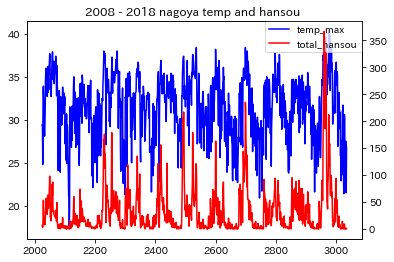

In [736]:
# temp vs hansou
fig = plt.figure(figsize=(8, 5))
fig, ax1 = plt.subplots()

ax2 = ax1.twinx()

ax1.plot(dfw[dfw.pref == 'nagoya'].temp_max, 'b-')
ax2.plot(dfw[dfw.pref == 'nagoya'].total_hansou, 'r-')

handler1, label1 = ax1.get_legend_handles_labels()
handler2, label2 = ax2.get_legend_handles_labels()

plt.title('2008 - 2018 nagoya temp and hansou ')

ax1.legend(handler1 + handler2, label1 + label2, loc=1, 
           borderaxespad=0.)

### 相対湿度VS搬送者

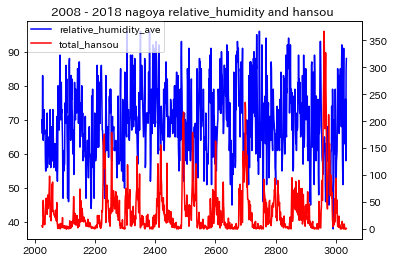

In [737]:
# relative humidity vs hansou

fig, ax1 = plt.subplots()
 
ax2 = ax1.twinx()
 
ax1.plot(dfw[dfw.pref == 'nagoya'].relative_humidity_ave, 'b-')
ax2.plot(dfw[dfw.pref == 'nagoya'].total_hansou, 'r-')
 
handler1, label1 = ax1.get_legend_handles_labels()
handler2, label2 = ax2.get_legend_handles_labels()

plt.title('2008 - 2018 nagoya relative_humidity and hansou ')

ax1.legend(handler1 + handler2, label1 + label2, loc=2, borderaxespad=0.)

### WBGT（湿球黒球温度）VS搬送者

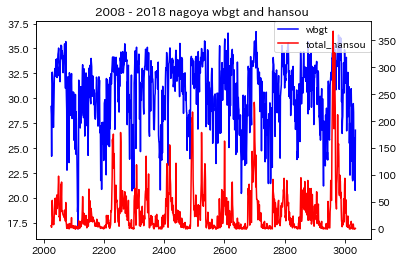

In [738]:
# wbgt vs hansou

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()

ax1.plot(dfw[dfw.pref == 'nagoya'].wbgt, 'b-')
ax2.plot(dfw[dfw.pref == 'nagoya'].total_hansou, 'r-')

handler1, label1 = ax1.get_legend_handles_labels()
handler2, label2 = ax2.get_legend_handles_labels()

plt.title('2008 - 2018 nagoya wbgt and hansou ')

ax1.legend(handler1 + handler2, label1 + label2, loc=1, borderaxespad=0.)

In [176]:
# import pandas as pd
# import numpy as np
from datetime import datetime as dt

In [746]:
dfw[dfw.pref=='fukuoka']

(1012, 19)

In [177]:
# df6wn_1=df6wn.groupby(df6wn.index.date).max()
# df7wn_1=df7wn.groupby(df7wn.index.date).max()
# df8wn_1=df8wn.groupby(df8wn.index.date).max()

## １日最大気温　2008 - 2018 名古屋

Text(0.5,1,'2008 - 2018 nagoya ')

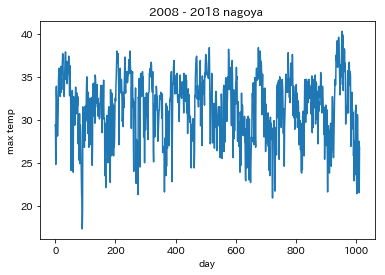

In [754]:
# max values in a day
X=arange(1012)
plt.plot(X,dfw[dfw.pref=='nagoya'].temp_max)
plt.xlabel('day')
plt.ylabel('max temp')
plt.title('2008 - 2018 nagoya ')

## Linear Regression plot

coef :  [8.16] intercept :  -224.691


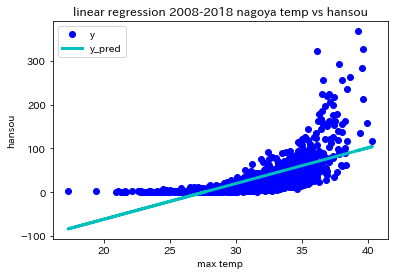

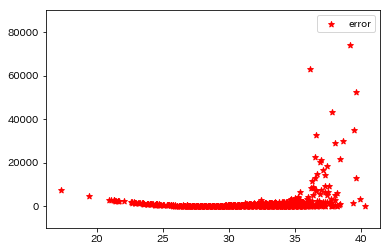

In [857]:
# max temp

x= dfw[dfw.pref=='nagoya'].temp_max.values
y= dfw[dfw.pref=='nagoya'].total_hansou.values

X = x.reshape(-1,1)
reg = LinearRegression()
reg.fit(X, y)
print("coef : ", reg.coef_, "intercept : ", reg.intercept_.round(3))

y_pred = reg.predict(X)
error = (y - y_pred)**2

plt.plot(x, y, 'bo')
plt.plot(x, y_pred, marker='',linewidth=3, ls="-",c='c')

plt.legend(["y", "y_pred"])
plt.xlabel("max temp")
plt.ylabel("hansou")
plt.title("linear regression 2008-2018 nagoya temp vs hansou")

plt.show()

plt.scatter(x, error, marker="*",c="r")

plt.legend(["error"])
plt.ylim([-10000,90000])
plt.show()

In [756]:
error[error.argsort(axis=0)[::-1][:3]]

array([73911.73, 63081.01, 52259.61])

In [759]:
dfw[dfw.pref=='nagoya'].iloc[error.argsort(axis=0)[::-1][:3]]

,date,pref,temp_max,sr_sum,wind_speed_ave,relative_humidity_ave,total_hansou,sinseiji,nyuyouji,shonen,seijin,kourei,fumei,dead,jyusho,chusho,keisho,etc,wbgt
2961,2018-07-18,nagoya,39.2,26.35,2.7,61,367,0,9,38,162,158,0,1,13,100,253,0,36.729188
2962,2018-07-19,nagoya,36.1,21.69,3.2,65,321,0,4,33,131,153,0,0,13,76,232,0,34.732917
2966,2018-07-23,nagoya,39.6,28.77,4.9,46,327,0,3,30,108,186,0,1,15,82,229,0,34.386052


搬送者は非線形で増加しており、linearでは追従できでないことが分かる  

coef :  [-1.34] intercept :  125.61


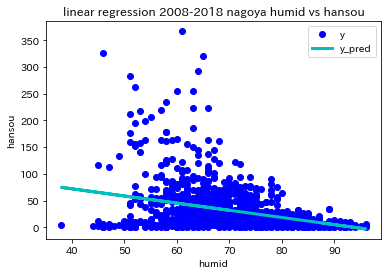

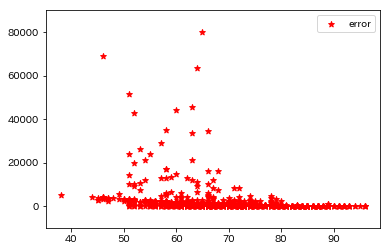

In [803]:
# humid

x= dfw[dfw.pref=='nagoya'].relative_humidity_ave.values
y= dfw[dfw.pref=='nagoya'].total_hansou.values

X = x.reshape(-1,1)
reg = LinearRegression()
reg.fit(X, y)
print("coef : ", reg.coef_, "intercept : ", reg.intercept_.round(3))

y_pred = reg.predict(X)
error = (y - y_pred)**2

plt.plot(x, y, 'bo')
plt.plot(x, y_pred, marker='',linewidth=3, ls="-",c='c')

plt.legend(["y", "y_pred"])
plt.xlabel("humid")
plt.ylabel("hansou")
plt.title("linear regression 2008-2018 nagoya humid vs hansou")
plt.show()


plt.scatter(x, error, marker="*",c="r")
plt.ylim([-10000,90000])
plt.legend(["error"])
plt.show()

In [766]:
error[error.argsort(axis=0)[::-1][:3]]

array([104455.61,  79840.29,  69210.96])

coef :  [3.15] intercept :  -19.91


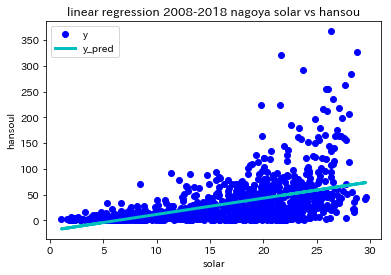

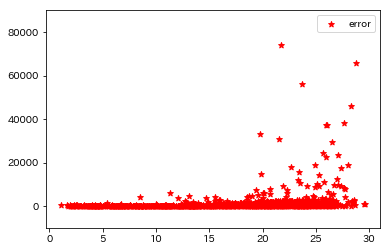

In [806]:
# solar

x=dfw[dfw.pref=='nagoya'].sr_sum.values
y= dfw[dfw.pref=='nagoya'].total_hansou.values

X = x.reshape(-1,1)
reg = LinearRegression()
reg.fit(X, y)
print("coef : ", reg.coef_, "intercept : ", reg.intercept_.round(3))

y_pred = reg.predict(X)
error = (y - y_pred)**2

plt.plot(x, y, 'bo')
plt.plot(x, y_pred, marker='', linewidth=3, ls="-",c='c')

plt.legend(["y", "y_pred"])
plt.xlabel("solar")
plt.ylabel("hansoul")
plt.title("linear regression 2008-2018 nagoya solar vs hansou")
plt.show()

plt.scatter(x, error, marker="*",c="r")
plt.legend(["error"])
plt.ylim([-10000,90000])
plt.show()

coef :  [8.07] intercept :  -214.201


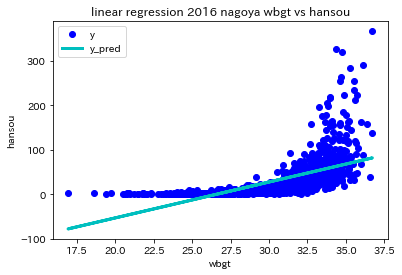

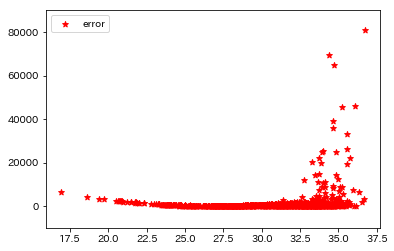

In [807]:
# max wbgt

x=dfw[dfw.pref=='nagoya'].wbgt.values
y= dfw[dfw.pref=='nagoya'].total_hansou.values

X = x.reshape(-1,1)
reg = LinearRegression()
reg.fit(X, y)
print("coef : ", reg.coef_, "intercept : ", reg.intercept_.round(3))

y_pred = reg.predict(X)
error = (y - y_pred)**2

plt.plot(x, y, 'bo')
plt.plot(x, y_pred, marker='',linewidth=3, ls="-",c='c')

plt.legend(["y", "y_pred"])
plt.xlabel("wbgt")
plt.ylabel("hansou")
plt.title("linear regression 2016 nagoya wbgt vs hansou")
plt.show()

plt.scatter(x, error, marker="*",c="r")
plt.legend(["error"])
plt.ylim([-10000,90000])
plt.show()

最大気温、日射量、WBGTは各数値が上昇すると搬送者も増加しており、右肩上がりの直線回帰がおよそ当てはまっているように見えるが、一部のデータで誤差が大きい結果となった。下記HP報告によると年齢の影響が無視できないレベルであり、それが反映された誤差である可能性が否定できない（高齢化の進展と個人差）

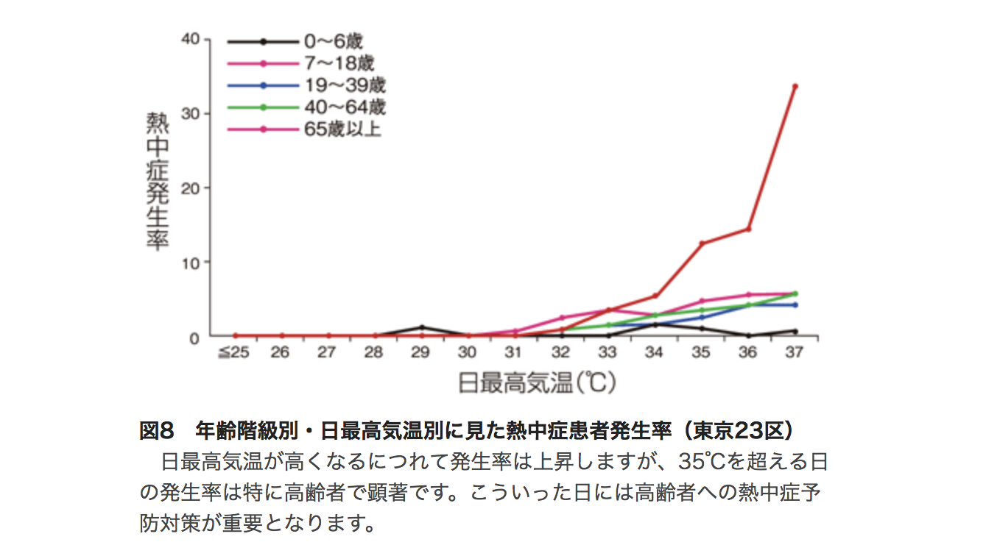
国立環境研究所HP
http://www.nies.go.jp/kanko/kankyogi/32/10-11.html

高齢者を除いた「成人」が搬送された人数と最大気温との関係を確認

coef :  [3.4] intercept :  -93.726


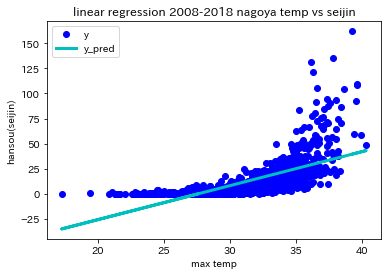

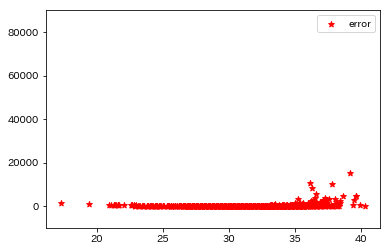

In [858]:
# max temp vs hansou (seijin)

x = dfw[dfw.pref == 'nagoya'].temp_max.values
y = dfw[dfw.pref == 'nagoya'].seijin.values

X = x.reshape(-1, 1)
reg = LinearRegression()
reg.fit(X, y)
print("coef : ", reg.coef_, "intercept : ", reg.intercept_.round(3))

y_pred = reg.predict(X)
error = (y - y_pred)**2

plt.plot(x, y, 'bo')
plt.plot(x, y_pred, marker='', linewidth=3, ls="-", c='c')

plt.legend(["y", "y_pred"])
plt.xlabel("max temp")
plt.ylabel("hansou(seijin)")
plt.title("linear regression 2008-2018 nagoya temp vs seijin")

plt.show()

plt.scatter(x, error, marker="*", c="r")

plt.legend(["error"])
plt.ylim([-10000,90000])
plt.show()

In [809]:
error[error.argsort(axis=0)[::-1][:3]]

array([15037.5 , 10435.27, 10076.35])

入力を最高気温、出力をそれぞれ搬送者合計、搬送者（成人）、  
とした時の誤差比較

In [812]:
15037.5/73911.73

0.2034521448760569

３５℃以上の誤差は認められるが誤差の値は約１／５となり、  
搬送者が増加している要因として気温以外に高齢化もあるといえる  

# RANSAC

RANSAC (RANdom SAmple Consensus) fits a model from random subsets of inliers from the complete data set.

RANSAC is a non-deterministic algorithm producing only a reasonable result with a certain probability, which is dependent on the number of iterations (see max_trials parameter). It is typically used for linear and non-linear regression problems and is especially popular in the fields of photogrammetric computer vision.

The algorithm splits the complete input sample data into a set of inliers, which may be subject to noise, and outliers, which are e.g. caused by erroneous measurements or invalid hypotheses about the data. The resulting model is then estimated only from the determined inliers.

In [859]:
from sklearn.linear_model import LinearRegression,RANSACRegressor
ransac = RANSACRegressor(LinearRegression())

In [860]:
x = dfw[dfw.pref == 'nagoya'].temp_max.values
y = dfw[dfw.pref == 'nagoya'].seijin.values

In [861]:
X = x.reshape(-1,1)
ransac.fit(X,y)

RANSACRegressor(base_estimator=LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False),
        is_data_valid=None, is_model_valid=None, loss='absolute_loss',
        max_skips=inf, max_trials=100, min_samples=None, random_state=None,
        residual_metric=None, residual_threshold=None, stop_n_inliers=inf,
        stop_probability=0.99, stop_score=inf)

In [862]:
inlier_mask = ransac.inlier_mask_
outlier_mask = np.logical_not(inlier_mask)#反転
outlier_mask

array([ True,  True,  True, ..., False, False, False])

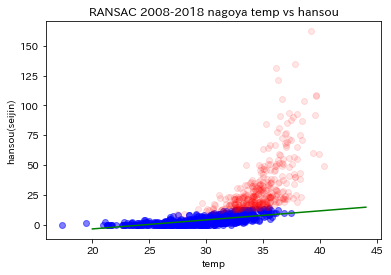

In [863]:
line_X = np.arange(20,45,1)
line_Y = ransac.predict(line_X[:,np.newaxis])
plt.scatter(X[inlier_mask],y[inlier_mask],c="blue",marker="o",label="Intliers",alpha=0.5)
plt.scatter(X[outlier_mask],y[outlier_mask],c="red",marker="o",label="Outliers",alpha=0.1)
plt.plot(line_X,line_Y,color="green")

plt.xlabel("temp")
plt.ylabel("hansou(seijin)")
plt.title("RANSAC 2008-2018 nagoya temp vs hansou")
plt.show()

線形回帰より外れ値の影響を受けにくい

# Support Vector Regression

In [864]:
x = dfw[dfw.pref == 'nagoya'].temp_max.values
y = dfw[dfw.pref == 'nagoya'].seijin.values

In [865]:
X = x.reshape(-1,1)
svr_lin = SVR(kernel='linear', C=1)
svr_rbf1 = SVR(kernel='rbf', C=10, gamma=0.01)
svr_rbf2 = SVR(kernel='rbf', C=20, gamma=0.05)
y_lin = svr_lin.fit(X, y).predict(X)
y_rbf1 = svr_rbf1.fit(X, y).predict(X)
y_rbf2 = svr_rbf2.fit(X, y).predict(X)

## plot

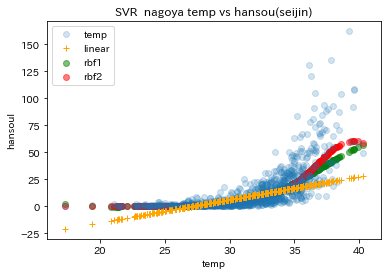

In [866]:
# 学習結果の描画
plt.plot(x, y, 'o', alpha=0.2,label='temp')
plt.plot(x, y_lin, '+', c="orange",label='linear')
plt.scatter(x, y_rbf1, c="g",alpha=0.5,label='rbf1')
plt.scatter(x, y_rbf2, c="r",alpha=0.5,label='rbf2')

plt.xlabel("temp")
plt.ylabel("hansou")
plt.legend()
plt.title("SVR  nagoya temp vs hansou(seijin)")
plt.xlabel("temp")
plt.ylabel("hansoul")
plt.show()

## Grid Search

In [867]:

from sklearn.preprocessing import MinMaxScaler

X_train = X
y_train = y

scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
#X_test  = scaler.transform(X_test)

In [868]:
clf = SVR()

In [869]:
C_range_exp = np.arange(-1.0, 5.0, 1)
C_range = 10**C_range_exp

# gamma range
gamma_range_exp = np.arange(-1.0, 5.0, 1)
gamma_range = 10**gamma_range_exp

epsilon_range = np.arange(-1.0, 5.0, 1)
epsilon_range = 10**epsilon_range

# linear = no gamma  exist
# rbf = gamma exist

param = [{
    'C': C_range,
    'epsilon': epsilon_range,
    'kernel': ['linear']
},
         {
             'C': C_range,
             'gamma': gamma_range,
             'epsilon': epsilon_range,
             'kernel': ['rbf']
         }]

In [870]:
from sklearn.model_selection import GridSearchCV

gs = GridSearchCV(clf, param, n_jobs=-1, verbose=1)
gs.fit(X_train, y_train)

Fitting 3 folds for each of 252 candidates, totalling 756 fits


[Parallel(n_jobs=-1)]: Done 756 out of 756 | elapsed:   35.1s finished


GridSearchCV(cv=None, error_score='raise',
       estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='auto',
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid=[{'C': array([1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04]), 'epsilon': array([1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04]), 'kernel': ['linear']}, {'C': array([1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04]), 'gamma': array([1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04]), 'epsilon': array([1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04]), 'kernel': ['rbf']}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

## best param plot

In [871]:
gs.best_params_,gs.best_score_,gs.best_estimator_

({'C': 10.0, 'epsilon': 1.0, 'gamma': 1.0, 'kernel': 'rbf'},
 -4.4757676098238015,
 SVR(C=10.0, cache_size=200, coef0=0.0, degree=3, epsilon=1.0, gamma=1.0,
   kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False))

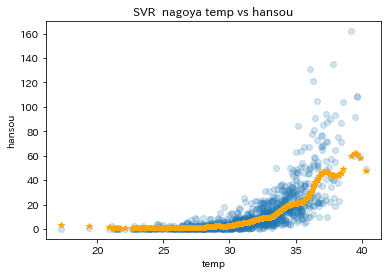

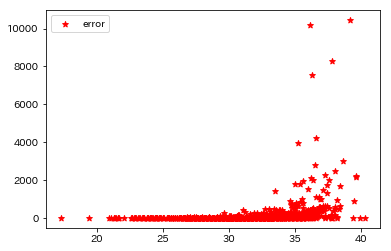

In [876]:
X = x.reshape(-1,1)

svr = SVR(C=10,epsilon=1,kernel='rbf',degree=3,gamma=1.0)

plt.plot(x, y, 'o', alpha=0.2)
y_pred = svr.fit(X, y).predict(X)
plt.plot(x, y_pred, '*', c="orange")

plt.xlabel("temp")
plt.ylabel("hansoul")
plt.title("SVR  nagoya temp vs hansou")
plt.xlabel("temp")
plt.ylabel("hansou")
plt.show()

error = (y - y_pred)**2

plt.legend(["y", "y_pred"])
plt.scatter(x, error, marker="*",c="r")
plt.legend(["error"])

plt.show()

In [877]:
error[error.argsort(axis=0)[::-1]][:3]

array([10437.14, 10201.01,  8308.29])

In [879]:
dfw.iloc[error.argsort(axis=0)[::-1][:3]]

,date,pref,temp_max,sr_sum,wind_speed_ave,relative_humidity_ave,total_hansou,sinseiji,nyuyouji,shonen,seijin,kourei,fumei,dead,jyusho,chusho,keisho,etc,wbgt
0,2018-07-23,tokyo,39.0,21.30,2.9,59,406,0,2,28,140,236,0,0,34,161,211,0,36.533153
2,2018-07-18,nagoya,39.2,26.35,2.7,61,367,0,9,38,162,158,0,1,13,100,253,0,36.729188
3,2018-07-19,osaka,38.0,27.86,2.4,59,353,0,3,48,126,176,0,0,3,99,251,0,35.185637


・誤差大の傾向は上記LinearRegressionと同様   
・SVRだと直線回帰で追従できない範囲まで対応できているが、３７℃以上は追従しきれていない

# 疎構造

疎構造学習の結果を用いて異常検知を計算される際、多変量正規分布を用いた異常検知も実施してみて、その結果を比較するとおもしろいと思います

北海道から沖縄まで距離が離れた地点の気温データの相関を確認してみる

In [215]:
from sklearn.covariance import GraphLasso
import sklearn
from sklearn.preprocessing import StandardScaler
from IPython.display import Image, display

import pydot # for node plot with graphviz

In [880]:
dfw.head()

,date,pref,temp_max,sr_sum,wind_speed_ave,relative_humidity_ave,total_hansou,sinseiji,nyuyouji,shonen,seijin,kourei,fumei,dead,jyusho,chusho,keisho,etc,wbgt
0,2018-07-23,tokyo,39.0,21.30,2.9,59,406,0,2,28,140,236,0,0,34,161,211,0,36.533153
1,2018-07-18,osaka,37.0,26.48,2.2,62,398,0,5,50,175,168,0,1,6,102,288,1,34.881298
2,2018-07-18,nagoya,39.2,26.35,2.7,61,367,0,9,38,162,158,0,1,13,100,253,0,36.729188
3,2018-07-19,osaka,38.0,27.86,2.4,59,353,0,3,48,126,176,0,0,3,99,251,0,35.185637
4,2018-07-18,tokyo,35.3,24.65,3.0,75,341,0,5,10,142,184,0,0,15,146,180,0,35.263768


In [942]:
t_tko=dfw[dfw.pref=='tokyo'].temp_max.values
t_ngo=dfw[dfw.pref=='nagoya'].temp_max.values
t_osk=dfw[dfw.pref=='osaka'].temp_max.values
t_sap=dfw[dfw.pref=='sapporo'].temp_max.values
t_nha=dfw[dfw.pref=='naha'].temp_max.values
t_fuk=dfw[dfw.pref=='fukuoka'].temp_max.values
t_kof=dfw[dfw.pref=='kofu'].temp_max.values

t = pd.DataFrame(
    [t_sap, t_tko, t_kof, t_ngo, t_osk, t_fuk, t_nha],
    index=['sapporo', 'tokyo', 'kofu', 'nagoya', 'osaka', 'fukuoka', 'naha'])

In [943]:
t.shape

(7, 1012)

In [944]:
X=t.T[:460] # 2008-2013

# 標準化
sc = StandardScaler()
sc.fit(X)
X = sc.transform(X)

## 気温のヒストグラムと散布図 2008-2013

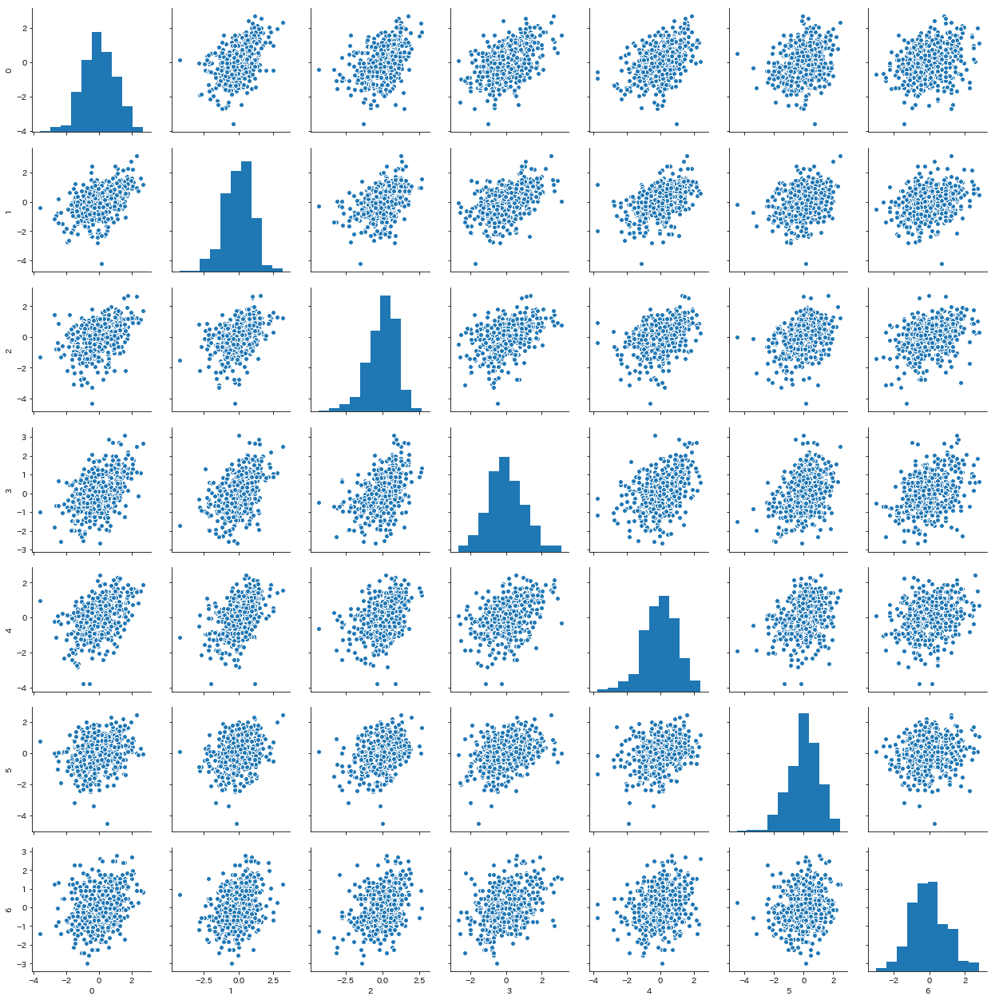

In [945]:
sns.pairplot(pd.DataFrame(X))

In [946]:
# parametars
alpha = 0.01 # L１正則化パラメーター
M = X.shape[1]
label = t.index

## GraphicalLasso Model in sklearn

In [947]:
model = GraphLasso(
    alpha=alpha, max_iter=300, verbose=True, assume_centered=True)
model.fit(X)
cov_ = model.covariance_  # 分散共分散行列
prec_ = model.precision_  # 精度行列

[graph_lasso] Iteration   0, cost  3.11e+01, dual gap -8.856e-03
[graph_lasso] Iteration   1, cost  3.11e+01, dual gap 2.203e-05


## HeatMap 1st

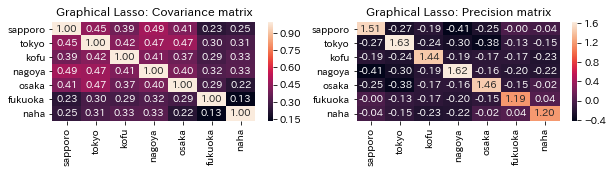

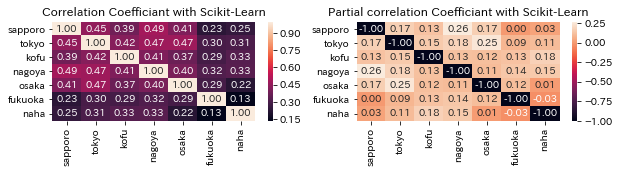

In [948]:
# Scikit LearnのGraphical Lassoの結果表示

plt.figure(figsize=(10, 4))
ax = plt.subplot(221)
sns.heatmap(
    cov_, annot=cov_, fmt='0.2f', ax=ax, xticklabels=label, yticklabels=label)
plt.title("Graphical Lasso: Covariance matrix")

ax = plt.subplot(222)
sns.heatmap(
    prec_,
    annot=prec_,
    fmt='0.2f',
    ax=ax,
    xticklabels=label,
    yticklabels=label)
plt.title("Graphical Lasso: Precision matrix")

# 相関行列の算出
cor = np.empty_like(cov_)
for i in range(M):
    for j in range(M):
        cor[i, j] = cov_[i, j] / np.sqrt(cov_[i, i] * cov_[j, j])

# 偏相関行列の算出
rho = np.empty_like(prec_)
for i in range(M):
    for j in range(M):
        rho[i, j] = -prec_[i, j] / np.sqrt(prec_[i, i] * prec_[j, j])

plt.figure(figsize=(10, 4))

ax = plt.subplot(223)
sns.heatmap(
    pd.DataFrame(cor),
    annot=cor,
    fmt='0.2f',
    ax=ax,
    xticklabels=label,
    yticklabels=label)
plt.title("Correlation Coefficiant with Scikit-Learn")


ax = plt.subplot(224)
sns.heatmap(
    pd.DataFrame(rho),
    annot=rho,
    fmt='0.2f',
    ax=ax,
    xticklabels=label,
    yticklabels=label)
plt.title("Partial correlation Coefficiant with Scikit-Learn")
plt.show()

In [949]:
# Display graph without saving using pydot
def viewPydot(pdot):
    plt = Image(pdot.create_png())
    display(plt)

In [966]:
def Disp_Gaussian_Graphical_Model(model,feature_names,th=0.2):
    pre_ = model.precision_ 
     
    pre_zero=pre_-np.diag(np.diag(pre_))
     
    g = pydot.Dot(graph_type='graph')
    df = pd.DataFrame(index=feature_names.tolist(),
                      columns=feature_names.tolist(), 
                      data=pre_zero.tolist())
     
    #ノードを追加
    for c in df.columns:
        node = pydot.Node(c)
        g.add_node(node)
    #エッジを追加    
    for i in df.index:
        for c in df.columns:
            if c>=i:

                if abs(df.loc[i, c]) > th:
                    edge = pydot.Edge(g.get_node(i)[0], g.get_node(c)[0],
                                      penwidth=5*abs(df.loc[i, c]))
                    edge.set_label('{:.1f}'.format(df.loc[i, c]))
                    g.add_edge(edge)
     
    nodeList = g.get_node_list()
    num_edges=np.sum(abs(pre_zero) > th, axis=0)
    max_num_edges=max(np.amax(num_edges),1)
    for i in range(len(df.index)):        
        node = nodeList[i]
        # H S Vの順 Sを変更
        color=str(0)+" "+str(num_edges[i]/max_num_edges)+" "+str(1)
        node.set_color("black") #nodeの輪郭の色
        node.set_fillcolor(color) #nodeの中身の色
        node.set_style('filled')  
    viewPydot(g)

## plot node model 1st

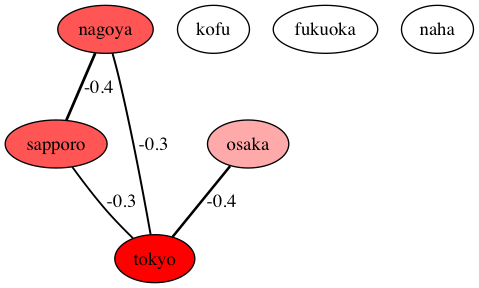

In [978]:
Disp_Gaussian_Graphical_Model(model,feature_names=label,th=0.25)

## Cross Validation 

In [968]:
edge_model = sklearn.covariance.GraphLassoCV()
X = StandardScaler().fit_transform(X)
edge_model.fit(X)

GraphLassoCV(alphas=4, assume_centered=False, cv=None, enet_tol=0.0001,
       max_iter=100, mode='cd', n_jobs=1, n_refinements=4, tol=0.0001,
       verbose=False)

## HeatMap 2nd(after CV)

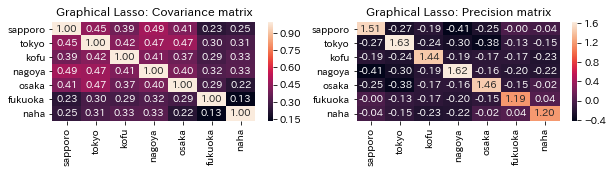

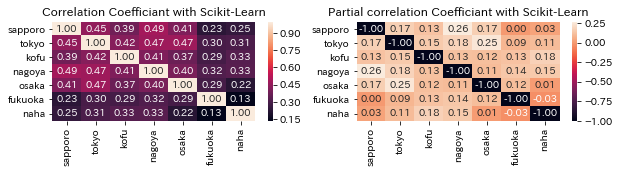

In [969]:
plt.figure(figsize=(10, 4))
ax = plt.subplot(221)
sns.heatmap(
    cov_, annot=cov_, fmt='0.2f', ax=ax, xticklabels=label, yticklabels=label)
plt.title("Graphical Lasso: Covariance matrix")

ax = plt.subplot(222)
sns.heatmap(
    prec_,
    annot=prec_,
    fmt='0.2f',
    ax=ax,
    xticklabels=label,
    yticklabels=label)
plt.title("Graphical Lasso: Precision matrix")

# 相関行列の算出
cor = np.empty_like(cov_)
for i in range(M):
    for j in range(M):
        cor[i, j] = cov_[i, j] / np.sqrt(cov_[i, i] * cov_[j, j])

# 偏相関行列の算出
rho = np.empty_like(prec_)
for i in range(M):
    for j in range(M):
        rho[i, j] = -prec_[i, j] / np.sqrt(prec_[i, i] * prec_[j, j])

plt.figure(figsize=(10, 4))

ax = plt.subplot(223)
sns.heatmap(
    pd.DataFrame(cor),
    annot=cor,
    fmt='0.2f',
    ax=ax,
    xticklabels=label,
    yticklabels=label)
plt.title("Correlation Coefficiant with Scikit-Learn")

ax = plt.subplot(224)
sns.heatmap(
    pd.DataFrame(rho),
    annot=rho,
    fmt='0.2f',
    ax=ax,
    xticklabels=label,
    yticklabels=label)
plt.title("Partial correlation Coefficiant with Scikit-Learn")
plt.show()

## plot node model 2nd(after CV)

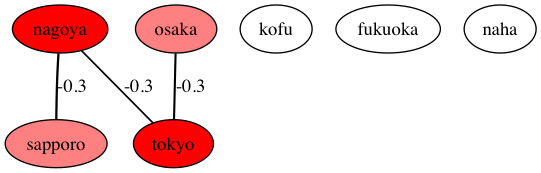

In [979]:
Disp_Gaussian_Graphical_Model(edge_model,feature_names=label,th=0.25)

alpha = : 0.0797966703438447


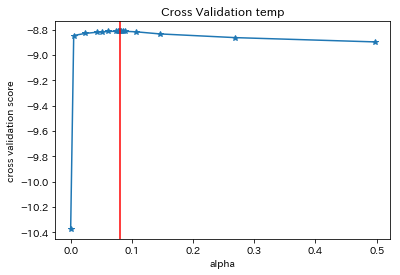

In [971]:
# cross validation for selected alpha

plt.title("Cross Validation temp")
plt.plot(edge_model.cv_alphas_,np.mean(edge_model.grid_scores_,axis=1),'*-')
plt.xlabel('alpha')
print("alpha = :",edge_model.alpha_)
plt.ylabel('cross validation score')
plt.axvline(edge_model.alpha_,c='r')
plt.show()

## 2014-2018 temp data

In [972]:
X1=t.T[461:] # 2014-2018

# 標準化
sc = StandardScaler()
sc.fit(X1)
X1 = sc.transform(X1)

In [962]:
# t1=t1.dropna(axis=1)

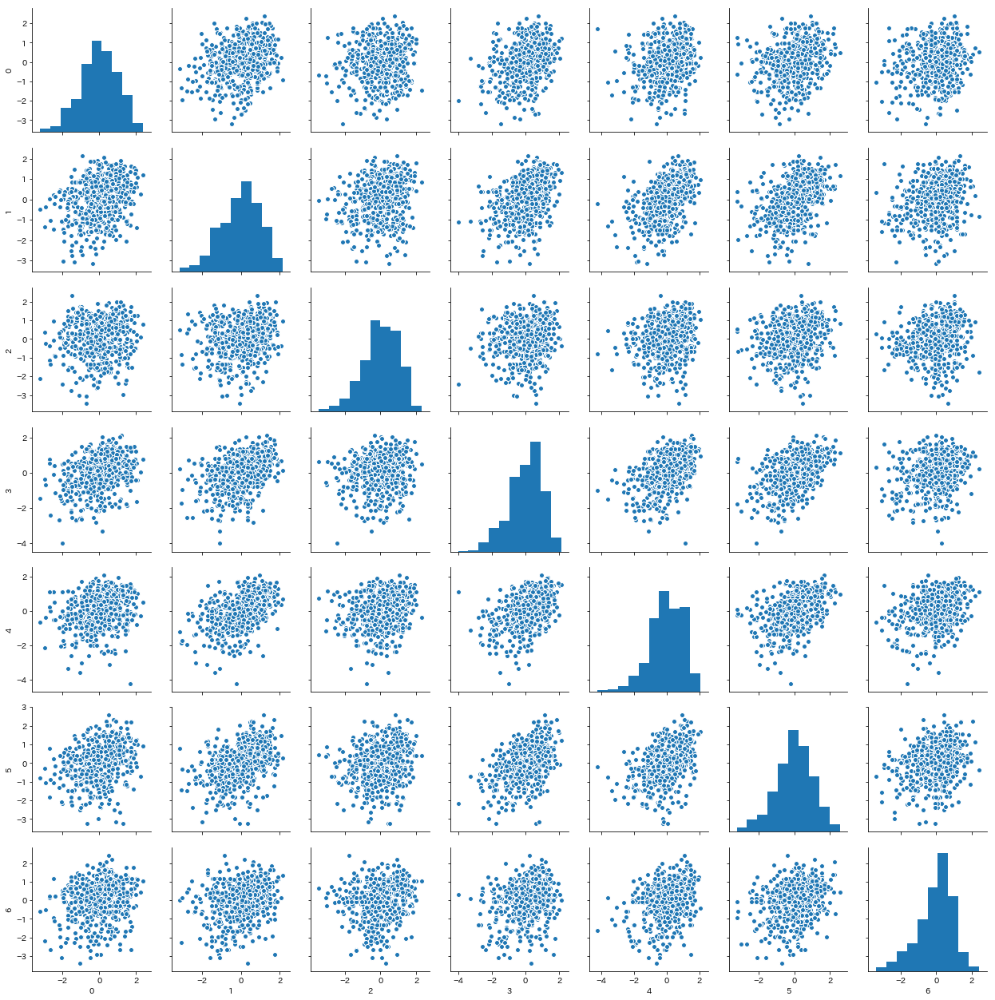

In [973]:
sns.pairplot(pd.DataFrame(X1))

## Cross Validation

In [974]:
M = X1.shape[1]
label = t.index
edge_model1 = sklearn.covariance.GraphLassoCV()
edge_model1.fit(X1)

GraphLassoCV(alphas=4, assume_centered=False, cv=None, enet_tol=0.0001,
       max_iter=100, mode='cd', n_jobs=1, n_refinements=4, tol=0.0001,
       verbose=False)

## plot node model -2013 vs -2018

-2018


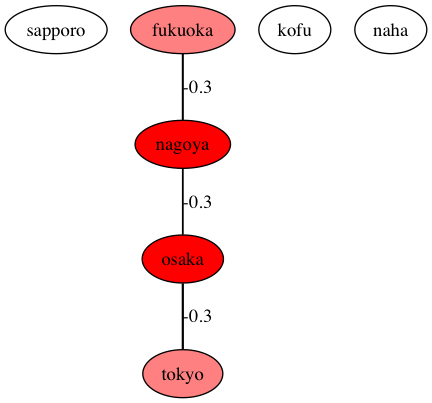

-2013


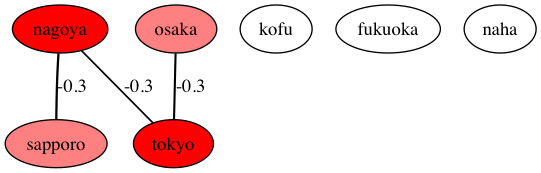

In [977]:
print("-2018")
Disp_Gaussian_Graphical_Model(edge_model1, feature_names=label,th=0.25) 
print("-2013")
Disp_Gaussian_Graphical_Model(edge_model,  feature_names=label,th=0.25) 

上記から、2008-2013 と　2014-2018では、福岡と札幌が本州（東京、名古屋、大坂）と日別最高気温の関連性に変化を生じている可能性が有り得る。

## 関連性の有無を別の方法にて確認

Text(0.5,1,'2008-2013 temp')

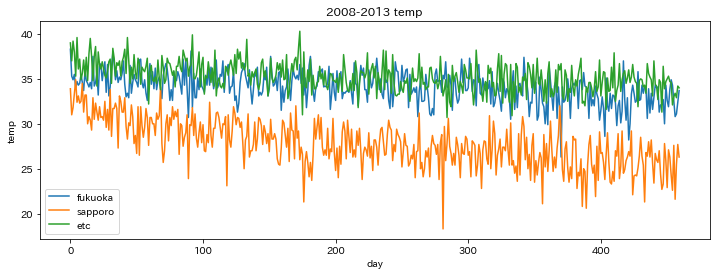

In [1000]:
xn=arange(460)
e1=dfw.temp_max[:460]
f1=dfw.temp_max[dfw.pref=='fukuoka'][:460]
s1=dfw.temp_max[dfw.pref=='sapporo'][:460]
plt.figure(figsize=[12,4])
plt.plot(xn,f1,xn,s1,xn,e1)
plt.xlabel('day')
plt.ylabel('temp')
plt.legend(['fukuoka','sapporo','etc'])
plt.title('2008-2013 temp')

array([[1.  , 0.29],
       [0.29, 1.  ]])

array([[1.  , 0.06],
       [0.06, 1.  ]])

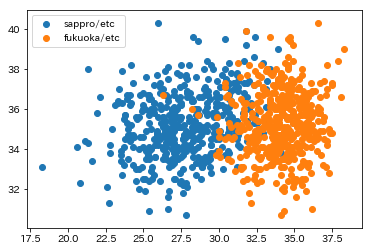

In [1020]:
# 2008-2013
plt.scatter(s1,e1)
plt.scatter(f1,e1)
plt.legend(['sappro/etc','fukuoka/etc'])
display(np.corrcoef(s1,e1))
display(np.corrcoef(f1,e1))

2008-2010までの最高気温を比較すると、札幌の方が福岡より本州との相関が高い

Text(0.5,1,'2014-2018 temp')

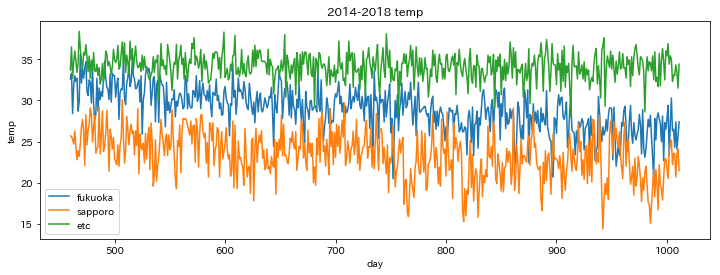

In [1001]:
xn2=arange(460,1012)
e2=dfw.temp_max[460:1012]
f2=dfw.temp_max[dfw.pref=='fukuoka'][460:1012]
s2=dfw.temp_max[dfw.pref=='sapporo'][460:1012]
plt.figure(figsize=[12,4])
plt.plot(xn2,f2,xn2,s2,xn2,e2)
plt.xlabel('day')
plt.ylabel('temp')
plt.legend(['fukuoka','sapporo','etc'])
plt.title('2014-2018 temp')

array([[1.  , 0.03],
       [0.03, 1.  ]])

array([[1.  , 0.11],
       [0.11, 1.  ]])

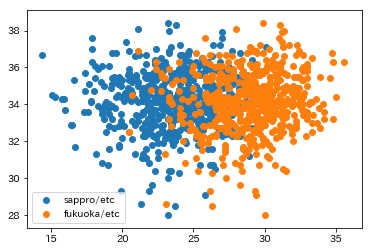

In [1021]:
plt.scatter(s2,e2)
plt.scatter(f2,e2)
plt.legend(['sappro/etc','fukuoka/etc'])
display(np.corrcoef(s2,e2))
display(np.corrcoef(f2,e2))

一方、2014-2018までの最高気温は福岡の方が札幌より本州との相関が高い

# ガウス過程

In [1022]:
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.gaussian_process import kernels as sk_kern

##  -2013 temp train data

In [1027]:
# -2013
y_train=dfw.temp_max[0:460].values
x_train= np.arange(0,460)

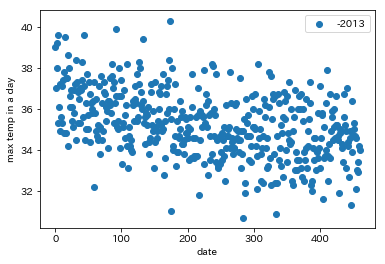

In [1028]:
plt.scatter(x_train, y_train, label="-2013")
plt.ylabel("max temp in a day")
plt.xlabel("date")
plt.legend()
plt.show()

## rbf kernel

In [1029]:
kern = sk_kern.RBF(length_scale=.1)

In [1030]:
kernel = sk_kern.RBF(1.0, (1e-3, 1e3)) + sk_kern.ConstantKernel(
    1.0, (1e-3, 1e3)) + sk_kern.WhiteKernel()

clf = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-1,
    optimizer="fmin_l_bfgs_b",
    n_restarts_optimizer=50,
    normalize_y=True)

In [1031]:
clf.fit(x_train.reshape(-1,1), y_train)

GaussianProcessRegressor(alpha=0.1, copy_X_train=True,
             kernel=RBF(length_scale=1) + 1**2 + WhiteKernel(noise_level=1),
             n_restarts_optimizer=50, normalize_y=True,
             optimizer='fmin_l_bfgs_b', random_state=None)

In [1032]:
clf.kernel_

RBF(length_scale=240) + 0.0316**2 + WhiteKernel(noise_level=2.02)

## prediction

In [1044]:
x_test = np.linspace(0,920, 1500).reshape(-1, 1) 
pred_mean, pred_std= clf.predict(x_test, return_std=True)

In [1045]:
Z_95 = 1.96  # 95% confidence
Z_995 = 2.576 # 99.7 % confidence

def plot_result(x_test, mean, std):
    plt.plot(x_test[:, 0], mean, color="C0", label="predict mean")
    plt.fill_between(
        x_test[:, 0],
        mean + Z_95 * std,
        mean - Z_95 * std,
        color="green",
        alpha=0.3,
        label=" 95% confidence")
    plt.plot(x_train, y_train, "o", label="training data")

## plot

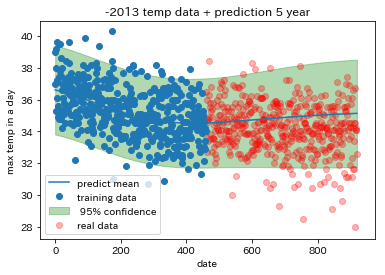

In [1075]:
xn3 = arange(460,920)
plot_result(x_test, pred_mean, pred_std)
plt.scatter(xn3,dfw.temp_max[460:920].values,c='r',alpha=0.3,label='real data')
plt.title("-2013 temp data + prediction 5 year")
plt.ylabel("max temp in a day")
plt.xlabel("date")
plt.legend()

２０１３までのデータで５年後を予測した結果、低温側に多く異常を検知

# まとめ

あくまで個人的印象ですが以下に適用した結果の概要を示します。

|No |適用手法 |評価と実施内容など |
|---|---|---|
|1 |正規分布 |△：適用は容易も本件では検知性能が低くなった。 |
| 2 | 混合正規分布 |△：２分布を分離できたがノイズ除去としては不十分。 |
| 3 | 近傍法 |△：適用は容易も本件では外れ値を検出しきれず。　|
| 4 | LOF |△：適用は容易も本件では外れ値を検出しきれず。 　|
| 5 | １クラスSVM |◎：外れ値を検出できた上、目視でも一定の説得性有り。　|
| 6 | SVDD |×：試行レベルに留まり本データへの適用は不十分。　|
| 7 | 主成分分析 |○：影響の小さい特徴量の次元削減を実行した。　|
| 8 | 密度比推定 |×：試行レベルで本データへの適用は不十分。　|
| 9 | AutoRegressive |○：自己相関の影響を除去し異常検知は出来た。　 |
| 10 | LinearRegression |△：非線形のため誤差大となった。　|
| 11 | RANSAC |○：LRよりは性能良い結果。　|
| 12 | SVR |○：LRよりは性能良い結果。　|
| 13 | グラフィカルラッソ |◎：気温の関係性の変化を検知できた。|
| 14 | ガウス過程 |○：一定条件のもとで異常検知は出来た。 |

+ 上記データを見る限りWBGT簡易試算方式を使わず気温のみでも
   熱中症対策としての異常検知になり得るのでは？  
+ ①外れ値は１クラスSVMを適用して気温と湿度に注意し、②周期の変化はAR、③地域的変化はグラフィカルラッソ、④異常検知の将来予測はガウス過程、を適用したらどうか？


# 通し課題に取り組んだ感想

１　今回、幅広く（１４種類＋浅く）手法を取り入れてみた一方で異常気象に対する深い洞察まで手が回らなかった。  
２　異常検知の主なツールの概略の特徴を掴めたことにより具体的な適用場面を逃さず積極的に捉えることができそうに思えた。  
３　異常の定義に関して必要性等の背景によって幾段にも設定し得る難しさを感じた一方で改善や工夫を検討する余地はありそう。  
４　異常気象について知識が深まった。  
５　pythonの基本的な知識（時系列処理、データ変換、グラフ化など）も不足しており手間取った。  
６　機械学習などの理論的背景について興味をもって調べたり取り組むことができた。    
  →引き続き基本的な理論の習得や最新の研究などの取り込みと現実問題への実践をしていきたい。

有難うございました。


以上